For the toy simulation we need to generate:
 - $KE_{init}$ : initial kinetic energy
 - $KE_{int}$ : interacting kinetic energy
 - $z_{int}$ : 1D interacting vertex

The toy will simulate particles in an infinite volume of LAr, so there is no end of the detector or upstream loss to consider.

To generate $KE_{init}$ any PDF can be used, if we want to mimic the ProtoDUNE SP beam profile we can extract values from $KE^{true}_{init}$.
To genrate $KE_{int}$ and $z_{int}$, we can sample from a pdf which represents the probability of interacting with LAr. The probability of a particle interacting in a medium is related to the mean free path ($\lambda(E)$) of that material and it's path length distribution:

### $$ P_{int}(E, l) = \int^{l}_{0} p(E, l')dl' = \int^{l}_{0} \frac{1}{\lambda(E)} e^{-\frac{l'}{\lambda(E)}} dl' = 1 - e^{-\frac{l}{\lambda(E)}};\; \lambda(E) = \frac{M_{Ar}}{\sigma(E)N_{A}\rho} $$

### $$ \therefore P_{int}(E, l) = 1 - e^{-\sigma(E)\frac{N_{A}\rho l}{M_{Ar}}} $$

So for thin and energy slice measurements $l$ is the spatial slice thickness, but for the toy model, this is our sampling rate i.e. how often do we check if a particle has interacted. Particles loose energy as they travel through a medium, so whilst checking if the particle has interacted, we must compute the enegy lost by the particle as it travels a distance $l$, so use the bethe bloch formula for this:

### $$ E_{i + 1} = E_{i} - l \left< \frac{dE}{dX} \right>_{bb}(E_{i}) $$

The simulation procedure will be as follows (using rejection sampling to figure out if the particle interacted):
 1. Generate $KE_init$, set particle $KE_{int} = KE_{init}$ and distance travelled $dz_{int} = 0$
 2. Generate a random number from a uniform distribution U
 3. Find $P_{int}(KE_{int})$
 4. If $U < P_{int}(KE_{int})$ stop here, otherwise go to step 5
 5. Update $KE_{int}$ using the bethe bloch formula, update distsance travelled $z_{int} + l$, repeat from step 1.

if the particle Kinetic energy is zero, stop and assume it has decayed.

This is for one cross section $\sigma$ but a particle can interact in multiple distinguished ways, so rather than having one PDF for interactions we must sample from multiple to figure out which one occured. For a total inelastic cross section, we do the following (pcking up from step 4):

 5. For each cross section channel $j$ check $U < P^{j}_{int}(KE_{int})$, if this is true, stop otherwise try the next channel. If this is not true for all channels stop.

The PDFs themselves must also be created. From the Geant4 simulation we have plots which represent $\sigma(KE)$ but we do not have the exact formula, so an "emperical" formula is made by using interpolation. This constrains the toy from only being able to model cross sections for particles within the energy ranges defined by the Geant4 cross section plots.

In [10]:
%matplotlib inline
%load_ext autoreload
%autoreload 2
#* magic to add python path to notebook environment
import sys
pypath = sys.path[0]
%env PYTHONPATH $pypath

#* Ynirui's toy example https://github.com/Yinrui-Liu/hadron-Ar_XS/blob/main/hadron-Ar_XS.ipynb

from apps import cex_toy_generator, cex_toy_parameters
from python.analysis import cross_section, Plots, Master, Tags

import awkward as ak
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy.stats as stats
from scipy.stats import norm, lognorm

from rich import print

cross_section.SetPlotStyle(dark = True, dpi = 100)

def truth_regions(events : Master.Data) -> dict:
    """ masks to select particle which interact in a particular channel or "region". these truth regions reflect the channels defined in the simulation.

    Args:
        events (Master.Data): events to look at.

    Returns:
        dict: dictionary of masks.
    """
    inelastic = events.trueParticles.true_beam_endProcess == "pi+Inelastic"
    absorption = inelastic & (events.trueParticles.nPiPlus == 0) & (events.trueParticles.nPi0 == 0) & (events.trueParticles.nPiMinus == 0)
    cex = (events.trueParticles.nPiPlus == 0) & (events.trueParticles.nPi0 == 1) & (events.trueParticles.nPiMinus == 0)
    quasielastic = (events.trueParticles.nPiPlus == 1) & (events.trueParticles.nPi0 == 0) & (events.trueParticles.nPiMinus == 0)
    double_cex = (events.trueParticles.nPiPlus == 0) & (events.trueParticles.nPi0 == 0) & (events.trueParticles.nPiMinus == 1)
    pion_production = inelastic & (~absorption) & (~cex) & (~quasielastic) & ~(double_cex)
    return {"total_inelastic" : inelastic, "absorption" : absorption, "charge_exchange" : cex, "quasielastic" : quasielastic, "double_charge_exchange" : double_cex, "pion_production" : pion_production}


def GenerateStudentT(num : int, mu : float, sigma : float, nu : float):
    # https://www.jstor.org/stable/2153537?seq=1&cid=pdf-reference#references_tab_contents

    x = np.array([])
    while len(x) < num:
        u = 2 * np.random.random(num) - 1
        v = 2 * np.random.random(num) - 1
        w = u**2 + v**2
        reject = w > 1

        c = u/(w**0.5)
        r = (nu * (w**(-2/nu) - 1))**0.5
        rc = r*c
        x = np.concatenate([x, rc[~reject]])
    return mu + (x[0:num]*sigma)/(nu**0.5)


def ComputeQuantities(config : str, beam_selection_masks : str = None):
    args = cross_section.ApplicationArguments.ResolveConfig(cross_section.LoadConfiguration(config))
    mc = Master.Data(args.mc_file, -1, nTuple_type = args.ntuple_type)

    if beam_selection_masks is not None:
        beam_selection_masks = cross_section.LoadSelectionFile(beam_selection_masks)
        for m in beam_selection_masks:
            mc.Filter([beam_selection_masks[m]["mc"]], [beam_selection_masks[m]["mc"]])

    true_pion_mask = mc.trueParticles.pdg[:, 0] == 211
    mc.Filter([true_pion_mask], [true_pion_mask])
    reco_upstream_loss = cross_section.UpstreamEnergyLoss(cross_section.KE(mc.recoParticles.beam_inst_P, cross_section.Particle.from_pdgid(211).mass), args.upstream_loss_correction_params["value"])
    
    reco_KE_ff = cross_section.KE(mc.recoParticles.beam_inst_P, cross_section.Particle.from_pdgid(211).mass) - reco_upstream_loss
    reco_KE_int = reco_KE_ff - cross_section.RecoDepositedEnergy(mc, reco_KE_ff, "bb")
    reco_track_length = mc.recoParticles.beam_track_length

    true_KE_ff = mc.trueParticles.beam_KE_front_face
    true_KE_int = mc.trueParticles.beam_traj_KE[:, -2]
    true_track_length = mc.trueParticles.beam_track_length

    return {
        "reco" : {"KE_init" : reco_KE_ff, "KE_int" : reco_KE_int, "z_int" : reco_track_length},
        "true" : {"KE_init" : true_KE_ff, "KE_int" : true_KE_int, "z_int" : true_track_length}
    }, truth_regions(mc)


def CreateConfig(PDSP : int = 1, p_init : float = 1000, events : int = 50805, seed : int = None, verbose : bool = False, modified_PDFs : dict[np.array] = None, scale_factors : dict[float] = None, beam_width : float = 60, step : float = 2, smearing = "double_crystal_ball", beam_profile : str = "gaussian"):
    return {
    "events" : events,
    "step" : step,
    "p_init" : p_init,
    "beam_profile" : beam_profile,
    "beam_width" : beam_width,


    "smearing_params" : {
        "KE_init" : f"/home/sb16165/Documents/pi0-analysis/analysis/work/2023/PDSPProd4a_MC_{PDSP}GeV_reco1_sce_datadriven_v1_ntuple_v09_41_00_03/toy_parameters/smearing/KE_init/{smearing}.json",
        "KE_int" : f"/home/sb16165/Documents/pi0-analysis/analysis/work/2023/PDSPProd4a_MC_{PDSP}GeV_reco1_sce_datadriven_v1_ntuple_v09_41_00_03/toy_parameters/smearing/KE_int/{smearing}.json",
        "z_int" : f"/home/sb16165/Documents/pi0-analysis/analysis/work/2023/PDSPProd4a_MC_{PDSP}GeV_reco1_sce_datadriven_v1_ntuple_v09_41_00_03/toy_parameters/smearing/z_int/{smearing}.json"
    },
    "reco_region_fractions" : f"/home/sb16165/Documents/pi0-analysis/analysis/work/2023/PDSPProd4a_MC_{PDSP}GeV_reco1_sce_datadriven_v1_ntuple_v09_41_00_03/toy_parameters/reco_regions/reco_region_fractions.hdf5",
    "beam_selection_efficiencies" : f"/home/sb16165/Documents/pi0-analysis/analysis/work/2023/PDSPProd4a_MC_{PDSP}GeV_reco1_sce_datadriven_v1_ntuple_v09_41_00_03/toy_parameters/pi_beam_efficiency/beam_selection_efficiencies_true.hdf5",
    "mean_track_score_kde" : f"/home/sb16165/Documents/pi0-analysis/analysis/work/2023/PDSPProd4a_MC_{PDSP}GeV_reco1_sce_datadriven_v1_ntuple_v09_41_00_03/toy_parameters/meanTrackScoreKDE/kdes.dill",
    "pdf_scale_factors" : scale_factors,
    "verbose" : verbose,
    "seed" : seed,
    "modified_PDFs" : modified_PDFs
    }


The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
env: PYTHONPATH=/home/sb16165/Documents/pi0-analysis/analysis


In [11]:
toy_gaussian = cross_section.Toy(file = "work/2023/toys/xs_toy_2GeV_cb_template.hdf5")

geant_xs = cross_section.GeantCrossSections(energy_range = [0, 2000])

toy_gaussian.df.head()

,KE_init,KE_int,z_int,inclusive_process,exclusive_process,KE_int_smeared,KE_init_smeared,z_int_smeared,absorption,charge_exchange,...,beam_selection_mask,reco_regions_absorption,reco_regions_charge_exchange,reco_regions_single_pion_production,reco_regions_pion_production,truth_regions_absorption,truth_regions_charge_exchange,truth_regions_single_pion_production,truth_regions_pion_production,mean_track_score
0,1954.548167,1686.137419,114.0,total_inelastic,pion_production,1600.767513,1918.391694,115.018676,False,False,...,True,True,False,False,False,False,False,False,True,0.949970
1,1951.081263,1553.513508,169.5,total_inelastic,absorption,1508.249361,1927.351094,170.175835,True,False,...,False,False,False,False,True,True,False,False,False,0.512300
2,1654.778181,1600.037790,23.5,total_inelastic,double_charge_exchange,1666.359392,1669.572660,23.219371,False,False,...,True,False,False,True,False,False,False,True,False,0.770218
3,1944.201214,1692.296824,107.0,total_inelastic,quasielastic,1573.632924,1940.068802,108.216949,False,False,...,False,False,False,False,True,False,False,True,False,0.662368
4,1910.164466,1873.530813,15.5,total_inelastic,pion_production,1874.038295,1891.733615,14.675808,False,False,...,False,True,False,False,False,False,False,False,True,0.757528


In [12]:
pdf = Plots.PlotBook("xs_toy.pdf", open = True)

pdf xs_toy.pdf has been opened


In [13]:
scales = {}
for v in geant_xs.exclusive_processes:
    scales[v] = 1

scales["charge_exchange"] = 1
scales["absorption"] = 2
print(scales)

{'absorption': 2, 'quasielastic': 1, 'charge_exchange': 1, 'double_charge_exchange': 1, 'pion_production': 1}

/home/sb16165/Documents/pi0-analysis/analysis/apps/cex_toy_generator.py:154: RuntimeWarning: divide by zero encountered in divide
  ratio = sum_xs / xs_sim.total_inelastic # the amount per data point to scale each exclusive process by, such that the total inelastic cross section remains unchanged
/home/sb16165/Documents/pi0-analysis/analysis/apps/cex_toy_generator.py:154: RuntimeWarning: invalid value encountered in divide
  ratio = sum_xs / xs_sim.total_inelastic # the amount per data point to scale each exclusive process by, such that the total inelastic cross section remains unchanged
/tmp/ipykernel_48257/2525703789.py:16: RuntimeWarning: divide by zero encountered in divide
  ratio = sum_xs / geant_xs.total_inelastic # the amount per data point to scale each exclusive process by, such that the total inelastic cross section remains unchanged
/tmp/ipykernel_48257/2525703789.py:16: RuntimeWarning: invalid value encountered in divide
  ratio = sum_xs / geant_xs.total_inelastic # the am

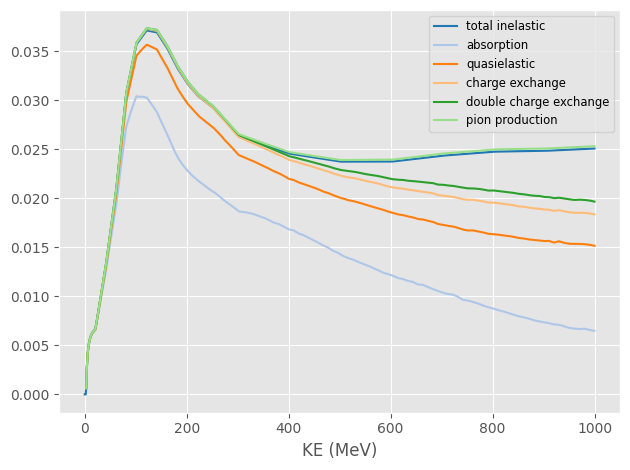

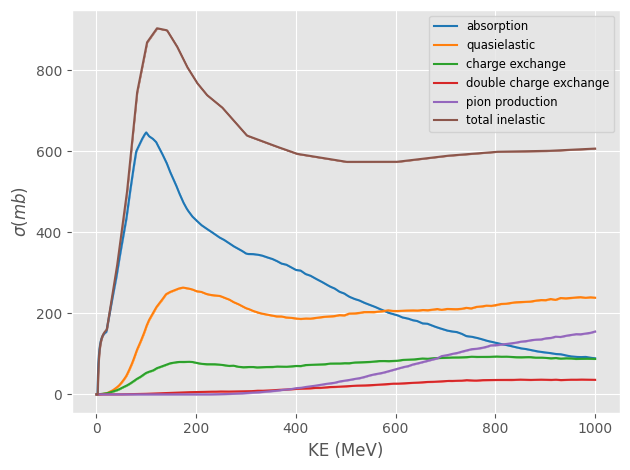

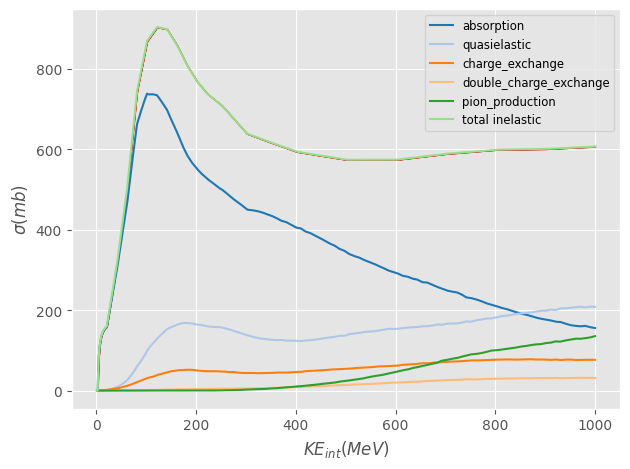

In [6]:
book = Plots.PlotBook("xs_pdfs_modified.pdf", False)
pdfs = cex_toy_generator.GenerateStackedPDFs(2, scale_factors = scales)

x = np.linspace(0, 1E3, 1000)
for p in pdfs:
    Plots.Plot(x, pdfs[p](x), newFigure = False, label = p.replace("_", " "), xlabel = "KE (MeV)")
book.Save()

plt.figure()
geant_xs.Plot("all")
book.Save()

sum_xs = np.zeros(len(geant_xs.KE))
for k, v in scales.items():
    sum_xs = sum_xs + v * getattr(geant_xs, k)
ratio = sum_xs / geant_xs.total_inelastic # the amount per data point to scale each exclusive process by, such that the total inelastic cross section remains unchanged

factors = {k : v/ratio for k, v in scales.items()}

plt.figure()
for k, v in factors.items():
    Plots.Plot(geant_xs.KE, v * getattr(geant_xs, k), label = k, newFigure = False)
geant_xs.Plot("total_inelastic")
book.Save()

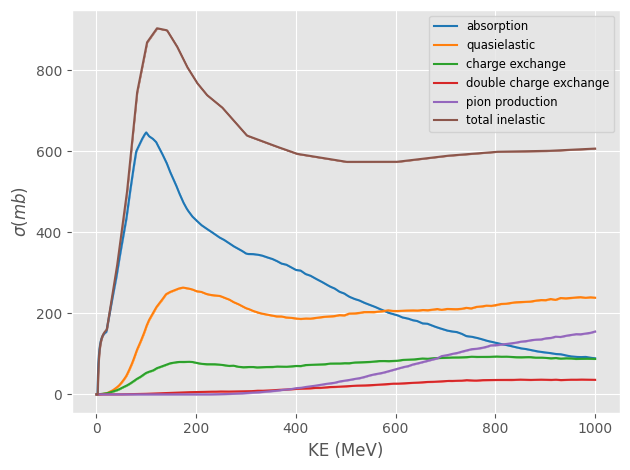

In [9]:
geant_xs.Plot("all")
pdf.Save()

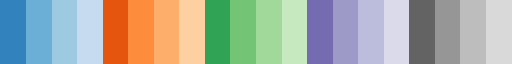

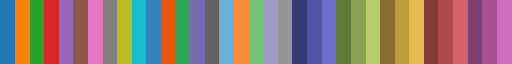

In [4]:
from matplotlib.cm import get_cmap
# plt.cycler("color", get_cmap("tab20").colors)
# display(get_cmap("tab20"))
# display(get_cmap("tab20b"))
display(get_cmap("tab20c"))

colours = []
colours.extend([c for i, c in enumerate(get_cmap("tab20").colors) if i % 2 == 0])

tab20_c = [c for i, c in enumerate(get_cmap("tab20c").colors) if (i+1) % 4 != 0]
tab20_c = [c for i, c in enumerate(tab20_c) if (i+1) % 3 != 0]

dark = [c for i, c in enumerate(tab20_c) if i % 2 == 0]
light = [c for i, c in enumerate(tab20_c) if i % 2 == 1]

colours.extend(dark)
colours.extend(light)

tab20_b = [c for i, c in enumerate(get_cmap("tab20b").colors) if (i+1) % 4 != 0]
colours.extend(tab20_b)
custom_pallete = matplotlib.colors.ListedColormap(colors = colours, name = "custom")
display(custom_pallete)
# display(matplotlib.colors.ListedColormap(colors = dark, name = "dark"))
# display(matplotlib.colors.ListedColormap(colors = light, name = "light"))

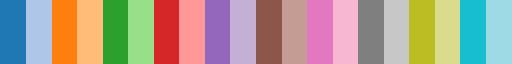

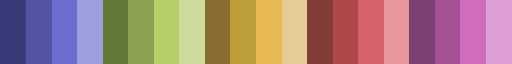

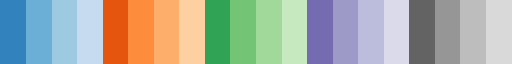

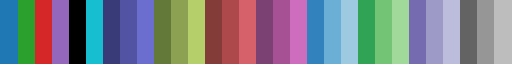

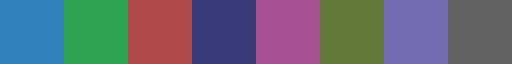

In [5]:
display(get_cmap("tab20"))
display(get_cmap("tab20b"))
display(get_cmap("tab20c"))

l = [
    get_cmap("tab20").colors[0],
    get_cmap("tab20").colors[4],
    get_cmap("tab20").colors[6],
    get_cmap("tab20").colors[8],
    "k",
    get_cmap("tab20").colors[18],
    
    get_cmap("tab20b").colors[0],
    get_cmap("tab20b").colors[1],
    get_cmap("tab20b").colors[2],

    get_cmap("tab20b").colors[4],
    get_cmap("tab20b").colors[5],
    get_cmap("tab20b").colors[6],
    
    get_cmap("tab20b").colors[12],
    get_cmap("tab20b").colors[13],
    get_cmap("tab20b").colors[14],
    
    get_cmap("tab20b").colors[16],
    get_cmap("tab20b").colors[17],
    get_cmap("tab20b").colors[18],

    get_cmap("tab20c").colors[0],
    get_cmap("tab20c").colors[1],
    get_cmap("tab20c").colors[2],

    get_cmap("tab20c").colors[8],
    get_cmap("tab20c").colors[9],
    get_cmap("tab20c").colors[10],
    
    get_cmap("tab20c").colors[12],
    get_cmap("tab20c").colors[13],
    get_cmap("tab20c").colors[14],
    
    get_cmap("tab20c").colors[16],
    get_cmap("tab20c").colors[17],
    get_cmap("tab20c").colors[18],
]
l_2 = [
    get_cmap("tab20c").colors[0],
    get_cmap("tab20c").colors[8],
    get_cmap("tab20b").colors[13],
    get_cmap("tab20b").colors[0],
    get_cmap("tab20b").colors[17],
    get_cmap("tab20b").colors[4],
    get_cmap("tab20c").colors[12],
    get_cmap("tab20c").colors[16],


]

custom_pallete = matplotlib.colors.ListedColormap(colors = l, name = "custom")
display(custom_pallete)

custom_pallete = matplotlib.colors.ListedColormap(colors = l_2, name = "custom")
display(custom_pallete)

pdf xs_curves.pdf has been opened
pdf xs_curves.pdf has been closed


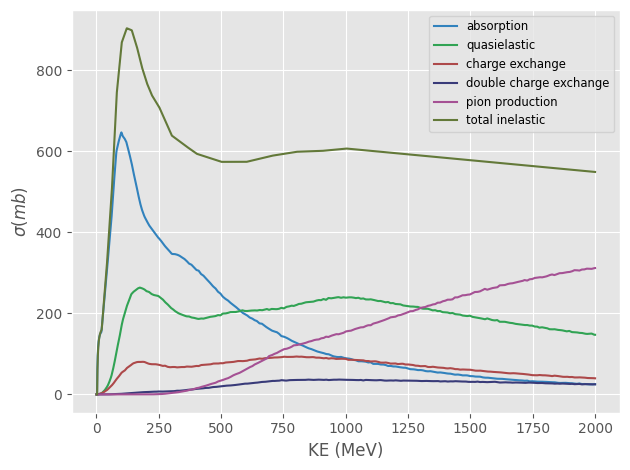

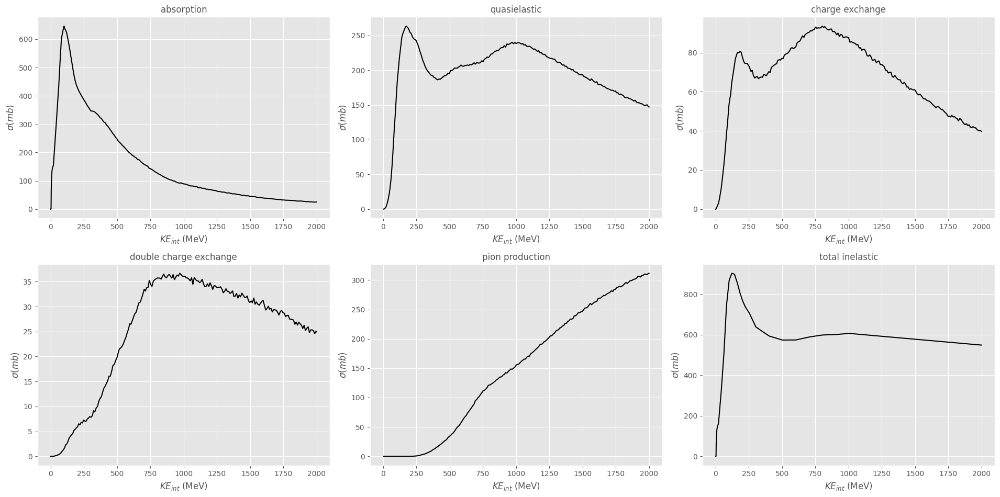

In [9]:
with Plots.PlotBook("xs_curves.pdf", True) as book:
    cross_section.SetPlotStyle(False, custom_colors = l_2, dpi = 100)
    geant_xs.Plot("all")
    book.Save()
    cross_section.SetPlotStyle(True, dpi = 100)
    for i, x in Plots.IterMultiPlot(geant_xs.exclusive_processes + ["total_inelastic"]):
        geant_xs.Plot(x, color = "k", label = "", title = cross_section.remove_(x))
    book.Save()

In [14]:
pdf.close()

pdf xs_toy.pdf has been closed


# MC comparison

In [3]:
mc_quantities, mc_regions = ComputeQuantities("work/2023/cex_analysis_2GeV_config.json") # ProtoDUNE MC

/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Master.py:144: UserWarning: Couldn't apply filters to filters.
  warnings.warn(f"Couldn't apply filters to {var}.")
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Master.py:144: UserWarning: Couldn't apply filters to filename.
  warnings.warn(f"Couldn't apply filters to {var}.")
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Master.py:144: UserWarning: Couldn't apply filters to nTuple_type.
  warnings.warn(f"Couldn't apply filters to {var}.")


'RecoDepositedEnergy' executed in 8.5509s

In [4]:
print(mc_quantities)

{
    'reco': {
        'KE_init': <Array [1.81e+03, 1.74e+03, ... 1.82e+03] type='88871 * float64'>,
        'KE_int': <Array [1.81e+03, 1.74e+03, ... 1.8e+03] type='88871 * float64'>,
        'z_int': <Array [0, 0, 129, 72.7, ... 0, 33.6, 9.44] type='88871 * float64'>
    },
    'true': {
        'KE_init': <Array [1.86e+03, 1.72e+03, ... 1.88e+03] type='88871 * ?float64'>,
        'KE_int': <Array [1.82e+03, 1.56e+03, ... 1.88e+03] type='88871 * float64'>,
        'z_int': <Array [0, 70.4, 123, 31.7, ... 0, 24.6, 1.72] type='88871 * float64'>
    }
}

In [50]:
toy_mc_stats = cross_section.Toy(df = cex_toy_generator.run(cross_section.LoadConfiguration("work/2023/toys/cex_toy_config_2GeV.json")))

/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Fitting.py:191: RuntimeWarning: invalid value encountered in power
  y = np.where(t > -p3, np.exp(-t**2 / 2), A * (B - t)**-p4)


starting batch : 0, cpus : 9

Simulating |████████████████████████████████████████| 1/1 [100%] in 6.3s (0.16/s) 


Done! Creating dataframe...

total_inelastic 88870

decay 1

pion_production 42185

quasielastic 27705

absorption 5974

charge_exchange 8457

double_charge_exchange 4549

1

'BeamSelectionEfficiency' executed in 0.0053s

'GenerateRecoRegions' executed in 0.0971s

'MeanTrackScore' executed in 0.4264s

'main' executed in 7.1306s

75428

pdf toy_mc_comparison.pdf has been opened


sum(y_mc)/sum(y_toy)=0.998975951745946

/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Plots.py:1634: RuntimeWarning: invalid value encountered in divide
  ratio_err = abs(ratio * np.sqrt((self.y1_err/self.y1)**2 + (self.y2_err/self.y2)**2))


sum(y_mc)/sum(y_toy)=0.9939279920692141

/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Plots.py:1629: RuntimeWarning: divide by zero encountered in divide
  ratio = self.y1 / self.y2


sum(y_mc)/sum(y_toy)=0.8605105330667807

sum(y_mc)/sum(y_toy)=0.995679130424998

sum(y_mc)/sum(y_toy)=0.9979518573952577

sum(y_mc)/sum(y_toy)=0.8884068861866375

pdf toy_mc_comparison.pdf has been closed


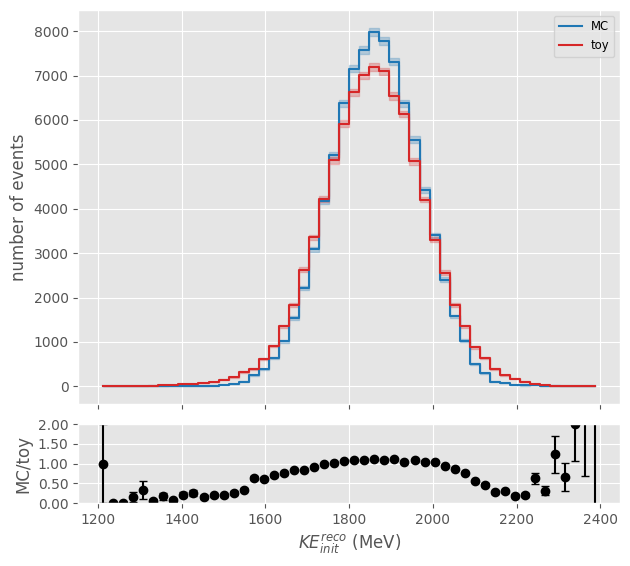

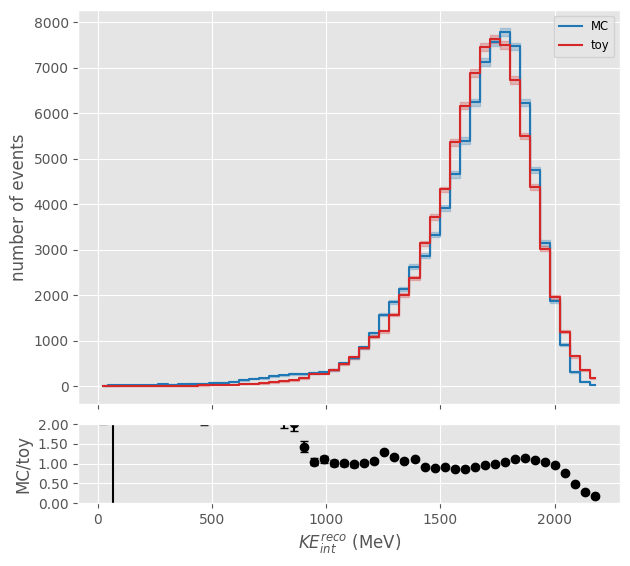

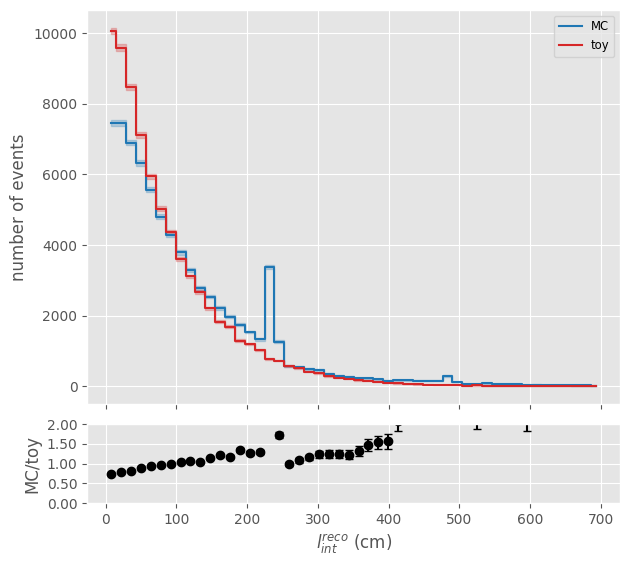

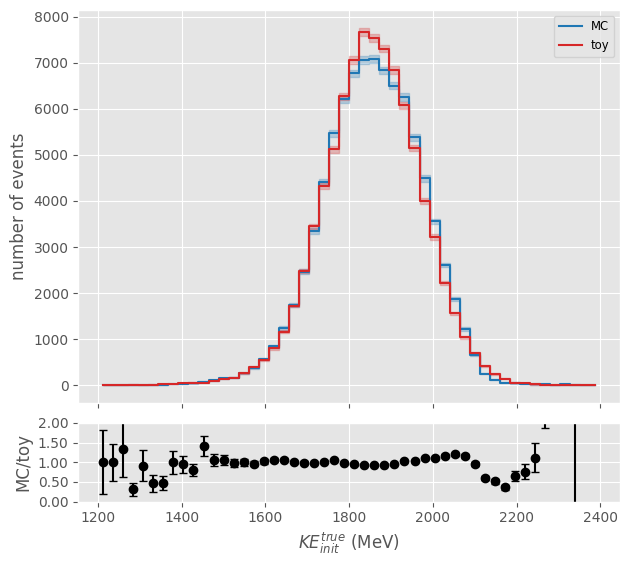

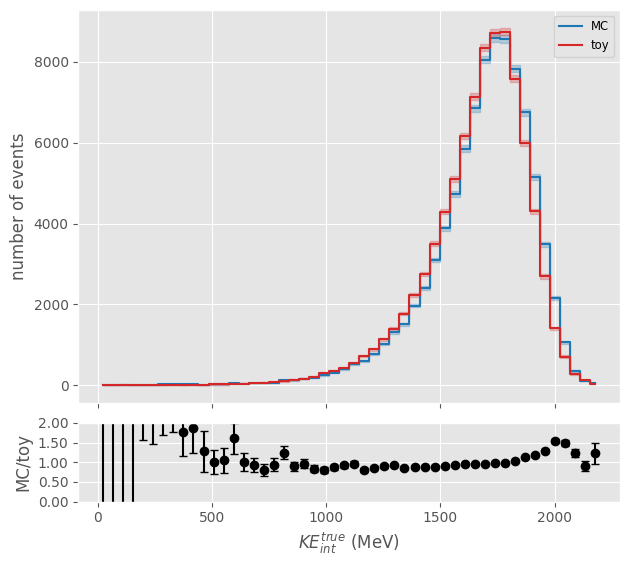

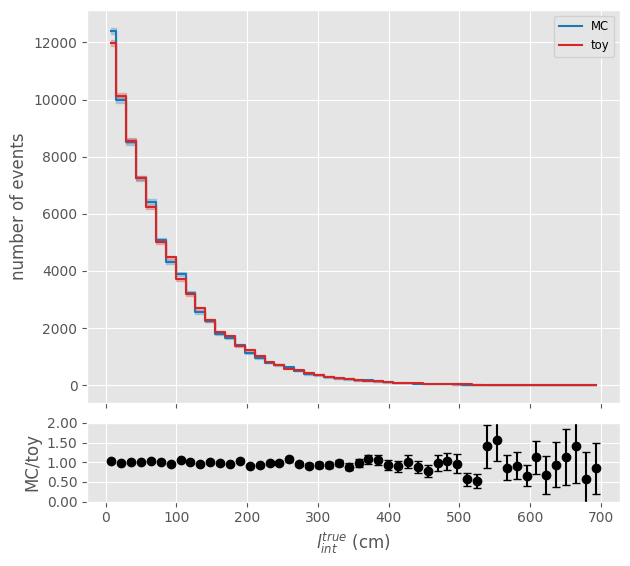

In [52]:
ranges = {
    "z_int"  : [1, 700],
    "KE_int" : [1, 2200],
    "KE_init": [1200, 2400]
}
labels = {
    "z_int_reco"  : "$l^{reco}_{int}$ (cm)",
    "KE_int_reco" : "$KE^{reco}_{int}$ (MeV)",
    "KE_init_reco": "$KE^{reco}_{init}$ (MeV)",
    "z_int_true"  : "$l^{true}_{int}$ (cm)",
    "KE_int_true" : "$KE^{true}_{int}$ (MeV)",
    "KE_init_true": "$KE^{true}_{init}$ (MeV)"
}

print(sum(mc_quantities["reco"]["z_int"] > 0))

import itertools

with Plots.PlotBook("toy_mc_comparison.pdf", True) as book:
    for s, q in itertools.product(mc_quantities.keys(), mc_quantities["reco"].keys()):
        key = q + ("_smeared" if s == "reco" else "")

        y_mc, edges = np.histogram(np.array(mc_quantities[s][q]), 50, ranges[q])
        y_toy, _ = np.histogram(toy_mc_stats.df[key], 50, ranges[q])
        x = cross_section.bin_centers(edges)
        print(f"{sum(y_mc)/sum(y_toy)=}")
        with Plots.RatioPlot(x, y_mc, y_toy * sum(y_mc)/sum(y_toy), np.sqrt(y_mc), np.sqrt(y_toy) * sum(y_mc)/sum(y_toy), xlabel = labels[q+"_"+s], ylabel = "MC/toy") as ratio_plot:
            Plots.Plot(ratio_plot.x, ratio_plot.y1, ylabel = "number of events", yerr = ratio_plot.y1_err, color = "C0", label = "MC", newFigure = False, style = "step")
            Plots.Plot(ratio_plot.x, ratio_plot.y2, ylabel = "number of events", yerr = ratio_plot.y2_err, color = "C6", label = "toy", newFigure = False, style = "step")
        # Plots.PlotHistComparison([mc_quantities[s][q], toy_mc_stats[key]], labels = ["MC", "toy"], x_range = ranges[q], xlabel = labels[q+"_"+s], colours = ["C0", "C6"], bins = 50)
        book.Save()

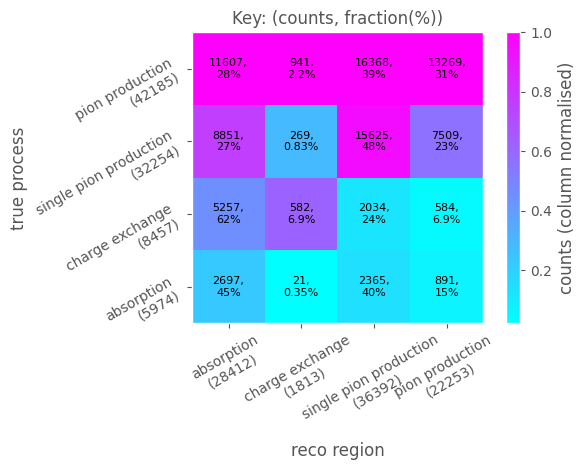

In [54]:
cex_toy_parameters.PlotCorrelationMatrix(toy_mc_stats.GetCorrelationMatrix(toy_mc_stats.df), toy_mc_stats.truth_region_labels, toy_mc_stats.reco_region_labels)

# Energy Slice Method

In [15]:
def SpatialSlice(toy : cross_section.Toy, channel : str, slices : cross_section.Slices) -> dict:
    output = {}
    output["n_interact"], output["n_incident"] = cross_section.ThinSlice.CountingExperiment(toy.df.z_int.values, np.ones(len(toy.df), dtype = bool), slices)
    output["n_interact_exclusive"] = cross_section.ThinSlice.CountingExperiment(toy.df.z_int.values, toy.df[channel].values, slices)[0]
    # output["xs"], output["xs_err"] = cross_section.ThinSlice.CrossSection(output["n_incident"], output["n_interact"], slices.width / 0.95)
    output["xs"], output["xs_err"] = cross_section.ThinSlice.CrossSection(output["n_interact_exclusive"], output["n_interact"], output["n_incident"], slices.width)
    return output


def EnergySlice(toy : cross_section.Toy, channel : str, slices : cross_section.Slices) -> dict:
    KE_int = cross_section.BetheBloch.InteractingKE(toy.df.KE_init.values, toy.df.z_int.values, 25)
    
    output = {}
    output["n_initial"], output["n_interact_inelastic"], output["n_interact_exclusive"], output["n_incident"] = cross_section.EnergySlice.CountingExperiment(KE_int, toy.df.KE_init.values, np.zeros(len(toy.df), dtype = bool), toy.df[channel].values, slices)

    slice_dEdX = cross_section.EnergySlice.Slice_dEdX(slices, cross_section.Particle.from_pdgid(211))
    output["xs"], output["xs_err"] = cross_section.EnergySlice.CrossSection(output["n_interact_exclusive"][1:], output["n_interact_inelastic"][1:], output["n_incident"][1:], slice_dEdX, slices.width)
    return output

def MapKE(toy : cross_section.Toy):
    KEs = []
    pos = []
    energy = max(toy.df.KE_init)
    z = 0
    while energy > 0:
        KEs.append(energy)
        pos.append(z)
        z += 0.5
        energy = energy - 0.5 * cross_section.BetheBloch.meandEdX(energy, cross_section.Particle.from_pdgid(211))
    return cex_toy_generator.interp1d(pos, KEs, fill_value = "extrapolate")

def chi_sqr_ndf(observed, expected):
    safe_observed = np.where((abs(observed) == np.inf) | (abs(observed) == 0), np.nan, observed)
    safe_expected = np.where((abs(expected) == np.inf) | (abs(expected) == 0), np.nan, expected)
    return np.nansum((safe_observed - safe_expected)**2/safe_expected)/len(safe_expected)

def Effective_distance():
    """ Plot effective distance for the enregy slice method, for a given set of slice thicknesses
    """
    widths = [10, 25, 50, 75, 100]
    Plots.plt.figure()
    for w in widths:
        energy_slices = cross_section.Slices(w, 0, 1000, reversed = True)
        slice_dEdX = cross_section.EnergySlice.Slice_dEdX(energy_slices, cross_section.Particle.from_pdgid(211))
        Plots.Plot(energy_slices.pos, energy_slices.width / slice_dEdX, xlabel = "slice KE (MeV)", ylabel = "effictive distance (cm)", newFigure = False, label = f"{w}MeV")
    plt.axhline(0.5, color = "black", linestyle = "--", label = "simulation step size (cm)")
    plt.legend()

def ToyValidation(toy : cross_section.Toy, energy_slice : cross_section.Slices, spatial_slice : cross_section.Slices, book : Plots.PlotBook = Plots.PlotBook.null):
    geant_xs = cross_section.GeantCrossSections(energy_range = [energy_slice.min_pos, energy_slice.max_pos + energy_slice.width])

    mean_energy = cross_section.ThinSlice.MeanSliceEnergy(toy.df.KE_int[toy.df.total_inelastic], toy.df.z_int[toy.df.total_inelastic], spatial_slice)

    Plots.Plot(spatial_slice.pos[1:], mean_energy[0], yerr = mean_energy[1], marker = "x", xlabel = "$l^{true}$ (cm)", ylabel = "$KE^{true}_{int}$ (MeV)")
    book.Save()

    Plots.PlotHist2DMarginal(toy.df.z_int, toy.df.KE_int, xlabel = "$l^{true}$ (cm)", ylabel = "$KE^{true}_{int}$ (MeV)", cmap = "plasma", y_range = [0, max(toy.df.KE_int)])
    Plots.plt.axvline(np.nanmedian(toy.df.z_int), color = "C0", label = f"spatial slice ({spatial_slice.width}cm)")
    Plots.plt.axvline(np.nanmedian(toy.df.z_int)+spatial_slice.width, color = "C0")
    Plots.plt.axhline(np.nanmedian(toy.df.KE_int), color = "C1", label = f"energy slice ({energy_slice.width}MeV)")
    Plots.plt.axhline(np.nanmedian(toy.df.KE_int)+energy_slice.width, color = "C1")
    Plots.plt.legend()
    book.Save()

    processes = ["total_inelastic"] + geant_xs.exclusive_processes

    chi_sqr = []
    w_chi_sqr = []

    output_s_cex = None
    output_e_cex = None

    for _, proc in Plots.IterMultiPlot(processes):
        print(proc)
        interp = cex_toy_generator.interp1d(geant_xs.KE, getattr(geant_xs, proc), fill_value = "extrapolate")

        output = SpatialSlice(toy, proc, spatial_slice)
        if proc == "charge_exchange": output_s_cex = output

        Plots.Plot(mean_energy[0], output["xs"], xerr = mean_energy[1], yerr = output["xs_err"], linestyle = "", marker = "x", color = "C0", label = "spatial slice", newFigure = False)

        expected = interp(mean_energy[0])

        cs = {}
        wcs = {}

        cs["spatial slice"] = chi_sqr_ndf(output["xs"], expected)
        wcs["spatial slice"] = cross_section.weighted_chi_sqr(output["xs"], expected, output["xs_err"])

        output = EnergySlice(toy, proc, energy_slice)
        if proc == "charge_exchange": output_e_cex = output

        Plots.Plot(energy_slice.pos - (energy_slice.width/2), output["xs"], xerr = energy_slice.width/2, yerr = output["xs_err"], linestyle = "", marker = "x", color = "C1", label = "energy slice", newFigure = False)

        expected = interp(energy_slice.pos)
        cs["energy slice"] = chi_sqr_ndf(output["xs"], expected)
        wcs["energy slice"] = cross_section.weighted_chi_sqr(output["xs"], expected, output["xs_err"])

        geant_xs.Plot(proc, color = "C3")
        chi_sqr.append(cs)
        w_chi_sqr.append(wcs)
        Plots.plt.ylim(0, max(interp(geant_xs.KE)) * 1.2)
    book.Save()

    lims = [min(spatial_slice.pos[1:]) - (spatial_slice.width/2), max(spatial_slice.pos[1:]) + (spatial_slice.width/2)]
    Plots.Plot(spatial_slice.pos[:-1], output_s_cex["n_interact"], xlabel = "$N_{int}$ (cm)", ylabel = "Counts", style = "bar")
    Plots.plt.xlim(lims)
    book.Save()
    Plots.Plot(spatial_slice.pos[:-1], output_s_cex["n_interact_exclusive"], xlabel = "$N_{int,ex}$ (cm)", ylabel = "Counts", style = "bar")
    Plots.plt.xlim(lims)
    book.Save()
    Plots.Plot(spatial_slice.pos[1:-1], output_s_cex["n_incident"][1:], xlabel = "$N_{inc}$ (cm)", ylabel = "Counts", style = "bar")
    Plots.plt.xlim(lims)
    book.Save()

    Plots.Plot(energy_slice.pos_overflow, output_e_cex["n_initial"], xlabel = "$N_{init}$ (MeV)", ylabel = "Counts", style = "bar")
    book.Save()
    Plots.Plot(energy_slice.pos_overflow, output_e_cex["n_interact_inelastic"], xlabel = "$N_{int}$ (MeV)", ylabel = "Counts", style = "bar")
    book.Save()
    Plots.Plot(energy_slice.pos_overflow, output_e_cex["n_incident"], xlabel = "$N_{inc}$ (MeV)", ylabel = "Counts", style = "bar")
    book.Save()
    Plots.Plot(energy_slice.pos_overflow, output_e_cex["n_interact_exclusive"], xlabel = "$N_{int,ex}$ (MeV)", ylabel = "Counts", style = "bar")
    book.Save()

    print("chi square/ndf")
    print(pd.DataFrame(chi_sqr, index = processes).style.to_latex())
    print("weighted chi square/ndf")
    print(pd.DataFrame(w_chi_sqr, index = processes).style.to_latex())
    return


def InitialPlots(toy : cross_section.Toy):
    keys = ["KE_init", "KE_int", "z_int"]
    labels = {
        "KE_init" : "$KE^{true}_{init}$ (MeV)",
        "KE_int" : "$KE^{true}_{int}$ (MeV)",
        "z_int" : "$l^{true}$ (cm)"
    }
    Plots.plt.figure()
    for _, k in Plots.IterMultiPlot(keys):
        Plots.PlotHist(toy.df[k], bins = 100, xlabel = labels[k], range = [0, max(toy.df[k])], newFigure = False)
    return

In [16]:
events = int(1E7)
step = 0.5

configs = {
    "single" : CreateConfig(PDSP = 2, p_init = 2000, events = events, seed = 1, beam_width = 0, beam_profile = "gaussian", step = step),
    "beam_profile" : CreateConfig(PDSP = 2, p_init = 2000, events = events, seed = 1, beam_profile = "work/2023/PDSPProd4a_MC_2GeV_reco1_sce_datadriven_v1_ntuple_v09_41_00_03/toy_parameters/beam_profile/beam_profile.json", step = step),
    "uniform" : CreateConfig(PDSP = 2, p_init = 1250, events = events, seed = 1, beam_profile = "uniform", beam_width = 2000, step = step),
}

In [5]:
for c in configs:
    if c != "uniform": continue
    print(c)
    df = cex_toy_generator.run(configs[c])
    df.to_hdf(f"test/toy_{c}" + ".hdf5", key = "df")

uniform

Simulating |████████████████████████████████████████| 91/91 [100%] in 32:42.2 (0.05/s) 


'BeamSelectionEfficiency' executed in 0.5903s

'GenerateRecoRegions' executed in 19.5825s

'MeanTrackScore' executed in 37.0241s

'main' executed in 2049.0433s

In [17]:
# toy_single = cross_section.Toy(df = cex_toy_generator.run(CreateConfig(PDSP = 2, p_init = 2000, events = int(1E7), seed = 1, beam_width = 0, beam_profile = "gaussian", step = 2)))
# toy_bf = cross_section.Toy(df = cex_toy_generator.run(CreateConfig(PDSP = 2, p_init = 2000, events = int(1E7), seed = 1, beam_profile = "work/2023/PDSPProd4a_MC_2GeV_reco1_sce_datadriven_v1_ntuple_v09_41_00_03/toy_parameters/beam_profile/beam_profile.json", step = 2)))
# toy_uniform = cross_section.Toy(df = cex_toy_generator.run(CreateConfig(PDSP = 2, p_init = 500, events = int(1E7), seed = 1, beam_profile = "uniform", beam_width = 2000, step = 2)))
toys = {}
for c in configs:
    toys[c] = cross_section.Toy(file = f"test/toy_{c}.hdf5")

single

pdf xs_toy_validation_single.pdf has been opened


/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:168: RuntimeWarning: invalid value encountered in sqrt
  beta = (1 - (1/gamma)**2)**0.5
/home/sb16165/anaconda3/envs/python3_10_0/lib/python3.10/site-packages/awkward/_connect/_numpy.py:195: RuntimeWarning: divide by zero encountered in divide
  result = getattr(ufunc, method)(
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:824: RuntimeWarning: invalid value encountered in divide
  mean_energy = sum_energy / counts
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:826: RuntimeWarning: invalid value encountered in divide
  std_energy = np.divide(sum_energy_sqr, counts) - mean_energy**2


total_inelastic

absorption

quasielastic

charge_exchange

double_charge_exchange

pion_production

chi square/ndf

\begin{tabular}{lrr}
 & spatial slice & energy slice \\
total_inelastic & 0.119106 & 1.466139 \\
absorption & 0.082157 & 2.163577 \\
quasielastic & 0.091841 & 0.242764 \\
charge_exchange & 0.065002 & 0.314918 \\
double_charge_exchange & 0.311917 & 0.529184 \\
pion_production & 0.028021 & 0.722899 \\
\end{tabular}

weighted chi square/ndf

\begin{tabular}{lrr}
 & spatial slice & energy slice \\
total_inelastic & 0.712232 & 7.822128 \\
absorption & 1.782212 & 85.582720 \\
quasielastic & 3.647310 & 58.460719 \\
charge_exchange & 1.651798 & 35.742276 \\
double_charge_exchange & 1.898727 & 16.053634 \\
pion_production & 2.572736 & 111.170296 \\
\end{tabular}

pdf xs_toy_validation_single.pdf has been closed


/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Plots.py:890: UserWarning: pdf has not been opened.
  warnings.warn("pdf has not been opened.")


<Figure size 640x480 with 0 Axes>

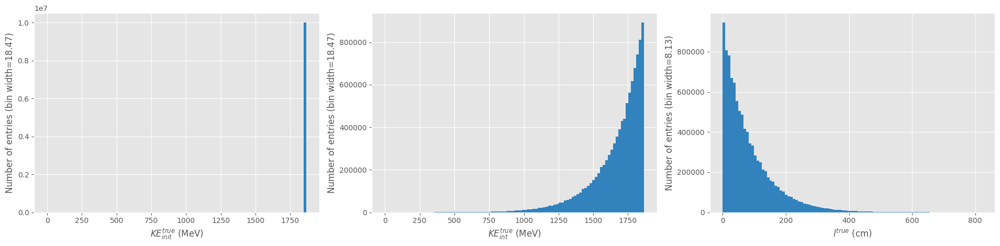

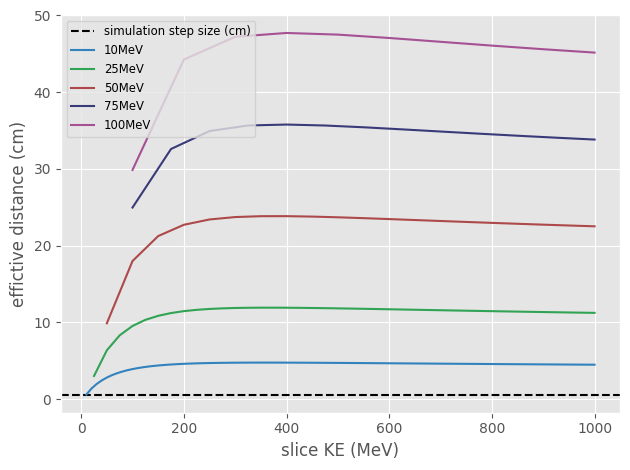

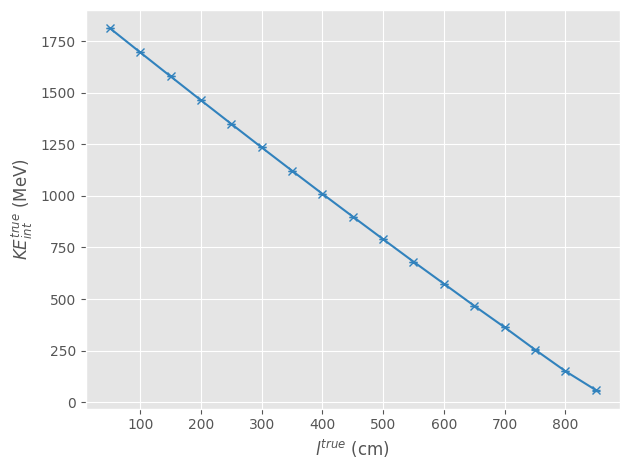

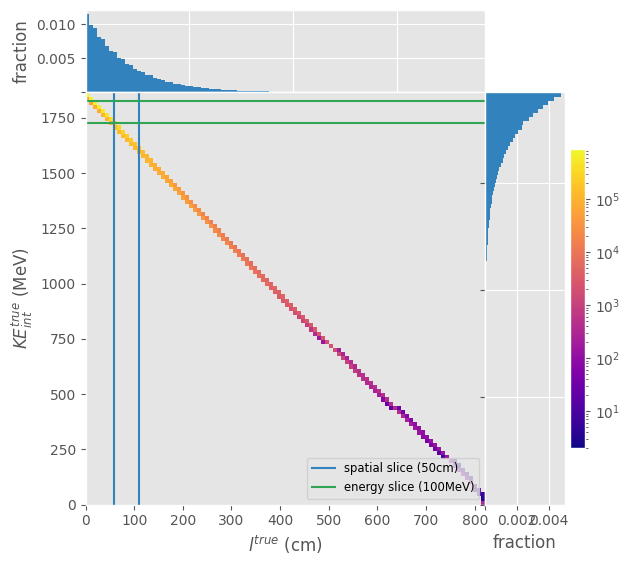

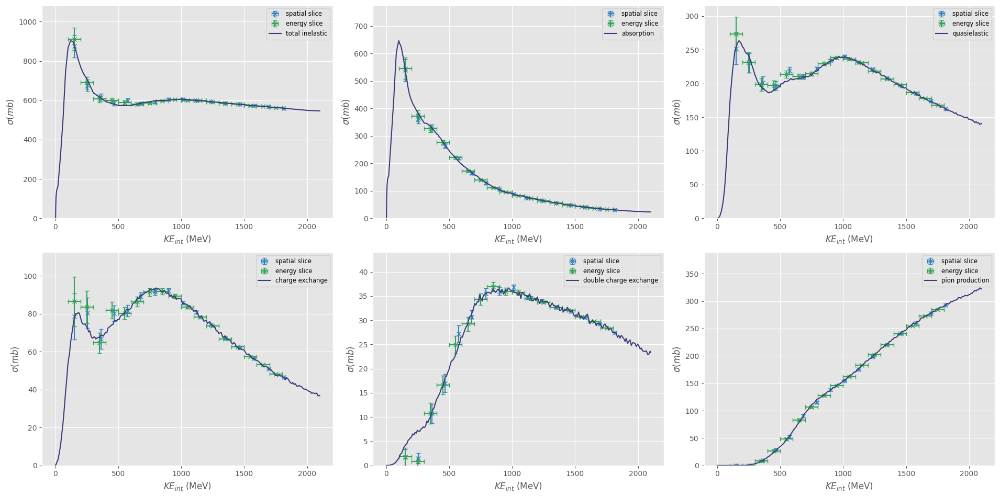

...

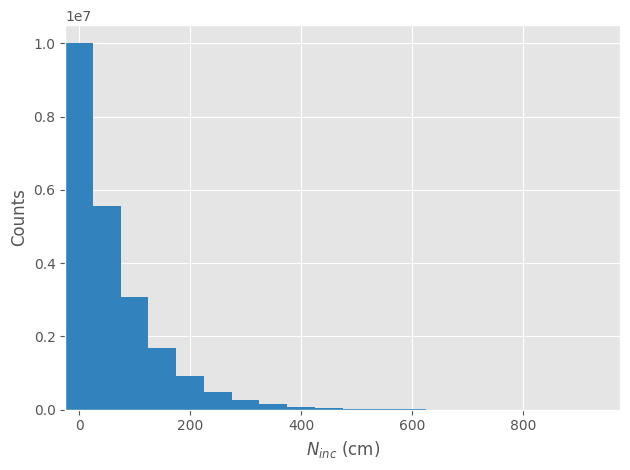

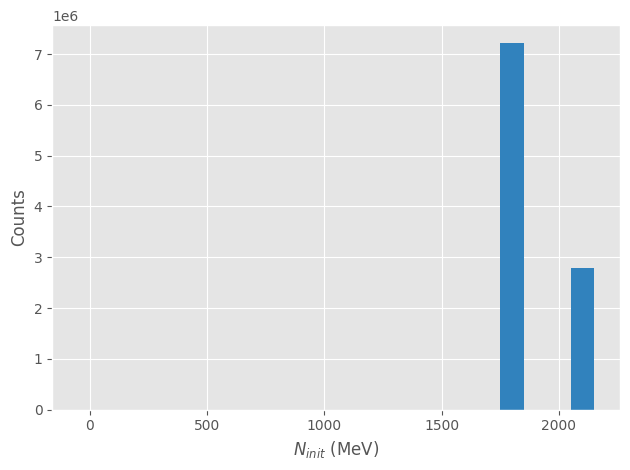

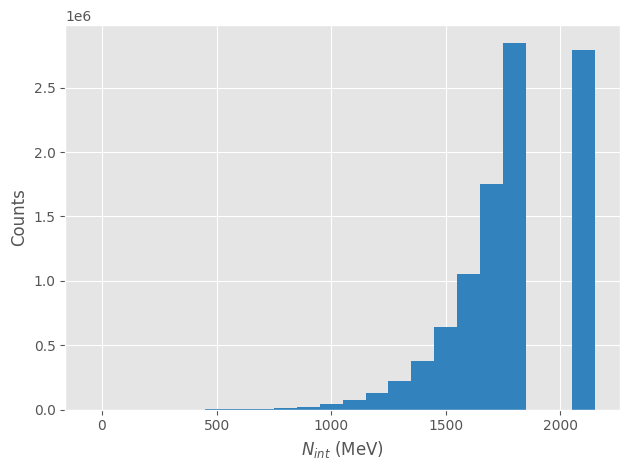

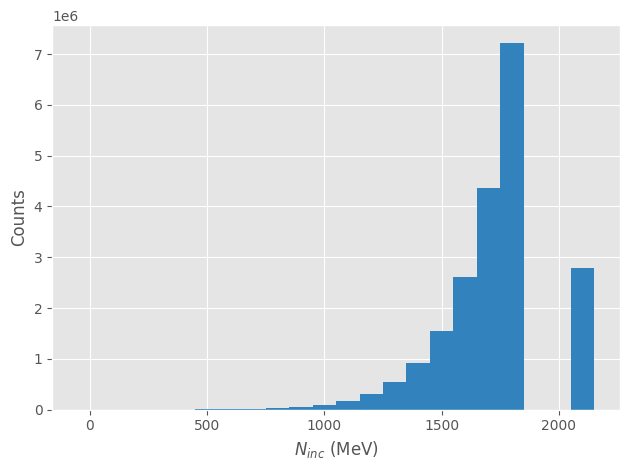

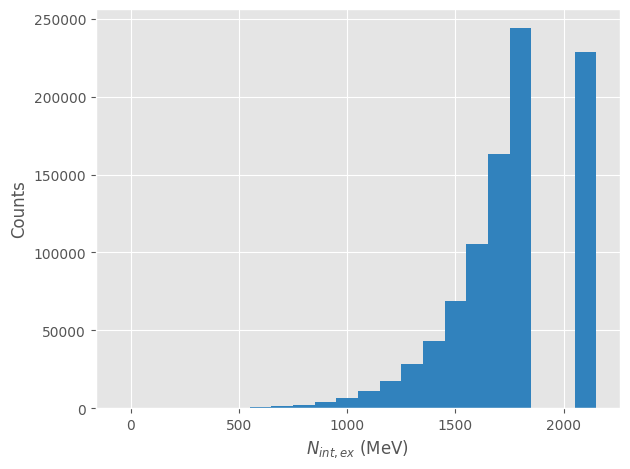

beam_profile

pdf xs_toy_validation_beam_profile.pdf has been opened


/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:168: RuntimeWarning: invalid value encountered in sqrt
  beta = (1 - (1/gamma)**2)**0.5
/home/sb16165/anaconda3/envs/python3_10_0/lib/python3.10/site-packages/awkward/_connect/_numpy.py:195: RuntimeWarning: divide by zero encountered in divide
  result = getattr(ufunc, method)(
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:824: RuntimeWarning: invalid value encountered in divide
  mean_energy = sum_energy / counts
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:826: RuntimeWarning: invalid value encountered in divide
  std_energy = np.divide(sum_energy_sqr, counts) - mean_energy**2


total_inelastic

absorption

quasielastic

charge_exchange

double_charge_exchange

pion_production

chi square/ndf

\begin{tabular}{lrr}
 & spatial slice & energy slice \\
total_inelastic & 6.739893 & 0.364367 \\
absorption & 2.001384 & 1.588576 \\
quasielastic & 3.339088 & 0.568984 \\
charge_exchange & 1.311337 & 0.139693 \\
double_charge_exchange & 0.477377 & 0.322606 \\
pion_production & 22.675836 & 0.795005 \\
\end{tabular}

weighted chi square/ndf

\begin{tabular}{lrr}
 & spatial slice & energy slice \\
total_inelastic & 1.796399 & 6.581328 \\
absorption & 8.693647 & 95.626489 \\
quasielastic & 5.394091 & 65.589909 \\
charge_exchange & 3.845424 & 45.379175 \\
double_charge_exchange & 4.923421 & 13.116362 \\
pion_production & 4.719016 & 123.911584 \\
\end{tabular}

pdf xs_toy_validation_beam_profile.pdf has been closed


/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Plots.py:890: UserWarning: pdf has not been opened.
  warnings.warn("pdf has not been opened.")


<Figure size 640x480 with 0 Axes>

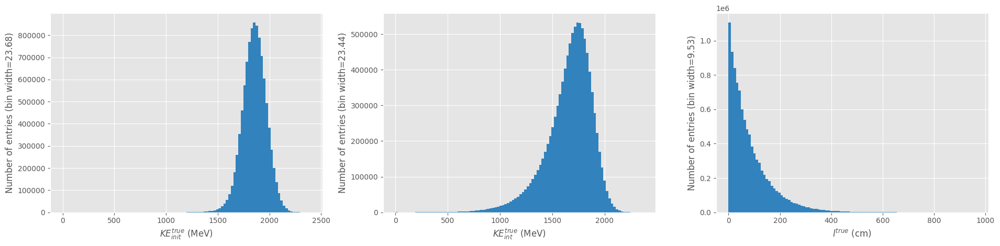

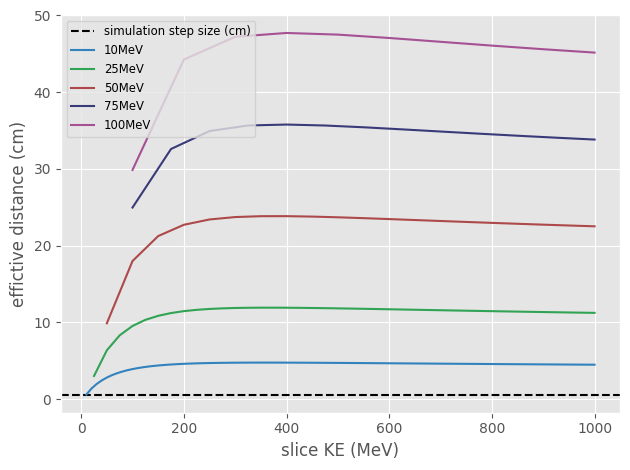

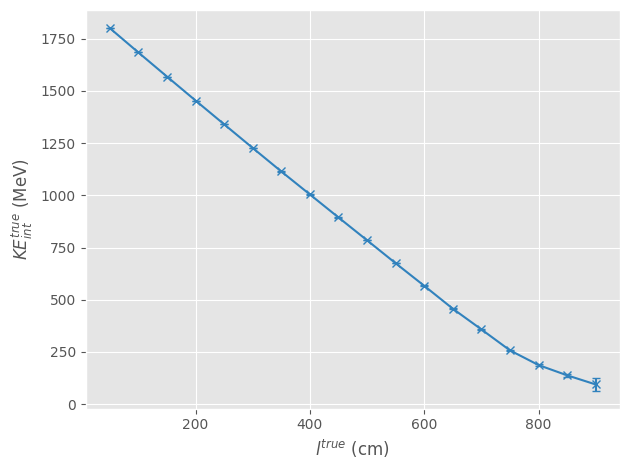

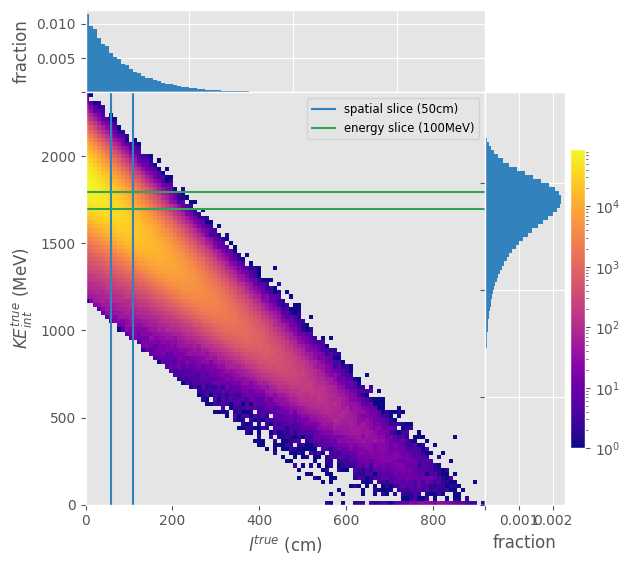

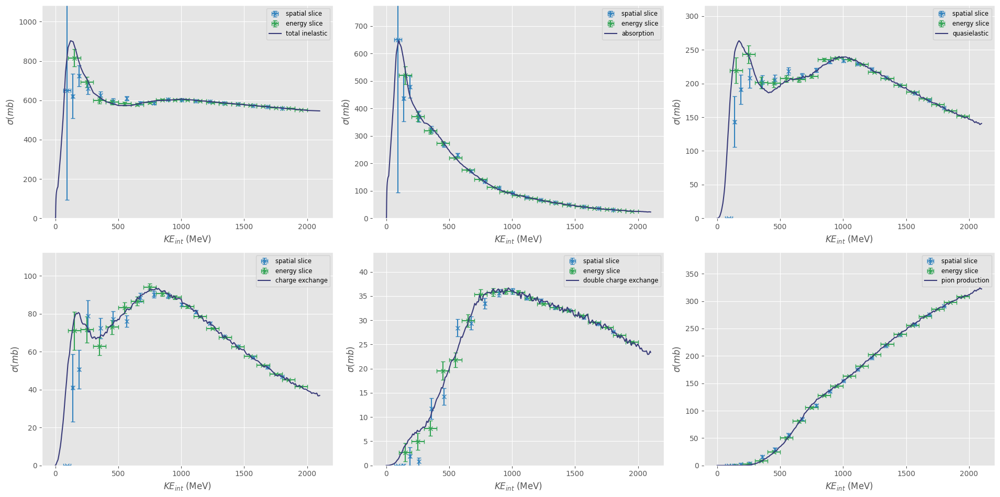

...

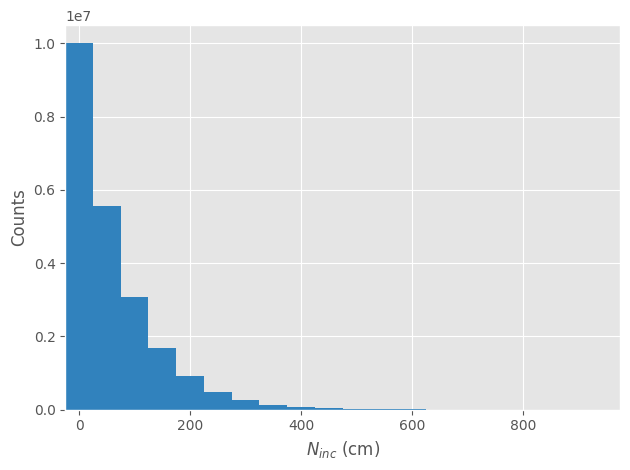

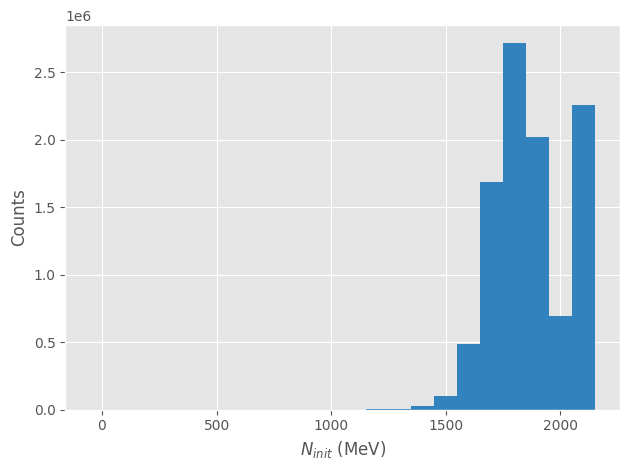

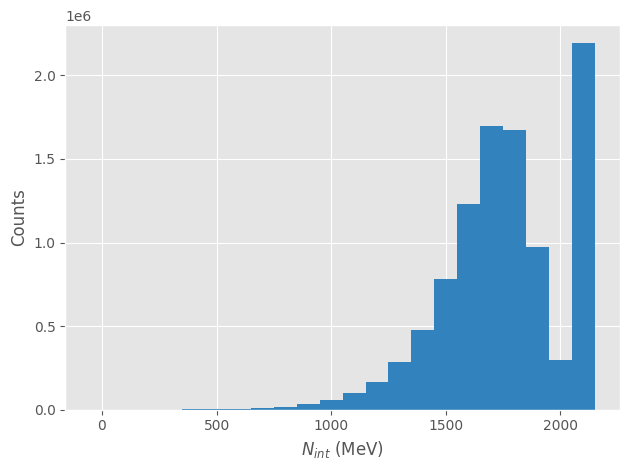

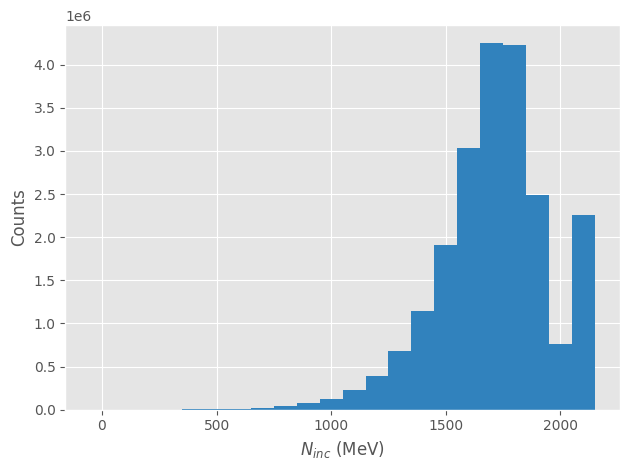

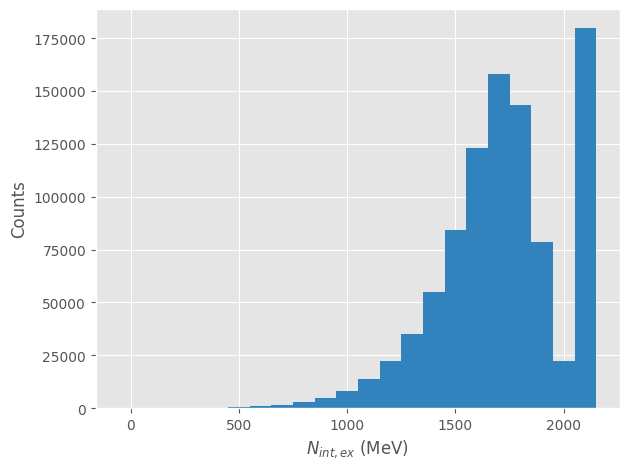

uniform

pdf xs_toy_validation_uniform.pdf has been opened


/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:168: RuntimeWarning: invalid value encountered in sqrt
  beta = (1 - (1/gamma)**2)**0.5
/home/sb16165/anaconda3/envs/python3_10_0/lib/python3.10/site-packages/awkward/_connect/_numpy.py:195: RuntimeWarning: divide by zero encountered in divide
  result = getattr(ufunc, method)(
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:824: RuntimeWarning: invalid value encountered in divide
  mean_energy = sum_energy / counts
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:826: RuntimeWarning: invalid value encountered in divide
  std_energy = np.divide(sum_energy_sqr, counts) - mean_energy**2


total_inelastic

absorption

quasielastic

charge_exchange

double_charge_exchange

pion_production

chi square/ndf

\begin{tabular}{lrr}
 & spatial slice & energy slice \\
total_inelastic & 2.710408 & 0.839972 \\
absorption & 15.707530 & 2.037868 \\
quasielastic & 5.687157 & 0.242789 \\
charge_exchange & 2.406937 & 0.090484 \\
double_charge_exchange & 0.940619 & 0.123164 \\
pion_production & 4.720108 & 0.898841 \\
\end{tabular}

weighted chi square/ndf

\begin{tabular}{lrr}
 & spatial slice & energy slice \\
total_inelastic & 31.537784 & 241.202824 \\
absorption & 16581.010462 & 742.540883 \\
quasielastic & 3921.756488 & 114.861399 \\
charge_exchange & 2793.086599 & 49.833884 \\
double_charge_exchange & 2375.419712 & 91.176925 \\
pion_production & 40.770139 & 782.688882 \\
\end{tabular}

pdf xs_toy_validation_uniform.pdf has been closed


/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Plots.py:890: UserWarning: pdf has not been opened.
  warnings.warn("pdf has not been opened.")


<Figure size 640x480 with 0 Axes>

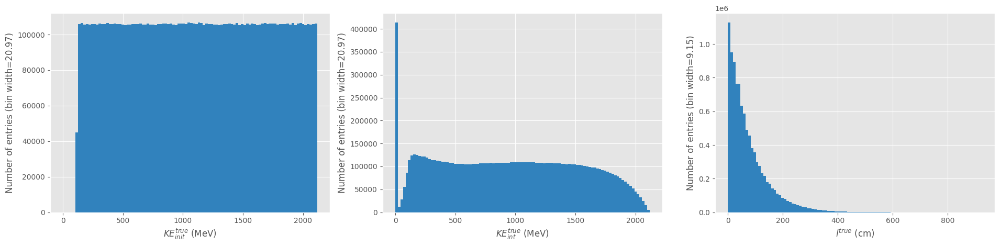

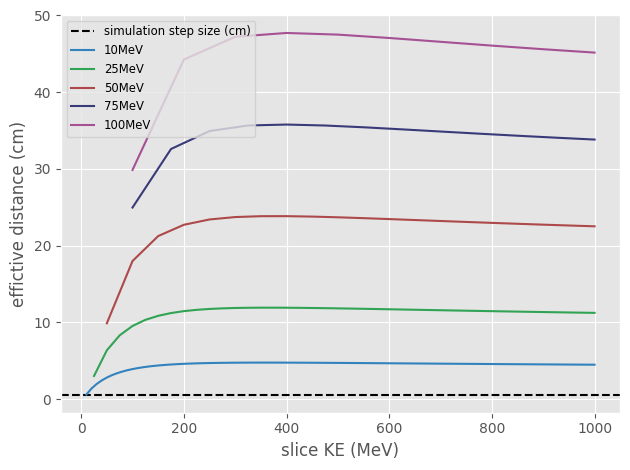

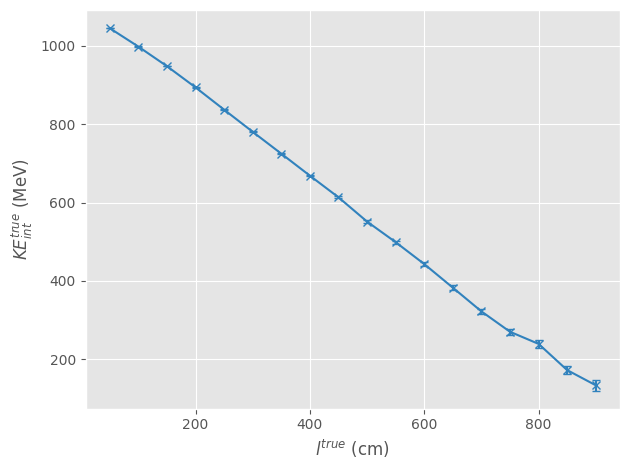

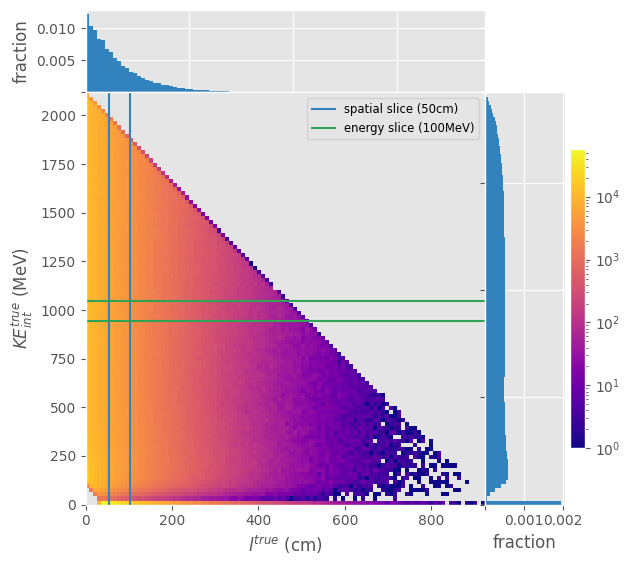

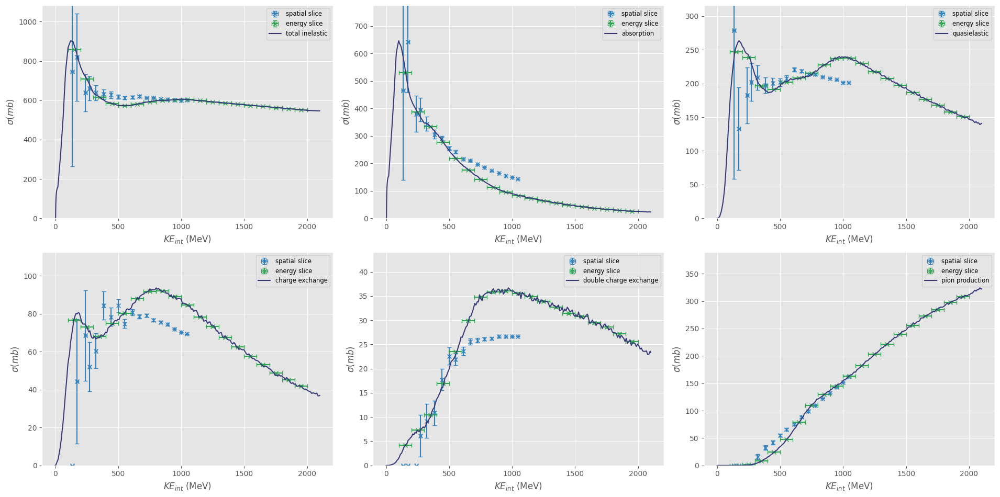

...

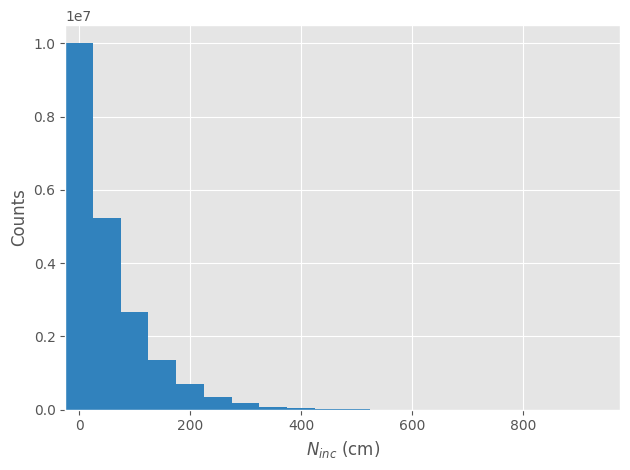

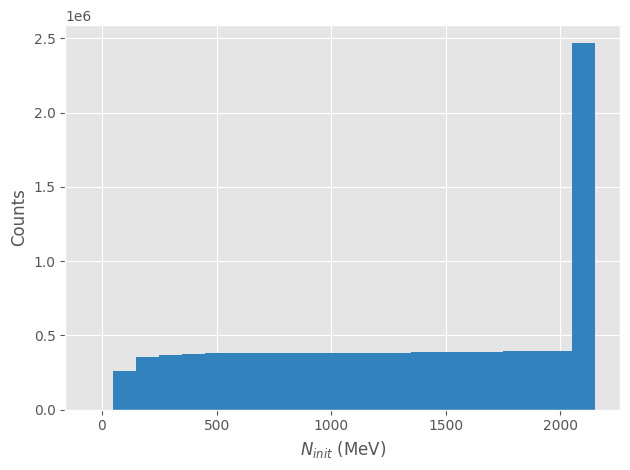

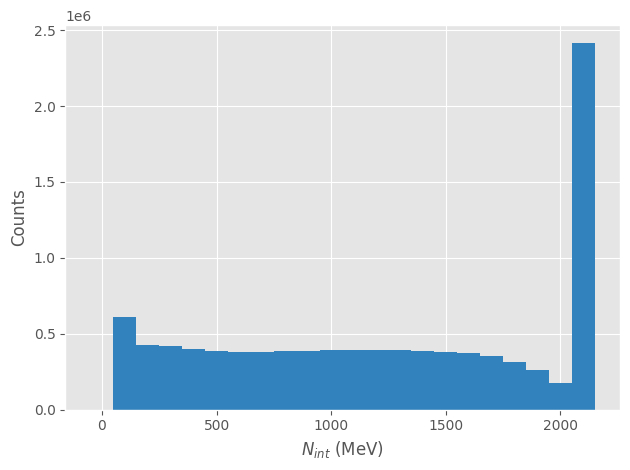

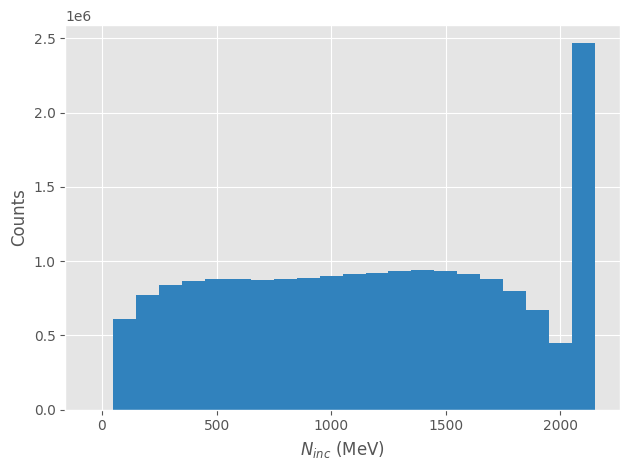

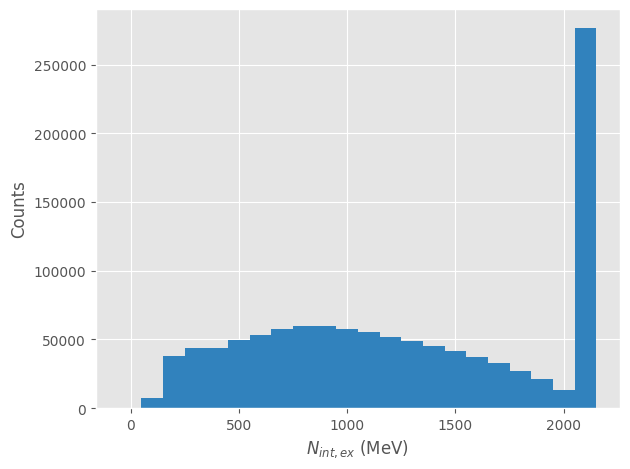

In [18]:
def ClosureTests(toy : cross_section.Toy, energy_slice, spatial_slice, book : Plots.PlotBook.null):
    InitialPlots(toy)
    book.Save()
    Effective_distance()
    book.Save()
    ToyValidation(toy, energy_slice, spatial_slice, book)
    book.close()
    return 

energy_slice = cross_section.Slices(100, 0, 2000, True)
spatial_slice = cross_section.Slices(50, -10, 1010)

for name, toy in zip(["single", "beam_profile", "uniform"], toys.values()):
    print(name)
    with Plots.PlotBook(f"xs_toy_validation_{name}.pdf", True) as book:
        ClosureTests(toy, energy_slice, spatial_slice, book)
    Plots.plt.show()


# Smearing

In [4]:
pdf = Plots.PlotBook("xs_toy_smearing_mc_driven.pdf", open = False)

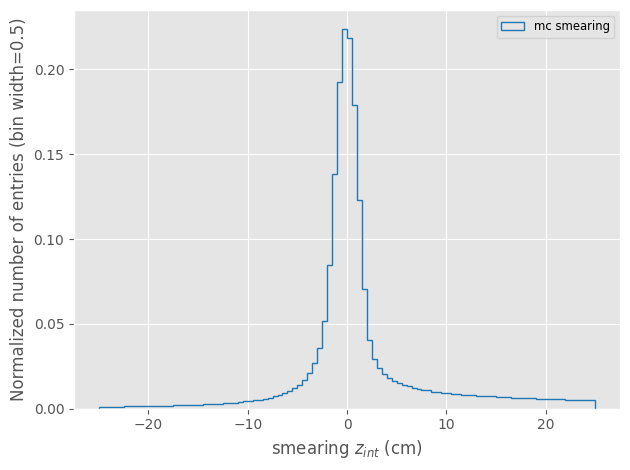

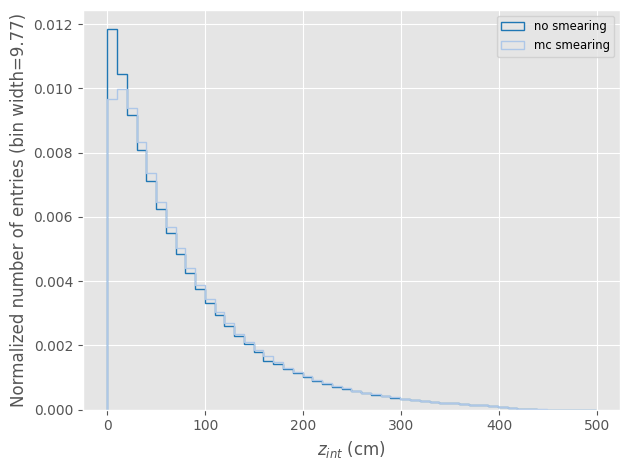

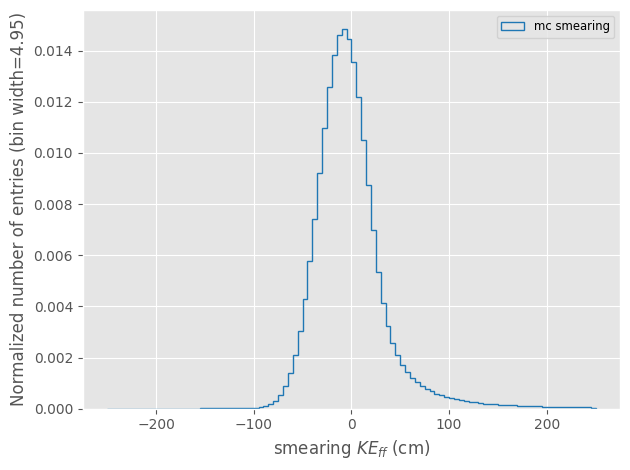

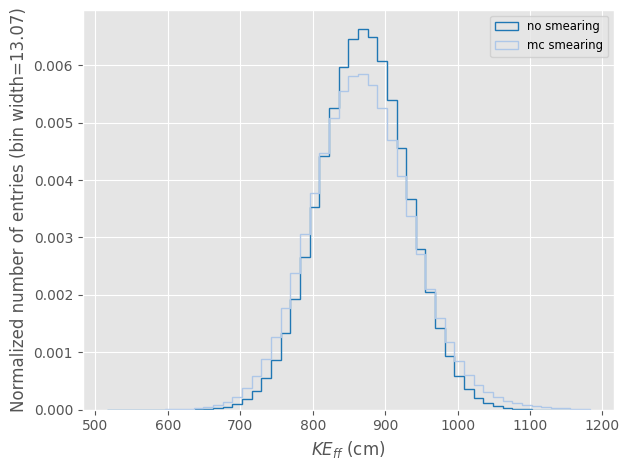

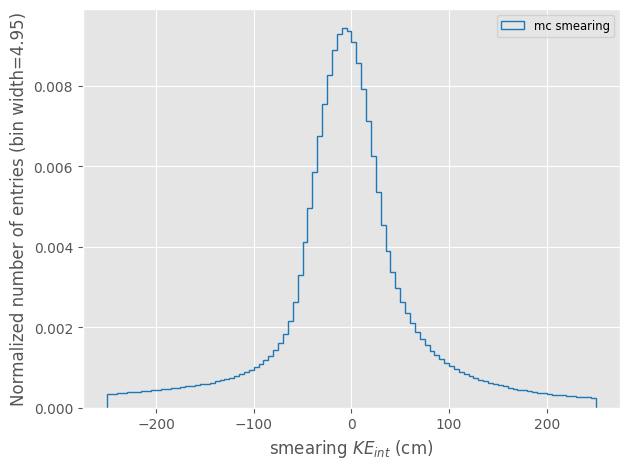

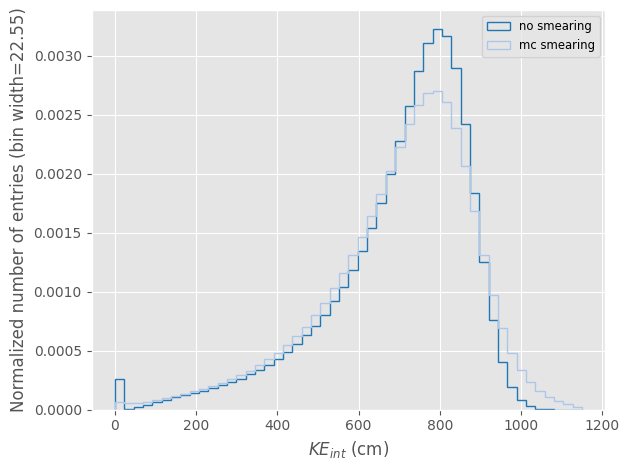

In [5]:
def PlotSmearing(toy : pd.DataFrame, smearings : list[pd.DataFrame], quantity : str, quantity_label : str, smearing_labels : list[str], smearing_range : list = None):
    data = [toy[quantity]]
    for s in smearings:
        data.append(toy[quantity] + s[quantity])
    Plots.PlotHistComparison([s[quantity] for s in smearings], xlabel = "smearing " + quantity_label, labels = smearing_labels, x_range = smearing_range)
    pdf.Save()
    Plots.PlotHistComparison(data, labels = ["no smearing"] + smearing_labels, bins = 50, xlabel = quantity_label)
    pdf.Save()

mc_driven_smearing = {
    "KE_int" : toy_gaussian.df.KE_int_smearing,
    "KE_init" : toy_gaussian.df.KE_init_smearing,
    "z_int" : toy_gaussian.df.z_int_smearing 
}

PlotSmearing(toy_gaussian.df, [mc_driven_smearing], "z_int", "$z_{int}$ (cm)", ["mc smearing"], [-50, 50])
PlotSmearing(toy_gaussian.df, [mc_driven_smearing], "KE_init", "$KE_{init}$ (cm)", ["mc smearing"], [-250, 250])
PlotSmearing(toy_gaussian.df, [mc_driven_smearing], "KE_int", "$KE_{int}$ (cm)", ["mc smearing"], [-250, 250])

/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Plots.py:887: UserWarning: pdf has not been opened.
  warnings.warn("pdf has not been opened.")


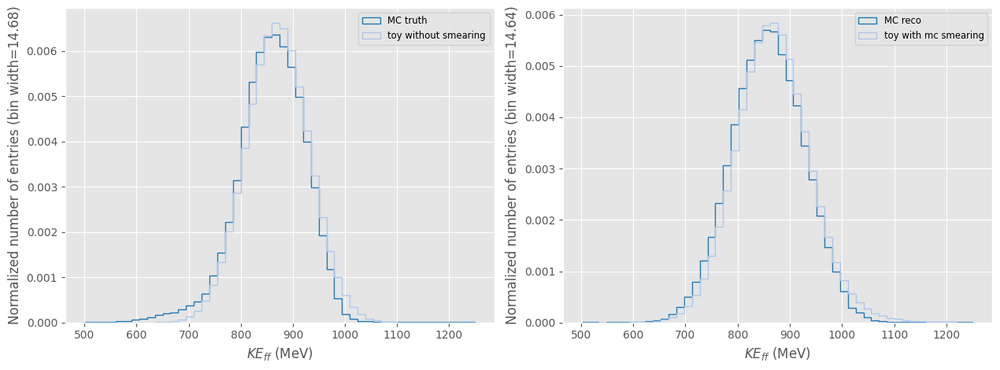

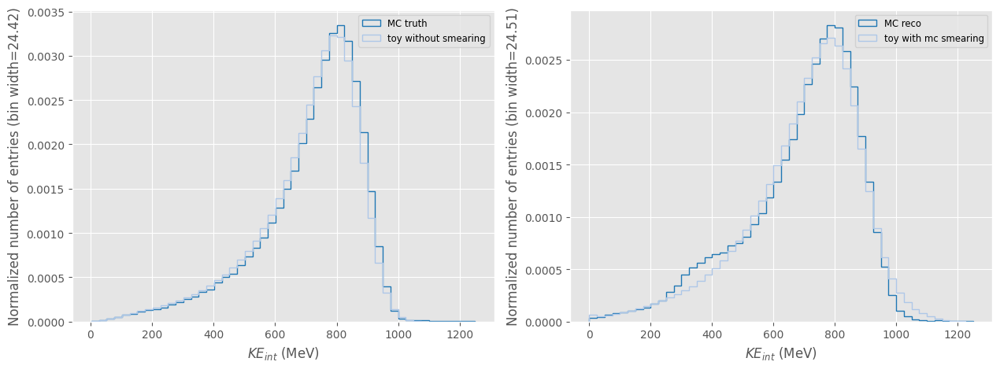

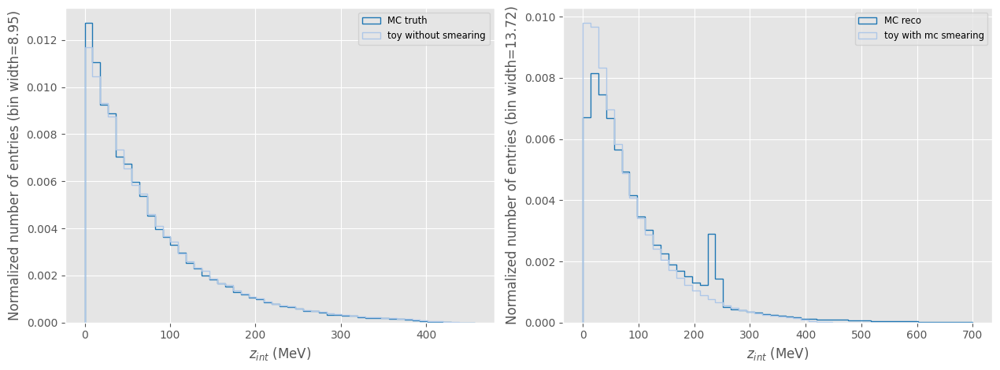

In [18]:
def PlotSmearingMCComparison(mc_quantities : dict, toy : pd.DataFrame, smearing : pd.DataFrame, quantity : str, smearing_label : str, plot_range : list, quantitity_label : str):
    multiplot = Plots.MultiPlot(2)
    next(multiplot)
    Plots.PlotHistComparison([mc_quantities["true"][quantity], toy[quantity]], labels = ["MC truth", "toy without smearing"], x_range = plot_range, xlabel = quantitity_label, newFigure = False, bins = 50)
    next(multiplot)
    Plots.PlotHistComparison([mc_quantities["reco"][quantity], toy[quantity] + smearing[quantity]], labels = ["MC reco", f"toy with {smearing_label}"], x_range = plot_range, xlabel = quantitity_label, newFigure = False, bins = 50)

PlotSmearingMCComparison(mc_quantities, toy_gaussian.df, mc_driven_smearing, "KE_init", "mc smearing", [500, 1250], "$KE_{init}$ (MeV)")
pdf.Save()
PlotSmearingMCComparison(mc_quantities, toy_gaussian.df, mc_driven_smearing, "KE_int", "mc smearing", [0, 1250], "$KE_{int}$ (MeV)")
pdf.Save()
PlotSmearingMCComparison(mc_quantities, toy_gaussian.df, mc_driven_smearing, "z_int", "mc smearing", [0, 700], "$z_{int}$ (MeV)")
pdf.Save()
pdf.close()

/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Fitting.py:245: RuntimeWarning: invalid value encountered in power
  E1 = A * (B-z)**(-p4)
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Fitting.py:246: RuntimeWarning: invalid value encountered in power
  E2 = C * (D+z)**(-p6)


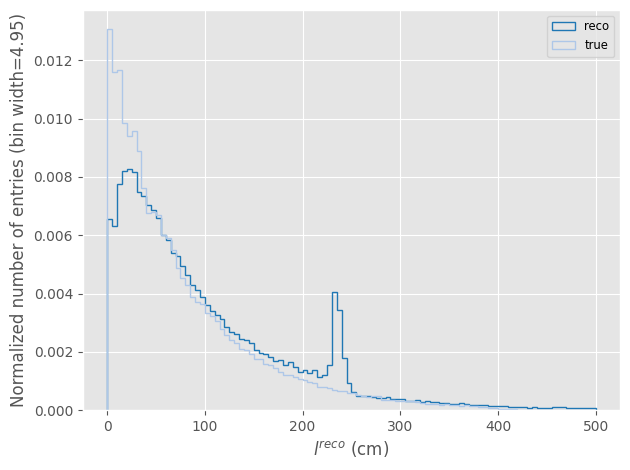

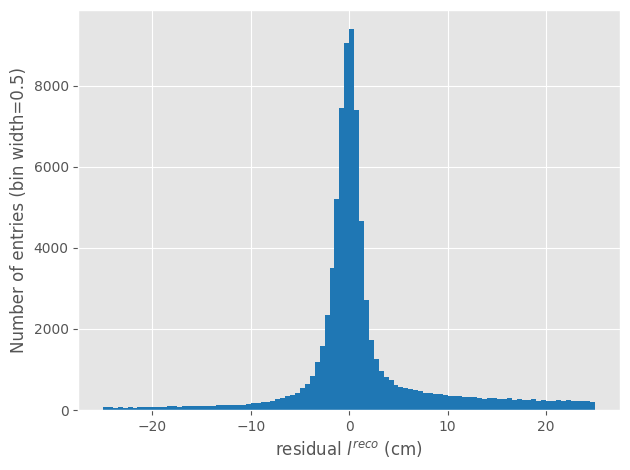

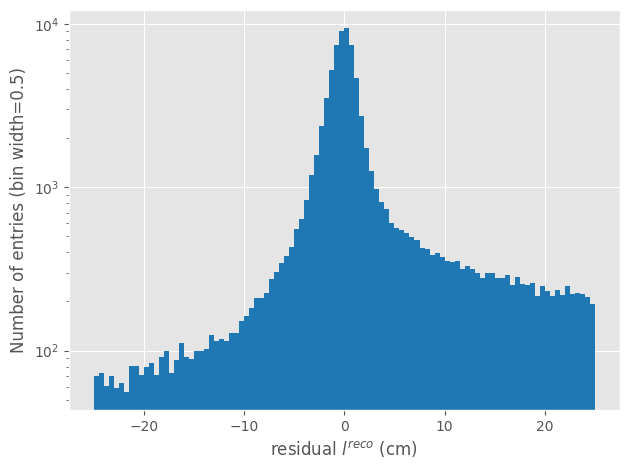

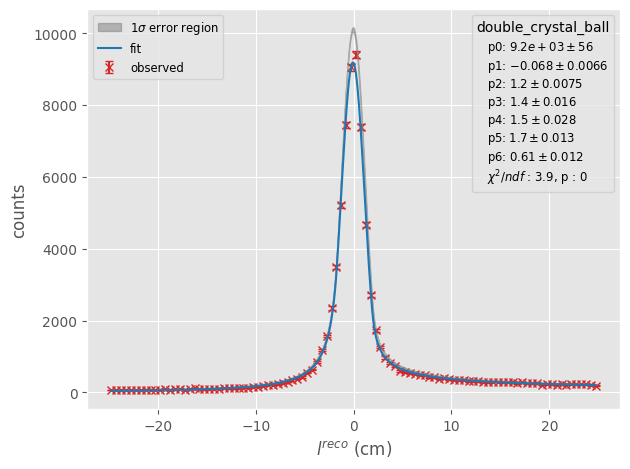

In [26]:
ranges = {
        "KE_init" : [0, 1250],
        "KE_int" : [0, 1250],
        "z_int" : [0, 500]
    }
bins = {r : np.linspace(min(ranges[r]), max(ranges[r]), 50) for r in ranges}
labels = {
        "KE_init" : "$KE^{reco}_{init}$ (MeV)",
        "KE_int" : "$KE^{reco}_{int}$ (MeV)",
        "z_int" : "$l^{reco}$ (cm)"
    }

track_length_params =  cex_toy_parameters.ResolutionStudy(pdf, mc_quantities["reco"]["z_int"], mc_quantities["true"]["z_int"], mc_quantities["reco"]["z_int"] != 0, labels["z_int"], ranges["z_int"], [-25, 25], [cross_section.Fitting.double_crystal_ball])


# Beam Particle Selection Efficiency

In [ ]:
beam_selection_efficiencies = cex_toy_generator.ReadHDF5File("work/2023/PDSPProd4a_MC_1GeV_reco1_sce_datadriven_v1_ntuple_v09_41_00_03/toy_parameters/pi_beam_efficiency/beam_selection_efficiencies_true.hdf5")

probability = {
    "track_length" : cex_toy_generator.BeamSelectionEfficiency(toy_gaussian.df, "z_int", beam_selection_efficiencies).beam_selection_mask,
    "KE_ff" : cex_toy_generator.BeamSelectionEfficiency(toy_gaussian.df, "z_int", beam_selection_efficiencies).beam_selection_mask,
    "KE_int" : cex_toy_generator.BeamSelectionEfficiency(toy_gaussian.df, "z_int", beam_selection_efficiencies).beam_selection_mask
    }

U = np.random.uniform(0, 1, len(toy_gaussian.df))

for p in probability:
    print(p)
    passed = U < probability[p]
    for _, c in Plots.IterMultiPlot(["z_int", "KE_int", "KE_init"]):
        Plots.PlotHistComparison([toy_gaussian.df[c][passed.values] + mc_driven_smearing[c][passed.values], mc_quantities["reco"][c]], labels = ["toy", "MC reco"], xlabel = c, bins = 50, y_scale = "linear", newFigure = False)
    plt.show()

# Reco regions for the toy

In [17]:
pdf = Plots.PlotBook("toy_reco_regions.pdf", open = True)

pdf toy_reco_regions.pdf has been opened


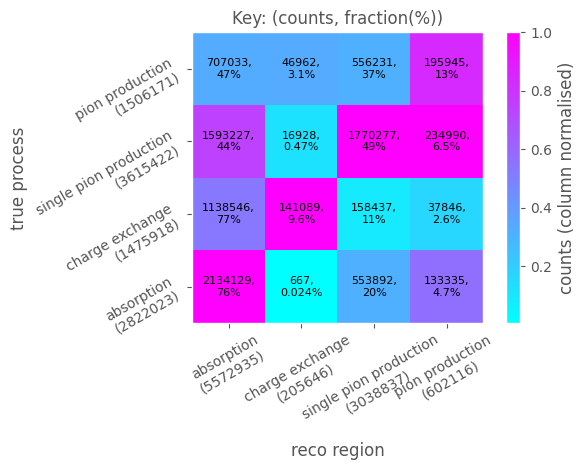

In [18]:
counts = toy_gaussian.GetCorrelationMatrix(toy_gaussian.df)
cex_toy_parameters.PlotCorrelationMatrix(counts, toy_gaussian.truth_region_labels, toy_gaussian.reco_region_labels)
pdf.Save()

pdf toy_reco_regions.pdf has been closed


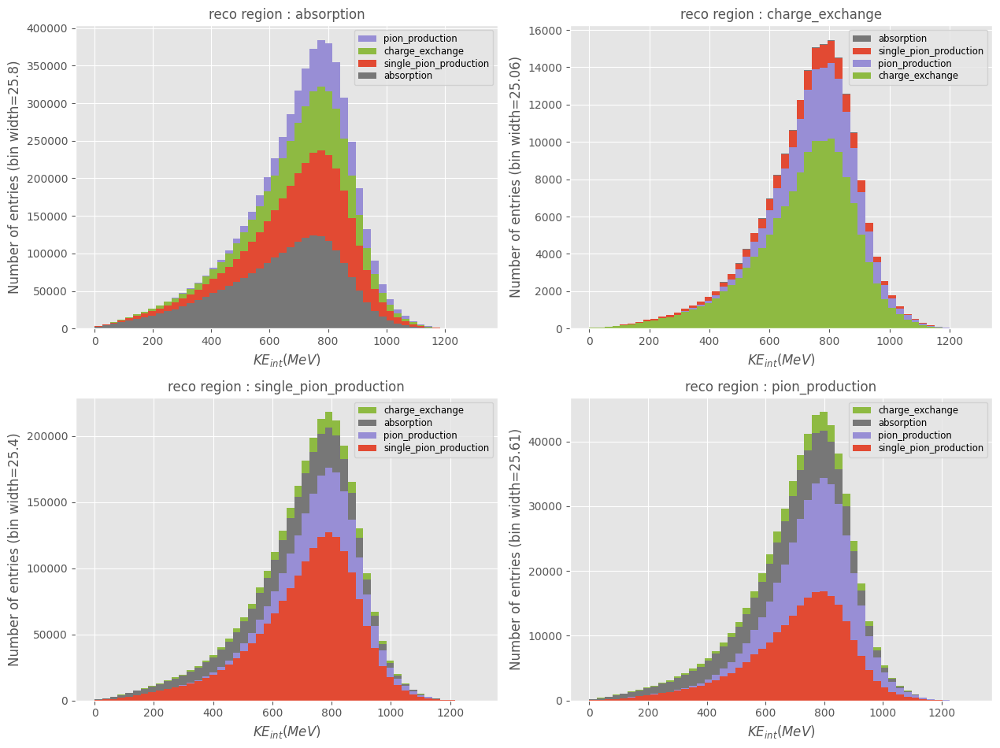

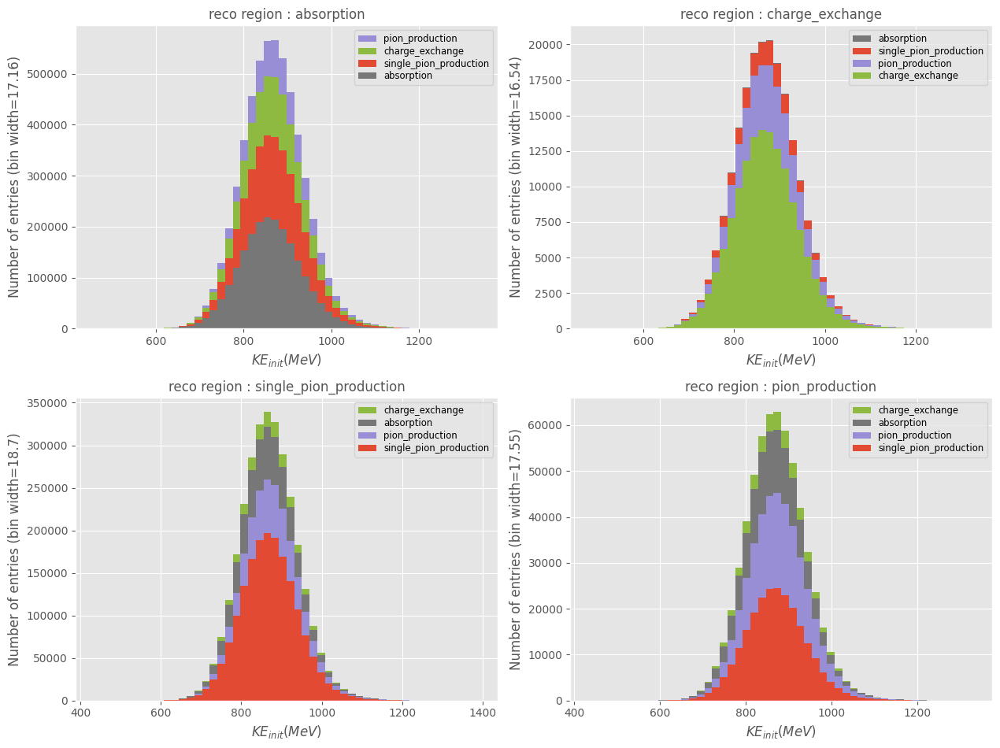

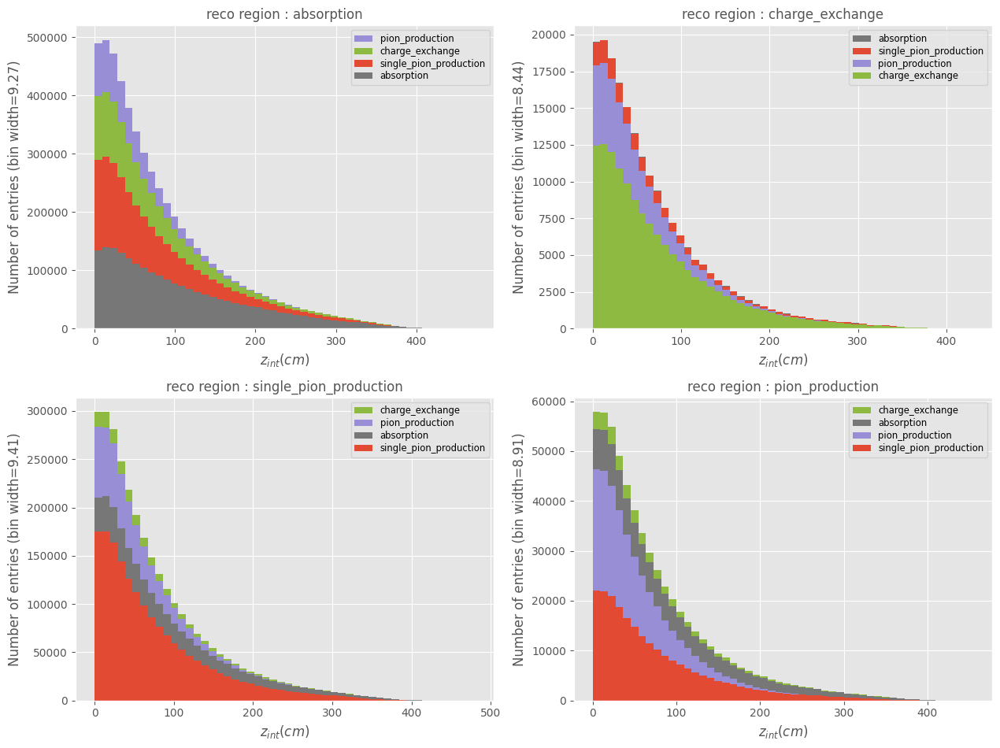

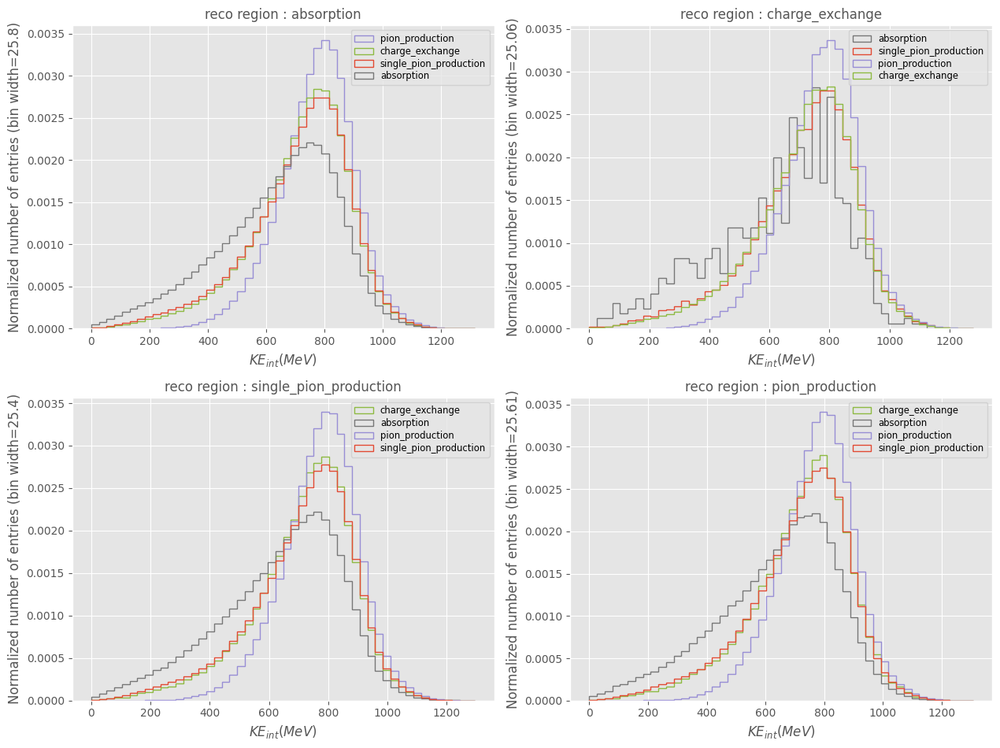

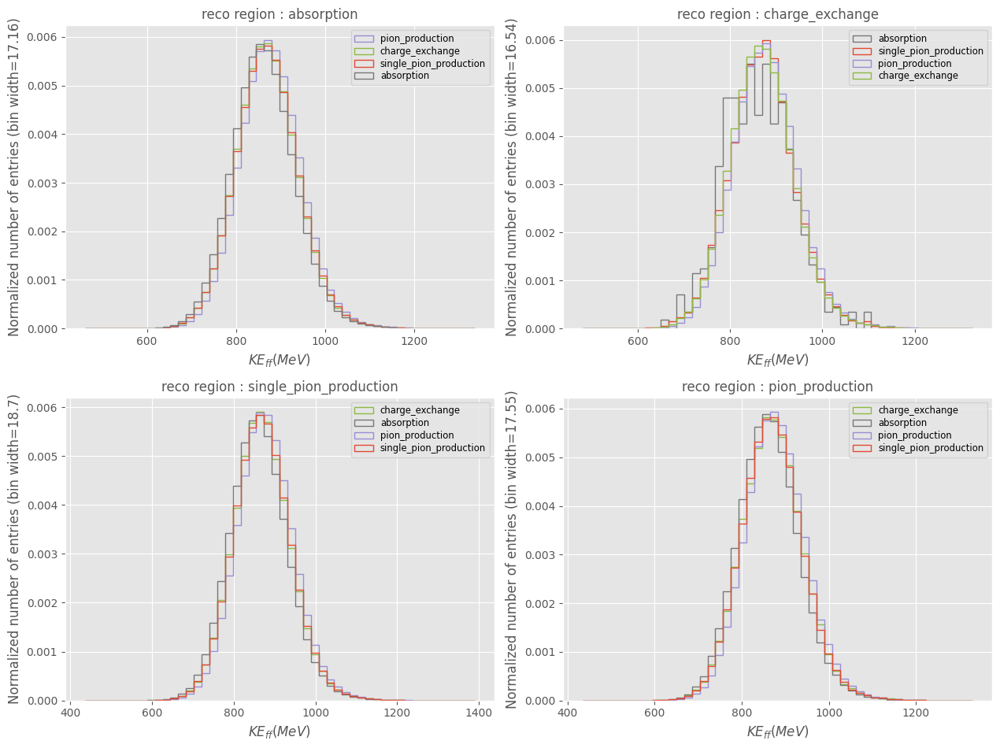

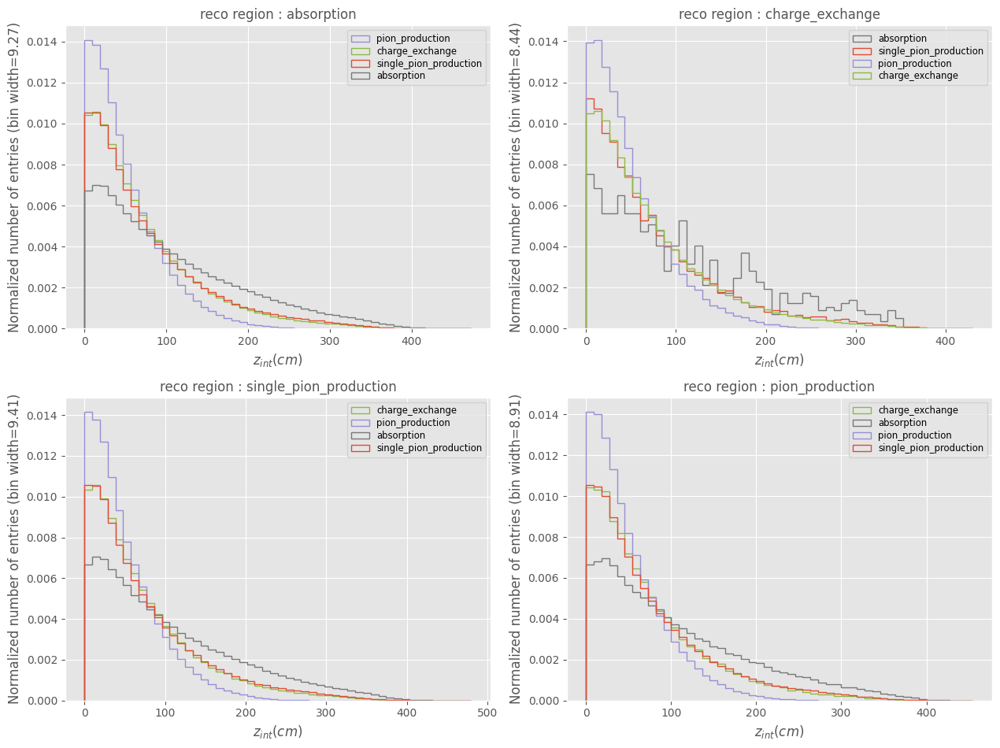

In [19]:
toy_gaussian.PlotObservablesInRegions(toy_gaussian.df.KE_int_smeared, toy_gaussian.reco_regions, toy_gaussian.truth_regions, "$KE_{int} (MeV)$", stacked = True, histtype = "stepfilled")
toy_gaussian.PlotObservablesInRegions(toy_gaussian.df.KE_init_smeared, toy_gaussian.reco_regions, toy_gaussian.truth_regions, "$KE_{init} (MeV)$", stacked = True, histtype = "stepfilled")
toy_gaussian.PlotObservablesInRegions(toy_gaussian.df.z_int_smeared, toy_gaussian.reco_regions, toy_gaussian.truth_regions, "$z_{int} (cm)$", stacked = True, histtype = "stepfilled")

toy_gaussian.PlotObservablesInRegions(toy_gaussian.df.KE_int_smeared, toy_gaussian.reco_regions, toy_gaussian.truth_regions, "$KE_{int} (MeV)$", norm = True)
toy_gaussian.PlotObservablesInRegions(toy_gaussian.df.KE_init_smeared, toy_gaussian.reco_regions, toy_gaussian.truth_regions, "$KE_{init} (MeV)$", norm = True)
toy_gaussian.PlotObservablesInRegions(toy_gaussian.df.z_int_smeared, toy_gaussian.reco_regions, toy_gaussian.truth_regions, "$z_{int} (cm)$", norm = True)
pdf.close()

# Mean Track Score

In [4]:
def LoadMCData(file) -> Master.Data:
    config = cross_section.ApplicationArguments.ResolveConfig(cross_section.LoadConfiguration(file))
    mc = Master.Data(config.mc_file, nTuple_type = config.ntuple_type)
    for s, m in config.selection_masks["mc"]["beam"].items():
        print(s)
        mc.Filter([m], [m])
    mc.Filter([config.selection_masks["mc"]['null_pfo']['ValidPFOSelection']])

    has_pfo = cross_section.BeamParticleSelection.HasFinalStatePFOsCut(mc)
    mc.Filter([has_pfo], [has_pfo])

    mean_track_score = ak.fill_none(ak.mean(mc.recoParticles.trackScore, axis = -1), -0.05)


    pi = cex_toy_parameters.GetPFOMasks(config.selection_masks["mc"]["pi"])
    pi0 = cex_toy_parameters.GetPFOMasks(config.selection_masks["mc"]["pi0"])

    pi = pi[has_pfo]
    pi0 = pi0[has_pfo]

    n_pi = ak.sum(pi, -1)
    n_pi0 = ak.sum(pi0, -1)

    true_processes = cross_section.EventSelection.create_regions_new(mc.trueParticles.nPi0, mc.trueParticles.nPiPlus + mc.trueParticles.nPiMinus)
    reco_regions = cross_section.EventSelection.create_regions_new(n_pi0, n_pi)

    reco_upstream_loss = cross_section.UpstreamEnergyLoss(cross_section.KE(mc.recoParticles.beam_inst_P, cross_section.Particle.from_pdgid(211).mass), config.upstream_loss_correction_params["value"])
    reco_KE_ff = cross_section.KE(mc.recoParticles.beam_inst_P, cross_section.Particle.from_pdgid(211).mass) - reco_upstream_loss
    reco_KE_int = reco_KE_ff - cross_section.RecoDepositedEnergy(mc, reco_KE_ff, "bb")

    return reco_KE_int, mean_track_score, true_processes, reco_regions


In [5]:
reco_KE_int, mean_track_score, true_processes, reco_regions = LoadMCData("work/2023/cex_analysis_1GeV_config.json")

PiBeamSelection

/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to filters.
  warnings.warn(f"Couldn't apply filters to {var}.")
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to filename.
  warnings.warn(f"Couldn't apply filters to {var}.")
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to nTuple_type.
  warnings.warn(f"Couldn't apply filters to {var}.")


CaloSizeCut

PandoraTagCut

DxyCut

DzCut

CosThetaCut

APA3Cut

MichelScoreCut

MedianDEdXCut

BeamScraperCut

/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to run.
  warnings.warn(f"Couldn't apply filters to {var}.")
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to subRun.
  warnings.warn(f"Couldn't apply filters to {var}.")
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to eventNum.
  warnings.warn(f"Couldn't apply filters to {var}.")
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Master.py:56: UserWarning: Couldn't apply filters to event_index.
  warnings.warn(f"Couldn't apply filters to {var}.")
/home/sb16165/anaconda3/envs/python3_10_0/lib/python3.10/site-packages/awkward/_connect/_numpy.py:195: RuntimeWarning: invalid value encountered in power
  result = getattr(ufunc, method)(


In [18]:
pdf = Plots.PlotBook("mean_track_score_study.pdf", True)

pdf mean_track_score_study.pdf has been opened


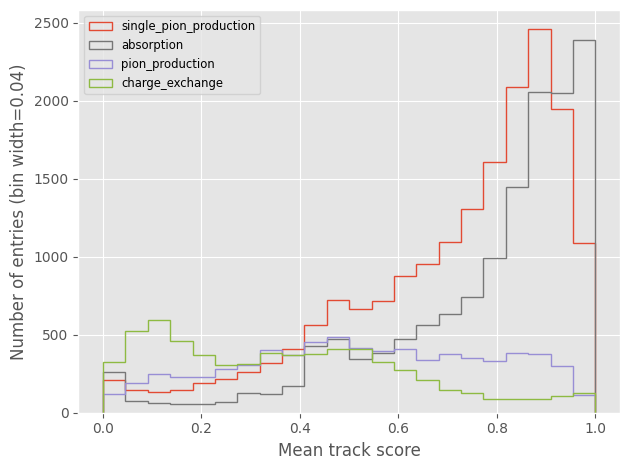

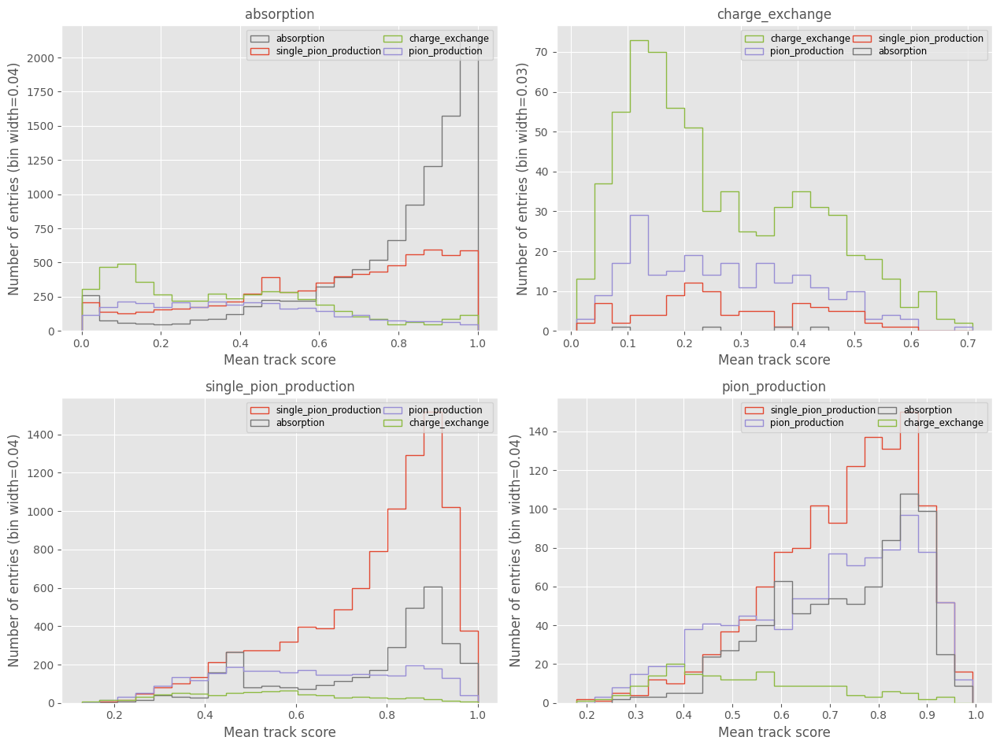

In [19]:
Plots.PlotTagged(mean_track_score, Tags.ExclusiveProcessTags(true_processes), x_label = "Mean track score", stacked = False, histtype = "step", alpha = 1, bins = 22, ncols = 1, reverse_sort = True)
plt.legend(loc = "upper left")
pdf.Save()

for _, r in Plots.IterMultiPlot(reco_regions):
    tags = Tags.ExclusiveProcessTags(true_processes)
    for t in tags:
        tags[t].mask = tags[t].mask[reco_regions[r]]
    Plots.PlotTagged(mean_track_score[reco_regions[r]], tags, x_label = "Mean track score", title = r, stacked = False, histtype = "step", alpha = 1, newFigure = False, bins = 22, reverse_sort = True, ncols = 2)
pdf.Save()

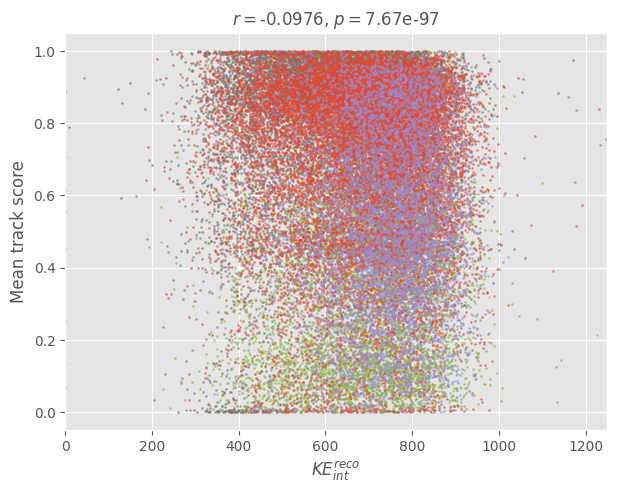

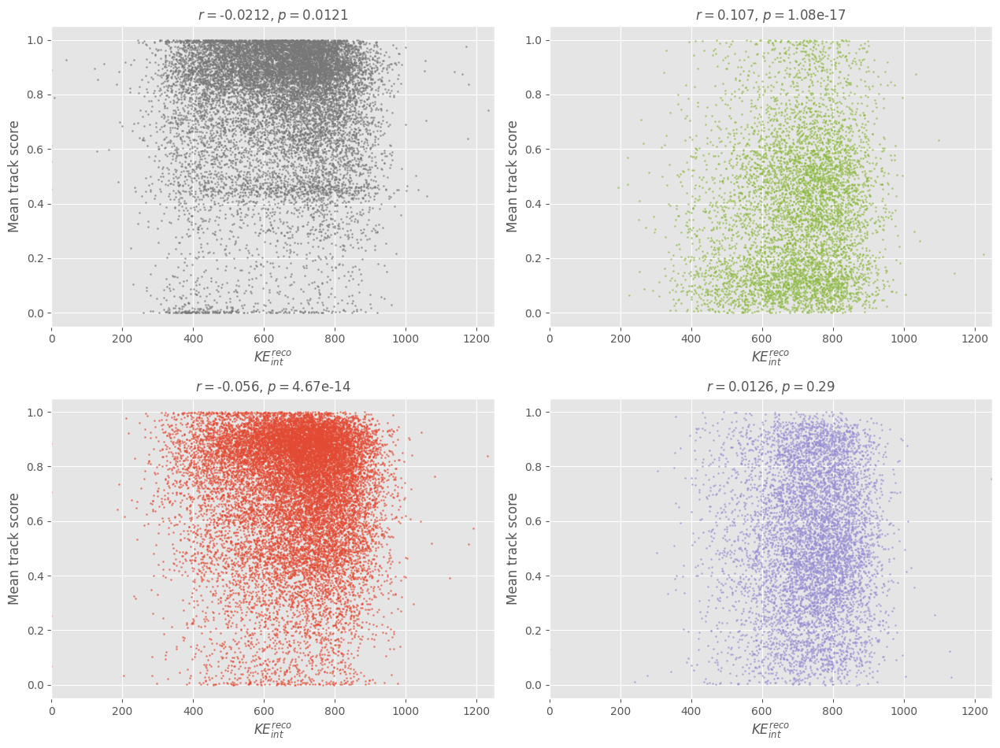

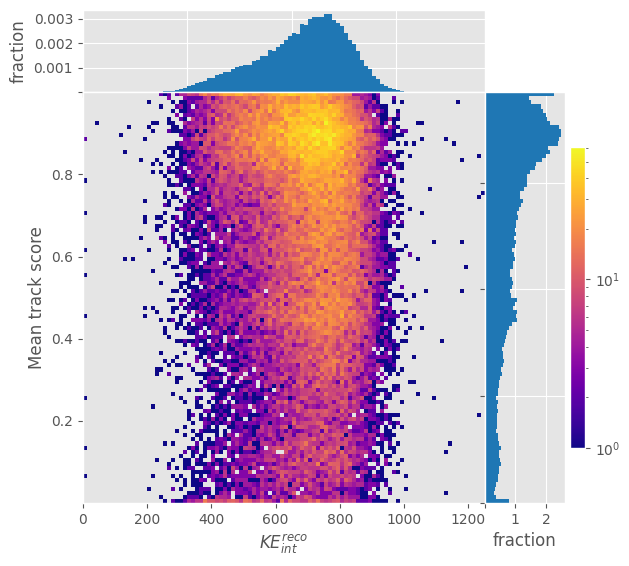

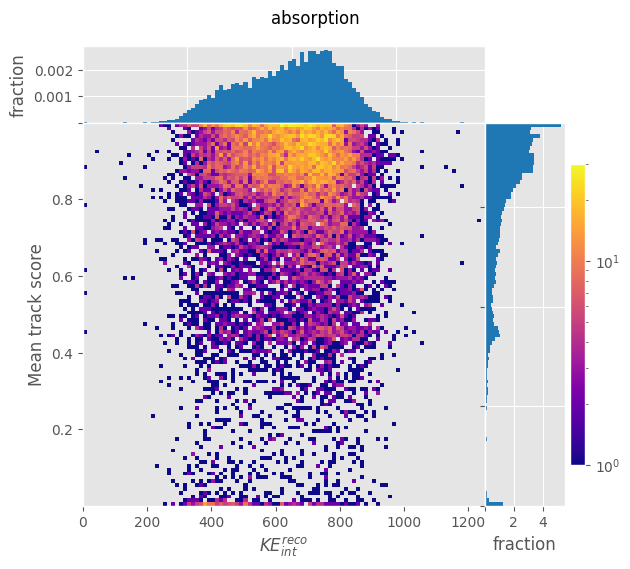

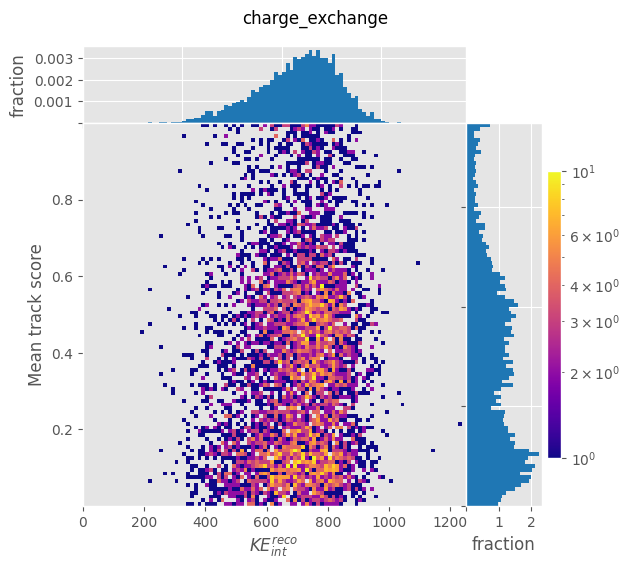

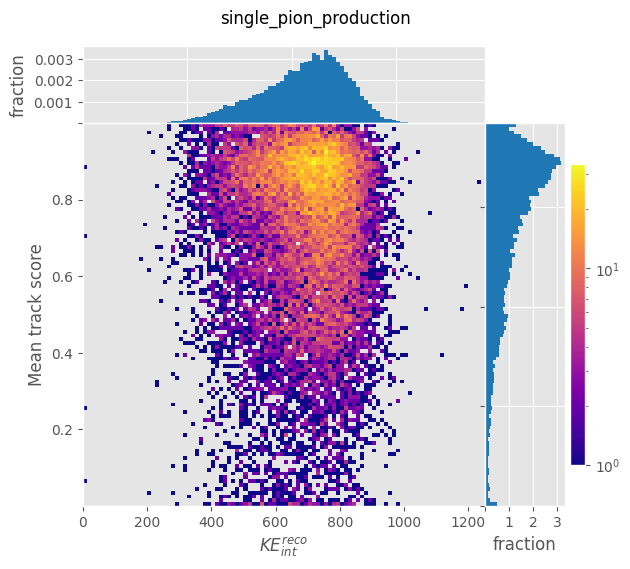

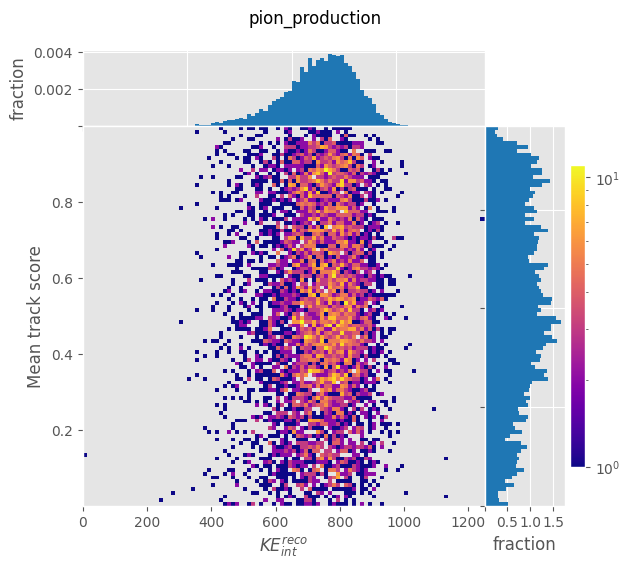

In [20]:
cc = stats.spearmanr(reco_KE_int, mean_track_score)
plt.figure()
tags = Tags.ExclusiveProcessTags(true_processes)
for t in tags:
    Plots.Plot(reco_KE_int[tags[t].mask], mean_track_score[tags[t].mask], color = tags[t].colour, xlabel = "$KE^{reco}_{int}$", ylabel = "Mean track score", alpha = 0.5, linestyle = "", marker = "o", markersize = 1, newFigure = False)
plt.xlim([0, 1250])
plt.title(f"$r=${cc.correlation:.3g}, $p=${cc.pvalue:.3g}")
pdf.Save()


for _, t in Plots.IterMultiPlot(tags):
    cc = stats.spearmanr(reco_KE_int[tags[t].mask], mean_track_score[tags[t].mask])
    Plots.Plot(reco_KE_int[tags[t].mask], mean_track_score[tags[t].mask], color = tags[t].colour, title = f"$r=${cc.correlation:.3g}, $p=${cc.pvalue:.3g}", xlabel = "$KE^{reco}_{int}$", ylabel = "Mean track score", alpha = 0.5, linestyle = "", marker = "o", markersize = 1, newFigure = False)
    plt.xlim([0, 1250])
pdf.Save()

Plots.PlotHist2DMarginal(reco_KE_int, mean_track_score, x_range = [0, 1250], xlabel = "$KE^{reco}_{int}$", ylabel = "Mean track score", cmap = "plasma")
for t in tags:
    Plots.PlotHist2DMarginal(reco_KE_int[tags[t].mask], mean_track_score[tags[t].mask], x_range = [0, 1250], xlabel = "$KE^{reco}_{int}$", ylabel = "Mean track score", cmap = "plasma")
    plt.suptitle(tags[t].name)
    plt.tight_layout()
    pdf.Save()


In [105]:
mask = reco_KE_int > 625
# mask = mean_track_score > 0.5

hi = []
lo = []
al = []
for t in true_processes:

    h = stats.spearmanr(reco_KE_int[mask & true_processes[t]], mean_track_score[mask & true_processes[t]])
    l = stats.spearmanr(reco_KE_int[~mask & true_processes[t]], mean_track_score[~mask & true_processes[t]])
    a = stats.spearmanr(reco_KE_int[true_processes[t]], mean_track_score[true_processes[t]])
    hi.append({"$\\rho$" : h.correlation, "p" : h.pvalue})
    lo.append({"$\\rho$" : l.correlation, "p" : l.pvalue})
    al.append({"$\\rho$" : a.correlation, "p" : a.pvalue})
labels = [k.replace("_", " ") for k in true_processes.keys()]

hi = pd.DataFrame(hi, index = labels).rename_axis("high", axis = "columns")
lo = pd.DataFrame(lo, index = labels).rename_axis("low", axis = "columns")
al = pd.DataFrame(al, index = labels).rename_axis("", axis = "columns")
display(hi.head())
display(lo.head())
display(al.head())

print(hi.style.to_latex())
print(lo.style.to_latex())
print(al.style.to_latex())

high,$\rho$,p
absorption,-0.137186,3.737647e-35
charge exchange,0.025210,8.311002e-02
single pion production,-0.089760,2.871600e-24
pion production,-0.007988,5.348511e-01


low,$\rho$,p
absorption,0.143168,2.176115e-28
charge exchange,0.090550,1.951877e-04
single pion production,0.000508,9.703848e-01
pion production,-0.056357,6.637796e-02


,$\rho$,p
absorption,-0.021234,1.212030e-02
charge exchange,0.106663,1.079534e-17
single pion production,-0.055996,4.671399e-14
pion production,0.012570,2.895491e-01


\begin{tabular}{lrr}
high & $\rho$ & p \\
absorption & -0.137186 & 0.000000 \\
charge exchange & 0.025210 & 0.083110 \\
single pion production & -0.089760 & 0.000000 \\
pion production & -0.007988 & 0.534851 \\
\end{tabular}

\begin{tabular}{lrr}
low & $\rho$ & p \\
absorption & 0.143168 & 0.000000 \\
charge exchange & 0.090550 & 0.000195 \\
single pion production & 0.000508 & 0.970385 \\
pion production & -0.056357 & 0.066378 \\
\end{tabular}

\begin{tabular}{lrr}
 & $\rho$ & p \\
absorption & -0.021234 & 0.012120 \\
charge exchange & 0.106663 & 0.000000 \\
single pion production & -0.055996 & 0.000000 \\
pion production & 0.012570 & 0.289549 \\
\end{tabular}

pdf mean_track_score_study.pdf has been closed


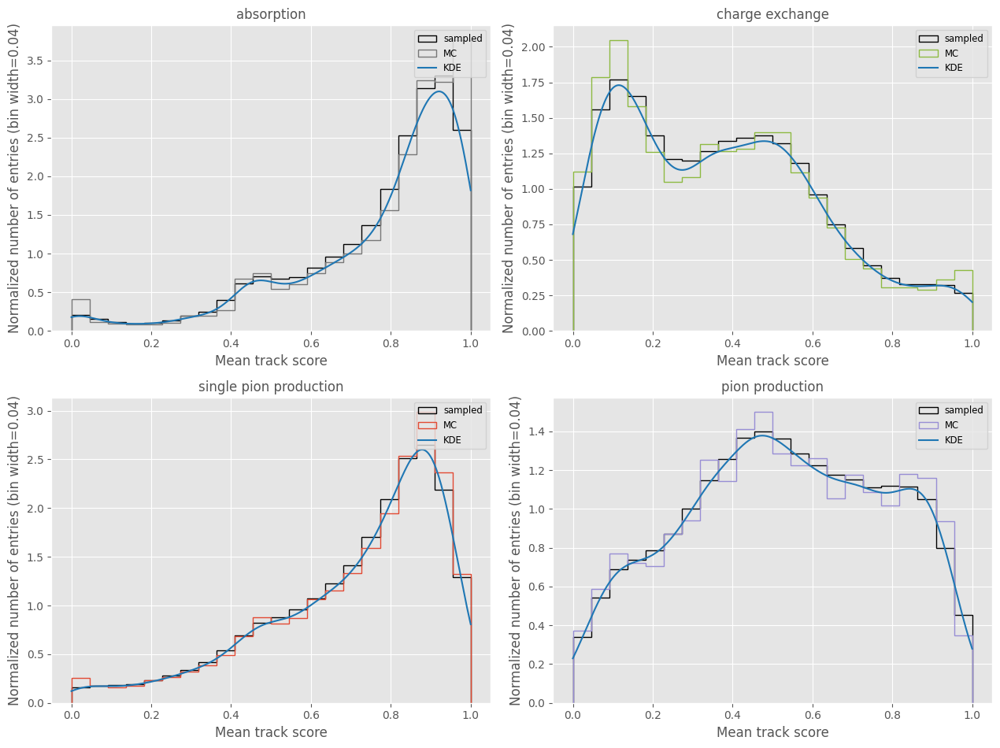

In [21]:
def MeanTrackScoreKDE(mean_track_score : ak.Array, processes : dict):
    kdes = {}
    for k, v in processes.items():
        kdes[k] = stats.gaussian_kde(mean_track_score[v])
        kdes[k].set_bandwidth(0.2)
    return kdes

x = np.linspace(0, 1, 1000)
kdes = MeanTrackScoreKDE(mean_track_score, true_processes)
for _, t in Plots.IterMultiPlot(true_processes):
    Plots.Plot(x, kdes[t].evaluate(x), label = "KDE", newFigure = False)
    Plots.PlotHistComparison([cex_toy_generator.GenerateMeanTrackScores(kdes[t], int(1E6)), mean_track_score[true_processes[t]]], xlabel = "Mean track score", colours = ["black", tags[t].colour], title = t.replace("_", " "), labels = ["sampled", "MC"], bins = 22, newFigure = False)
pdf.Save()
pdf.close()

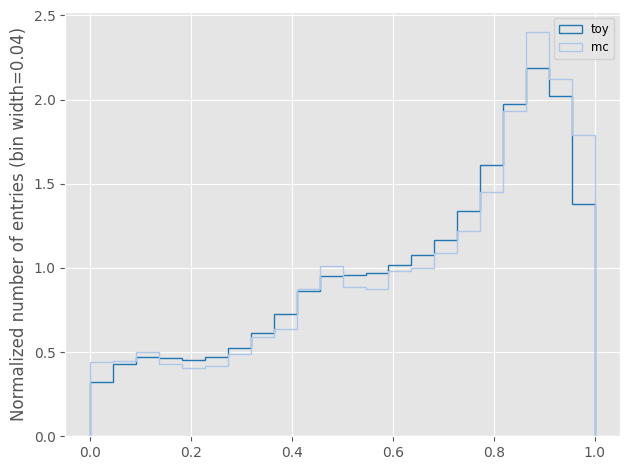

In [104]:
Plots.PlotHistComparison([toy_gaussian.df.mean_track_score[toy_gaussian.df.inclusive_process != "decay"], mean_track_score], bins = 22, labels = ["toy", "mc"])

# Modified cross section 

In [7]:
energy_slices = cross_section.Slices(50, 950, 2050, True)
n_initial, n_interact_inelastic, n_interact_exclusive, n_incident = cross_section.EnergySlice.CountingExperiment(toy_gaussian.df.KE_int, toy_gaussian.df.KE_init, toy_gaussian.outside_tpc, toy_gaussian.df.charge_exchange, energy_slices)

/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:848: RuntimeWarning: invalid value encountered in log
  xs = factor * n_interact_ratio * np.log(nandiv(n_inc_inclusive, n_inc_inclusive - n_int_inclusive))


(0.0, 100.0)

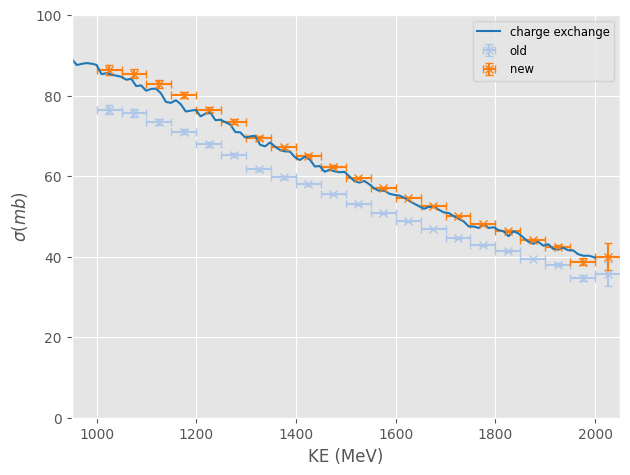

In [10]:
slice_dEdX = cross_section.EnergySlice.Slice_dEdX(energy_slices, cross_section.Particle.from_pdgid(211))
xs_old = cross_section.EnergySlice.TotalCrossSection(n_interact_exclusive, n_incident, slice_dEdX, energy_slices.width)
xs_new = cross_section.EnergySlice.CrossSection(n_interact_exclusive, n_interact_inelastic, n_incident, slice_dEdX, energy_slices.width)

geant_xs.Plot("charge_exchange")
Plots.Plot(energy_slices.pos - energy_slices.width/2, xs_old[0], yerr = xs_old[1], xerr = energy_slices.width/2, linestyle = "", marker = "x", label = "old", newFigure = False)
Plots.Plot((energy_slices.pos - energy_slices.width/2)[:-1], xs_new[0][:-1], yerr = xs_new[1][:-1], xerr = energy_slices.width/2, linestyle = "", marker = "x", label = "new", newFigure = False)
plt.xlim(950, 2050)
plt.ylim(0, 100)

# Altered Simulation curves

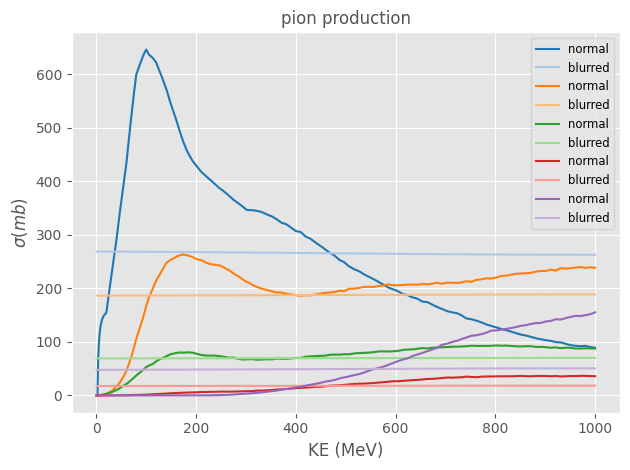

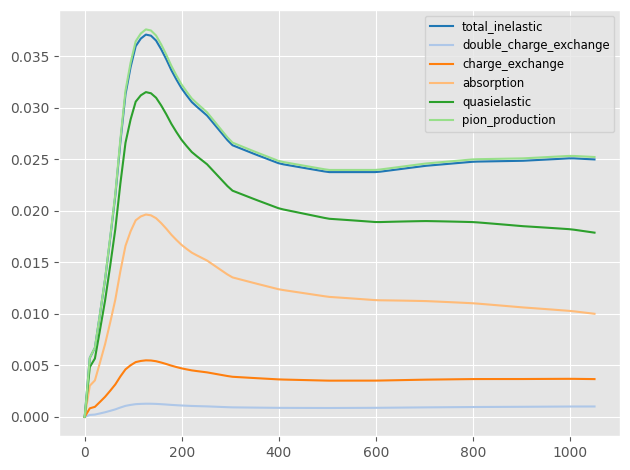

In [174]:
blur_strength = {
    'absorption': 1000,
    'quasielastic': 1000,
    'charge_exchange': 1000,
    'double_charge_exchange': 1000,
    'pion_production': 1000
    }

sim_xs = cross_section.GeantCrossSections(energy_range = [0, 1000])

plt.figure()
for b in blur_strength:
    sim_xs.Plot(b, label = "normal")
    setattr(sim_xs, b, cex_toy_generator.gaussian_filter1d(getattr(sim_xs, b), blur_strength[b]))
    sim_xs.Plot(b, label = "blurred")

pdfs = cex_toy_generator.GenerateStackedPDFs(2, blur_strengths = blur_strength)
plt.figure()
x = np.linspace(0, 1050, 101)
for k in pdfs:
    Plots.Plot(x, pdfs[k](x), label = k, newFigure = False)

In [183]:
toy_normal = cross_section.Toy(df = cex_toy_generator.main(cex_toy_generator.ResolveConfig(CreateConfig())), smearing = True)
toy_altered = cross_section.Toy(df = cex_toy_generator.main(cex_toy_generator.ResolveConfig(CreateConfig(blur_strength = blur_strength))), smearing = True)


starting batch : 0, cpus : 11

starting batch : 1, cpus : 11

starting batch : 2, cpus : 11

starting batch : 3, cpus : 11

starting batch : 4, cpus : 7

'Smearing' executed in 0.1027s

'BeamSelectionEfficiency' executed in 0.0058s

'GenerateRecoRegions' executed in 0.0768s

'MeanTrackScore' executed in 0.3650s

'main' executed in 3.9143s

starting batch : 0, cpus : 11

starting batch : 1, cpus : 11

starting batch : 2, cpus : 11

starting batch : 3, cpus : 11

starting batch : 4, cpus : 7

'Smearing' executed in 0.1232s

'BeamSelectionEfficiency' executed in 0.0051s

'GenerateRecoRegions' executed in 0.0846s

'MeanTrackScore' executed in 0.3677s

'main' executed in 4.1438s

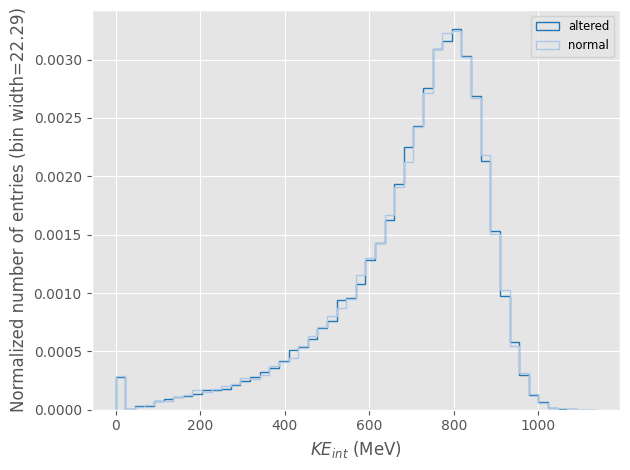

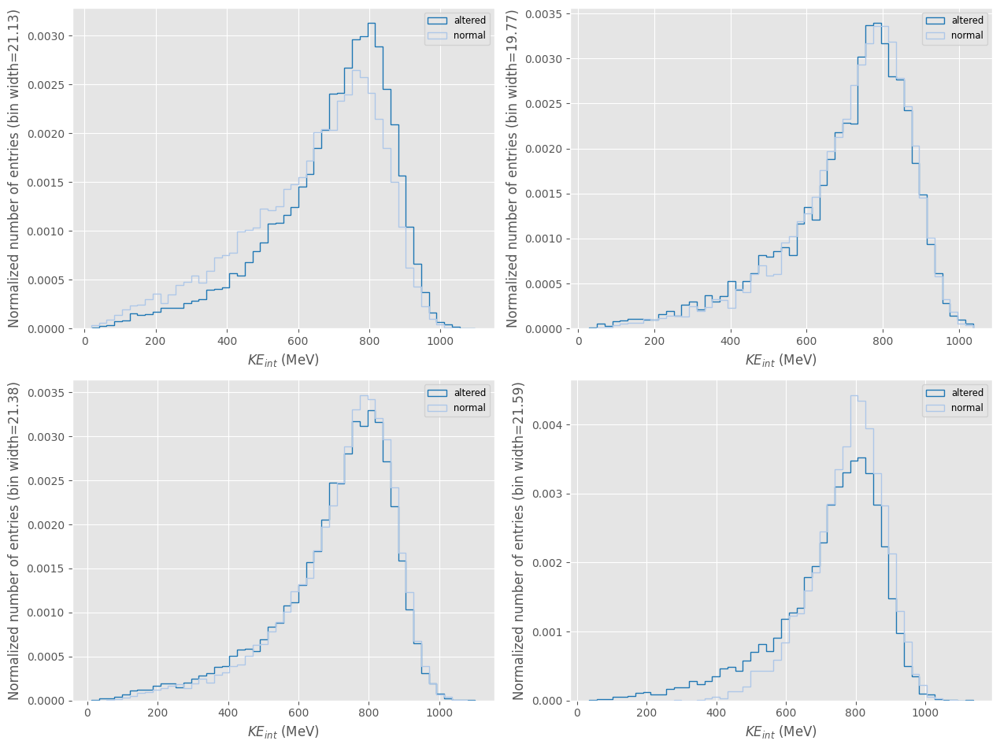

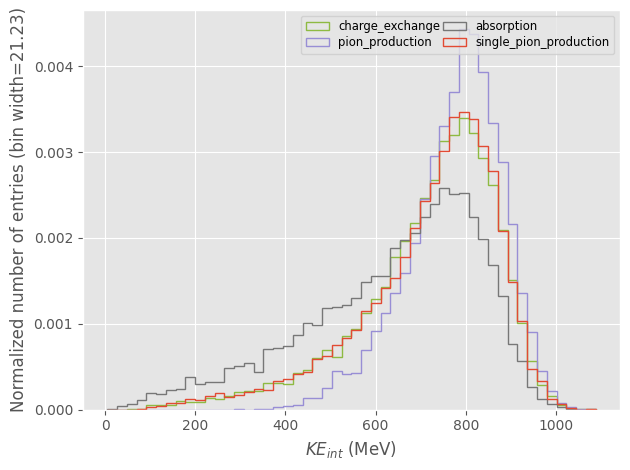

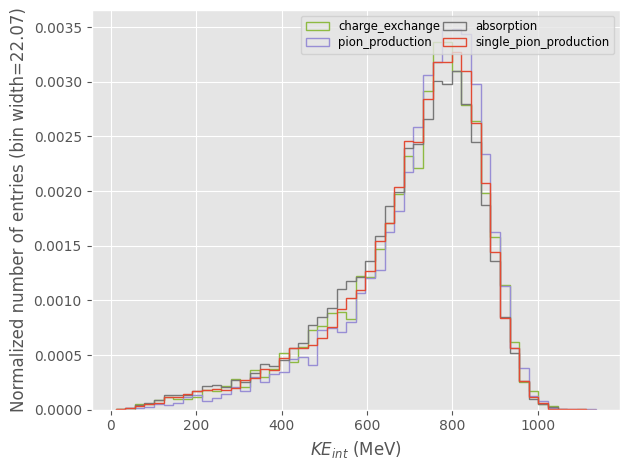

In [184]:
Plots.PlotHistComparison([toy_altered.df.KE_int, toy_normal.df.KE_int], labels = ["altered", "normal"], bins = 50, xlabel = "$KE_{int}$ (MeV)", newFigure = False)

for _, t in Plots.IterMultiPlot(toy_altered.truth_region_labels):
    Plots.PlotHistComparison([toy_altered.df.KE_int[toy_altered.truth_regions[t]], toy_normal.df.KE_int[toy_normal.truth_regions[t]]], labels = ["altered", "normal"], bins = 50, xlabel = "$KE_{int}$ (MeV)", newFigure = False)

Plots.PlotTagged(toy_normal.df.KE_int, Tags.ExclusiveProcessTags(toy_normal.truth_regions), stacked = False, histtype = "step", bins = 50, x_label = "$KE_{int}$ (MeV)", norm = True)
Plots.PlotTagged(toy_altered.df.KE_int, Tags.ExclusiveProcessTags(toy_altered.truth_regions), stacked = False, histtype = "step", bins = 50, x_label = "$KE_{int}$ (MeV)", norm = True)

In [188]:
df = cex_toy_generator.main(cex_toy_generator.ResolveConfig(CreateConfig(events = int(5E4), seed = 1)))

df.KE_int_smearing

starting batch : 0, cpus : 11

starting batch : 1, cpus : 11

starting batch : 2, cpus : 11

starting batch : 3, cpus : 11

starting batch : 4, cpus : 6

'Smearing' executed in 0.1018s

'BeamSelectionEfficiency' executed in 0.0041s

'GenerateRecoRegions' executed in 0.0835s

'MeanTrackScore' executed in 0.3301s

'main' executed in 3.8853s

0         8.740802
1        20.343179
2        21.082969
3        -0.203075
4        -1.314183
           ...    
49995    55.757348
49996    39.485698
49997    34.424791
49998   -10.085972
49999    45.656201
Name: KE_int_smearing, Length: 50000, dtype: float64

# Comparing Spatial Slice to MC truth

/tmp/ipykernel_41775/249587869.py:102: RuntimeWarning: invalid value encountered in divide
  ratio_err = ratio * np.sqrt((self.y1_err/self.y1)**2 + (self.y2_err/self.y2)**2)
/tmp/ipykernel_41775/249587869.py:97: RuntimeWarning: divide by zero encountered in divide
  ratio = self.y1 / self.y2
/tmp/ipykernel_41775/249587869.py:97: RuntimeWarning: invalid value encountered in divide
  ratio = self.y1 / self.y2
/tmp/ipykernel_41775/249587869.py:80: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.subplots(2, 1, figsize = (6.4, 4.8 * 1.2), gridspec_kw={"height_ratios" : [5, 1]} , sharex = True) # set to that the ratio plot is 1/5th the default plot height


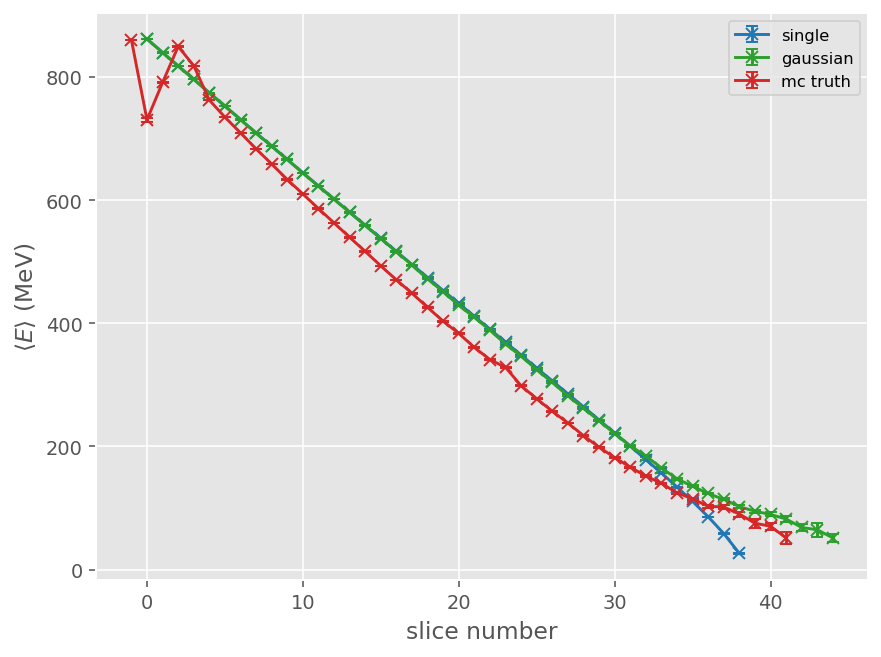

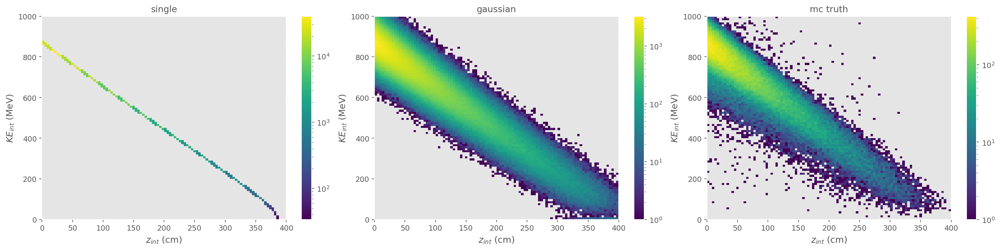

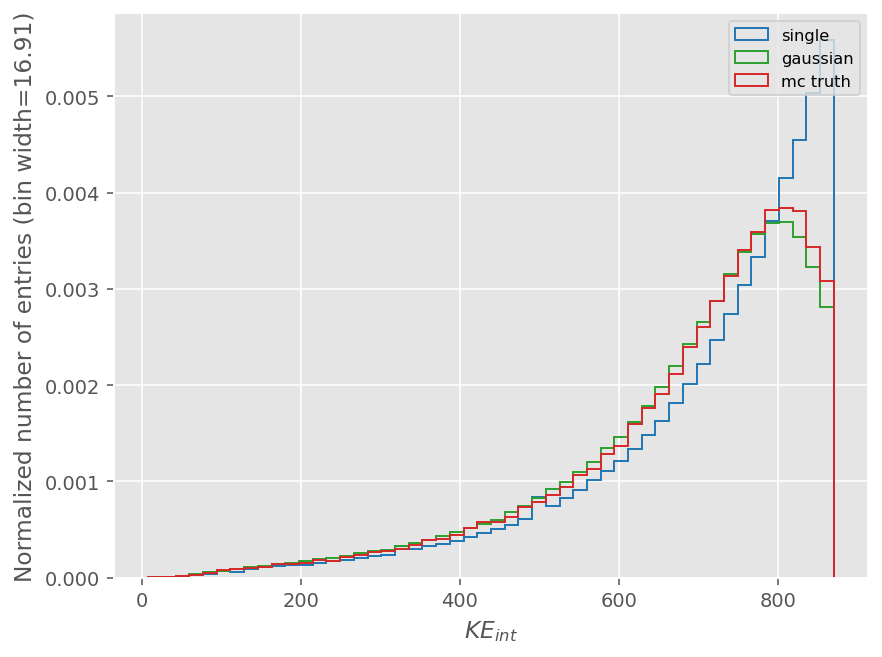

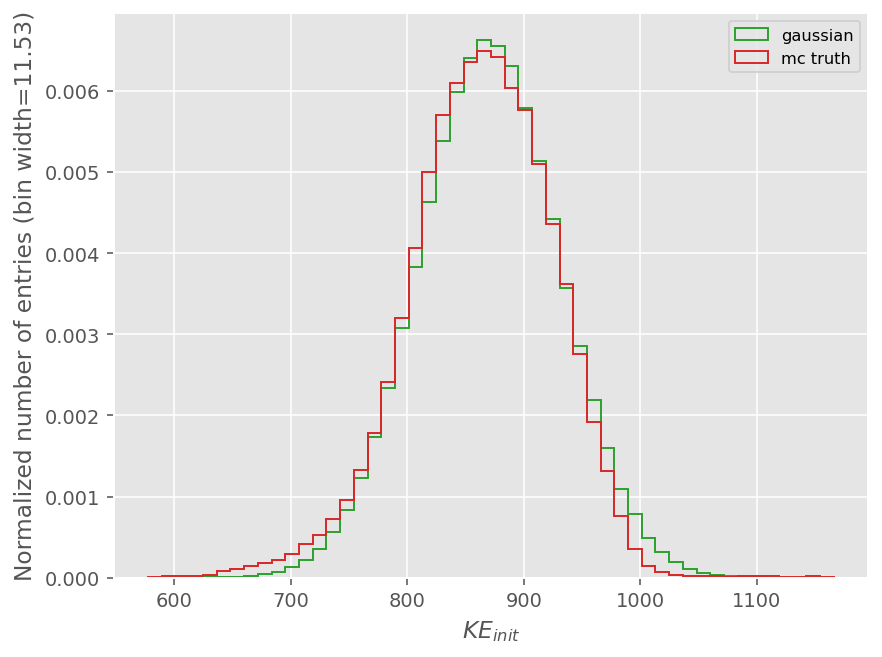

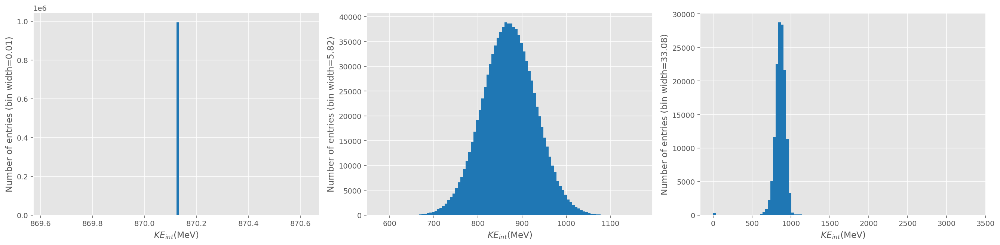

...

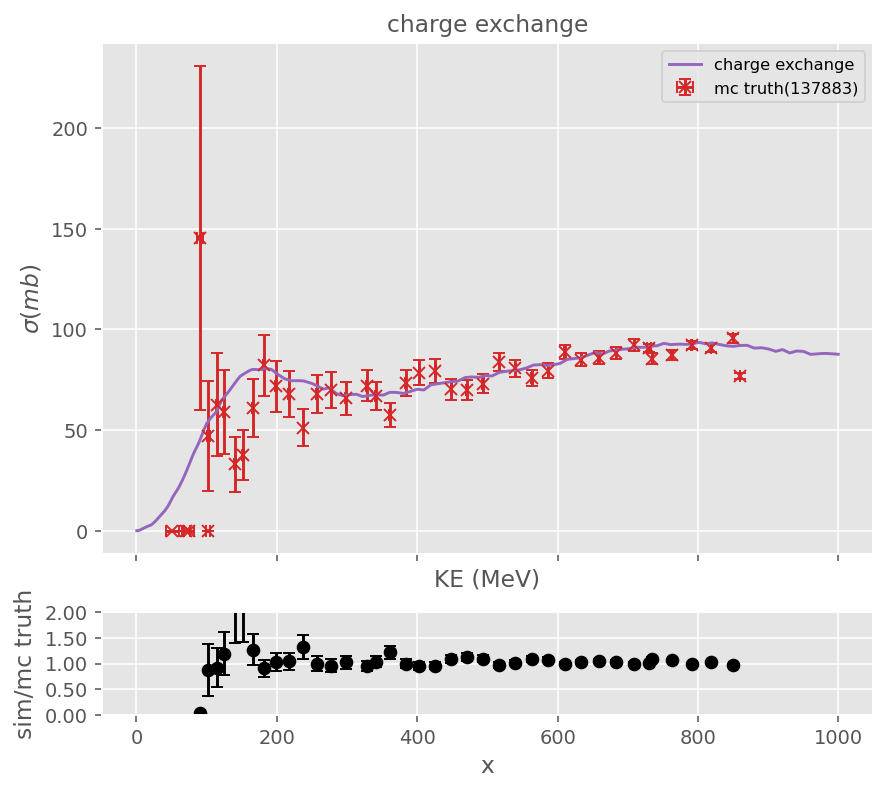

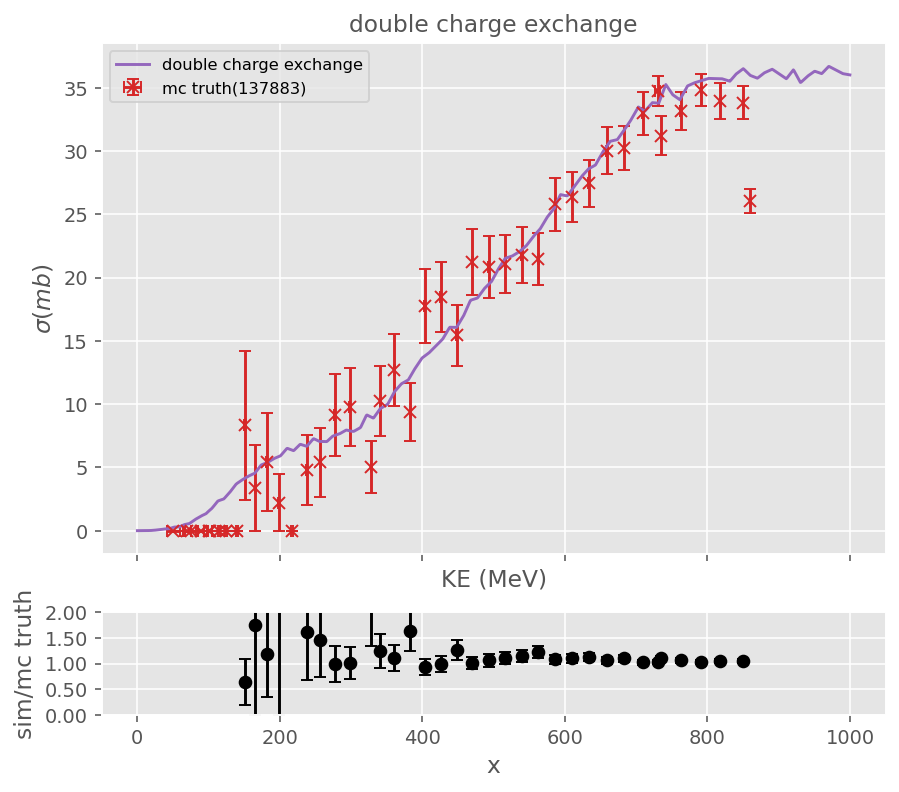

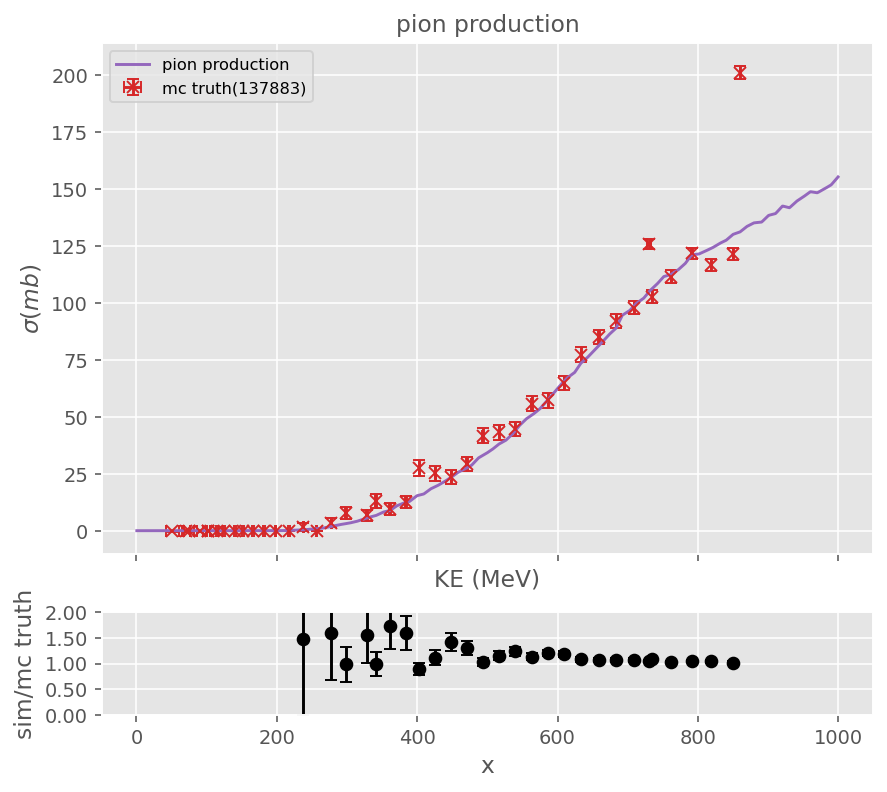

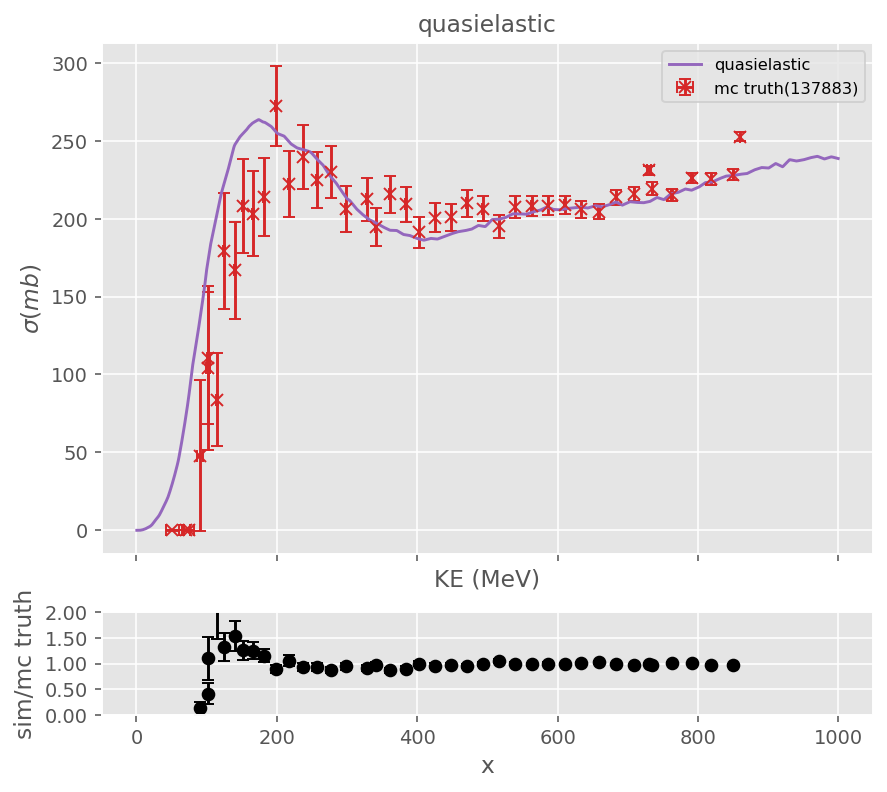

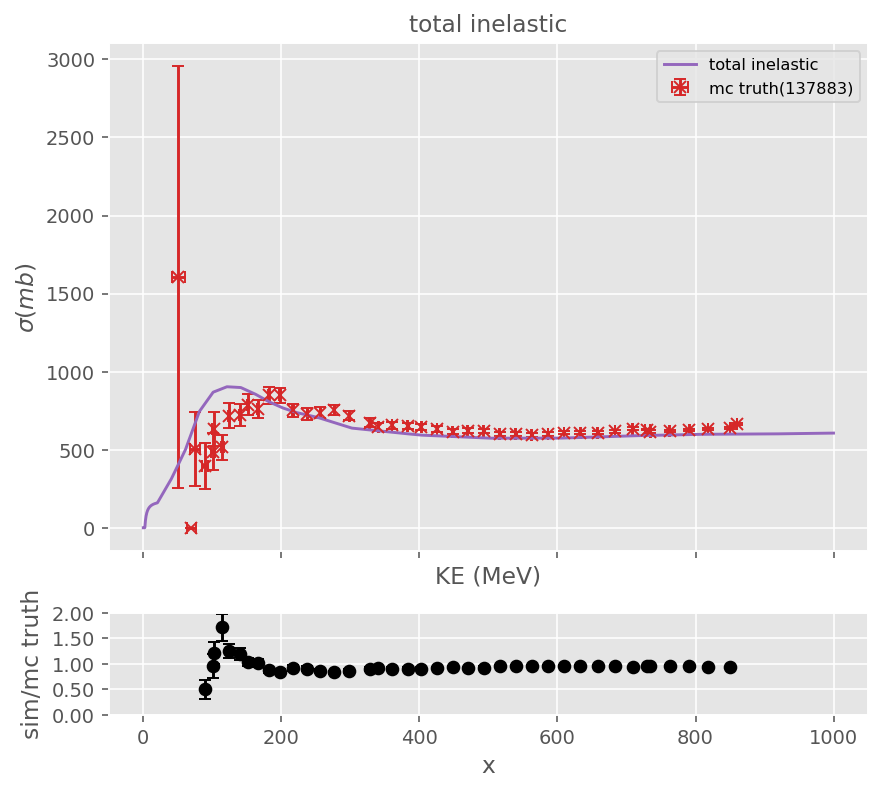

In [99]:
def ThinSliceComparison(config : str, slice_width : float, position_range : list):
    """ Compares thin slice method for the single profile toy, gaussian profile toy and mc truth.

    Args:
        slice_width (float): spatial slice width (cm)
        position_range (list): min, max position for slices (cm)
    """
    slices = cross_section.Slices(slice_width, min(position_range), max(position_range))

    args = cross_section.ApplicationArguments.ResolveConfig(cross_section.LoadConfiguration(config))
    mc = Master.Data(args.mc_file, -1, nTuple_type = args.ntuple_type)
    true_pion_mask = mc.trueParticles.pdg[:, 0] == 211
    mc.Filter([true_pion_mask], [true_pion_mask])

    interact_position = mc.trueParticles.endPos.z[:, 0] # get interaction vertex z position

    traj_KE = mc.trueParticles.beam_traj_KE # get beam particle kinetic energy at each trajectory point from simulation
    traj_pos = mc.trueParticles.beam_traj_pos.z # get beam particle z at each trajectory point from simulation 

    colours = {
        "single"   : "C0",
        "gaussian" : "C4",
        "mc truth" : "C6"
    }

    mean_energies = {}
    mean_energies["single"] = cross_section.ThinSlice.MeanSliceEnergy(toy_single.KE_int[toy_single.total_inelastic], toy_single.z_int[toy_single.total_inelastic], slices)
    mean_energies["gaussian"] = cross_section.ThinSlice.MeanSliceEnergy(toy_gaussian.df.KE_int[toy_gaussian.df.total_inelastic], toy_gaussian.df.z_int[toy_gaussian.df.total_inelastic], slices)
    mean_energies["mc truth"] = cross_section.ThinSlice.MeanSliceEnergy(traj_KE[mc_regions["total_inelastic"]], traj_pos[mc_regions["total_inelastic"]], slices)

    for l, v in mean_energies.items():
        Plots.Plot(slices.num[:-2], v[0][:-1], marker = "x", yerr = v[1][:-1], label = l, xlabel = "slice number", ylabel = "$\left< E \\right>$ (MeV)", newFigure = False, color = colours[l])
    pdf.Save()

    z_int = {
        "single"   : toy_single.z_int[toy_single.total_inelastic],
        "gaussian" : toy_gaussian.df.z_int[toy_single.total_inelastic],
        "mc truth" : interact_position[mc_regions["total_inelastic"]]
    }
    KE_int = {
        "single"   : toy_single.KE_int[toy_single.total_inelastic],
        "gaussian" : toy_gaussian.df.KE_int[toy_single.total_inelastic],
        "mc truth" : traj_KE[:, -2][mc_regions["total_inelastic"]]
    }

    for _, d in Plots.IterMultiPlot(list(z_int.keys()), sharex = True, sharey = True):
        Plots.PlotHist2D(z_int[d], KE_int[d], xlabel = "$z_{int}$ (cm)", ylabel = "$KE_{int}$ (MeV)", title = d, newFigure = False, x_range = [0, 400], y_range = [0, 1000])
    pdf.Save()

    Plots.PlotHistComparison([toy_single.KE_int[toy_single.total_inelastic], toy_gaussian.KE_int[toy_gaussian.total_inelastic], traj_KE[:, -2][mc_regions["total_inelastic"]]], labels = list(mean_energies.keys()), bins = 50, colours = list(colours.values()), xlabel = "$KE_{int}$")
    pdf.Save()
    Plots.PlotHistComparison([toy_gaussian.df.KE_init[toy_gaussian.df.total_inelastic], mc.trueParticles.KE_front_face[mc_regions["total_inelastic"]]], labels = ["gaussian", "mc truth"], bins = 50, colours = [colours["gaussian"], colours["mc truth"]], xlabel = "$KE_{init}$")
    pdf.Save()
    
    for _, d in Plots.IterMultiPlot([toy_single.df.KE_init[toy_single.df.total_inelastic], toy_gaussian.df.KE_init[toy_gaussian.df.total_inelastic], mc.trueParticles.KE_front_face[mc_regions["total_inelastic"]]]):
        Plots.PlotHist(d, xlabel = "$KE_{int}$(MeV)", newFigure = False)
    pdf.Save()
    for d in [toy_single.KE_init[toy_single.total_inelastic], toy_gaussian.df.KE_init[toy_gaussian.df.total_inelastic], mc.trueParticles.KE_front_face[mc_regions["total_inelastic"]]]:
        Plots.PlotHist(d, xlabel = "$KE_{int}$(MeV)")
        pdf.Save()

    hists = {}
    for c in toy_gaussian.exclusive_processes:
        hists[c] = {
            "single"   : cross_section.ThinSlice.CountingExperiment(toy_single.z_int, c, slices),
            "gaussian" : cross_section.ThinSlice.CountingExperiment(toy_gaussian.df.z_int, c, slices),
            "mc truth" : cross_section.ThinSlice.CountingExperiment(interact_position, c, slices)
        }

    xs = {}
    for c in toy_gaussian.exclusive_processes:
        if c == "mc truth": # needed because beam particle travel through the TPC in an angle
            attenuation = 0.95
        else:
            attenuation = 1
        xs[c] = {h : cross_section.ThinSlice.TotalCrossSection(hists[c][h][1], hists[c][h][0], slices.width / attenuation)  for h in hists[c]}


    for _, c in Plots.IterMultiPlot(toy_gaussian.exclusive_processes, sharex = True):
        counts = {
            "single" : sum(c),
            "gaussian" : sum(c),
            "mc truth" : sum(c)
        }

        geant_xs.Plot(c, color = "C8")
        for h in xs[c]:
            Plots.Plot(mean_energies[h][0], xs[c][h][0], xerr = mean_energies[h][1], yerr = xs[c][h][1], marker = "x", linestyle = "", newFigure = False, label = f"{h}({counts[h]})", title = c.replace("_", " "), color = colours[h])
        plt.ylim(0, 1.2 * max(getattr(geant_xs, c)))
    pdf.Save()
    return

ThinSliceComparison("work/2023/cex_analysis_1GeV_config.json", 10, [-10, 720])

/tmp/ipykernel_41775/249587869.py:102: RuntimeWarning: invalid value encountered in divide
  ratio_err = ratio * np.sqrt((self.y1_err/self.y1)**2 + (self.y2_err/self.y2)**2)
/home/sb16165/anaconda3/envs/python3_10_0/lib/python3.10/site-packages/awkward/_connect/_numpy.py:195: RuntimeWarning: invalid value encountered in divide
  result = getattr(ufunc, method)(


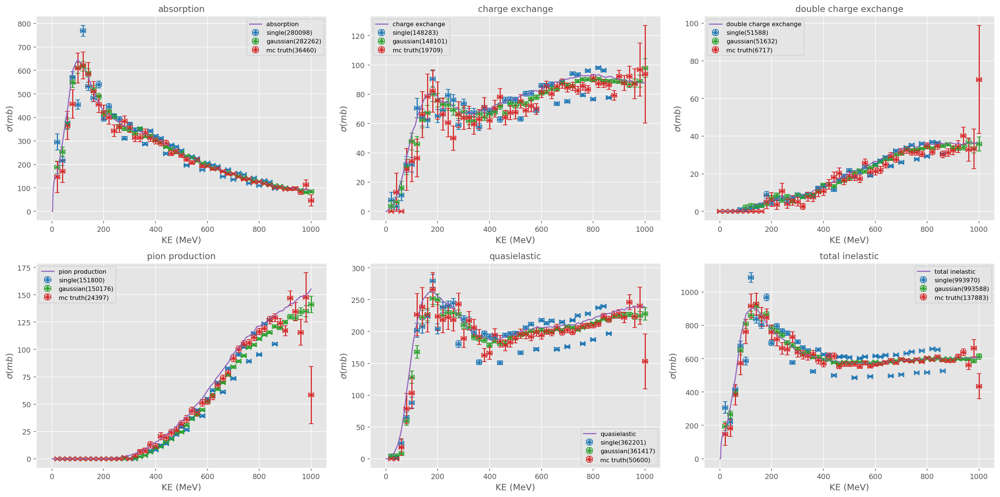

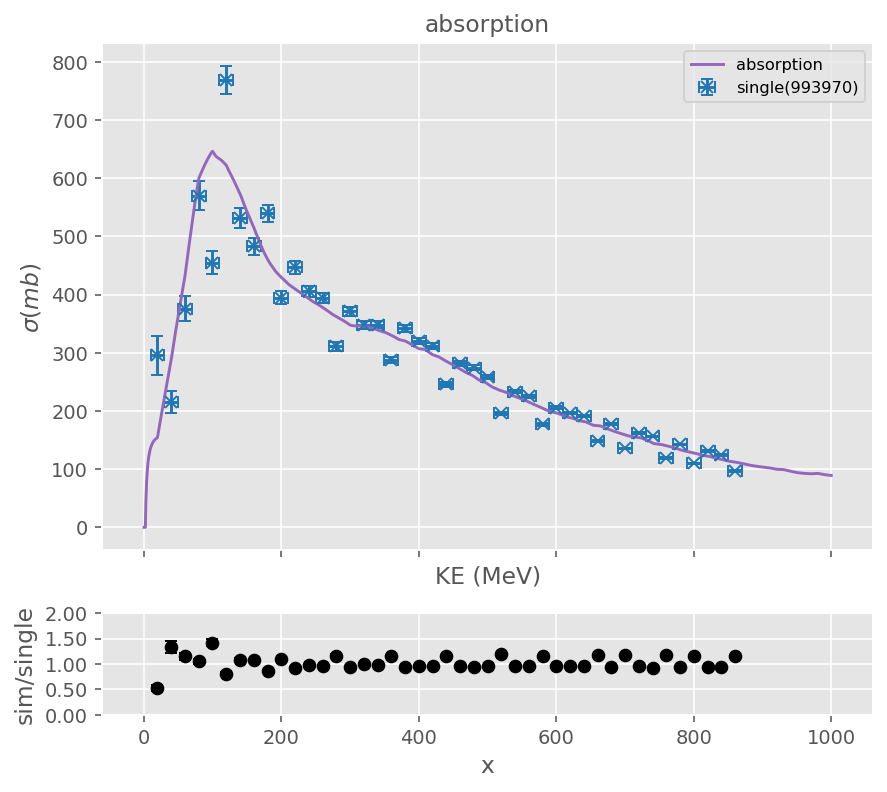

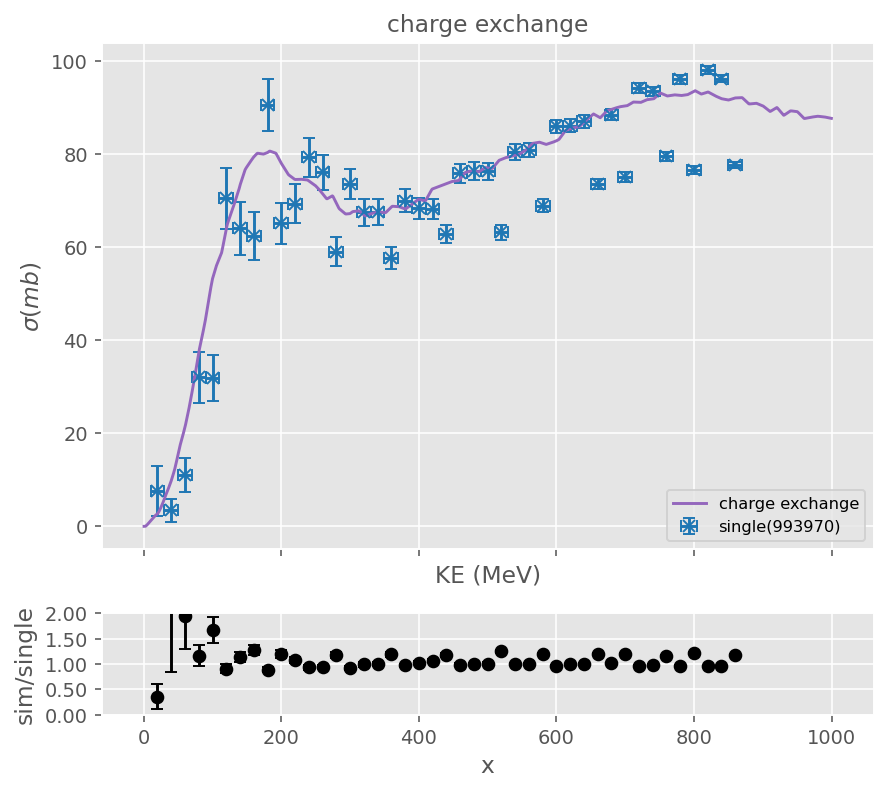

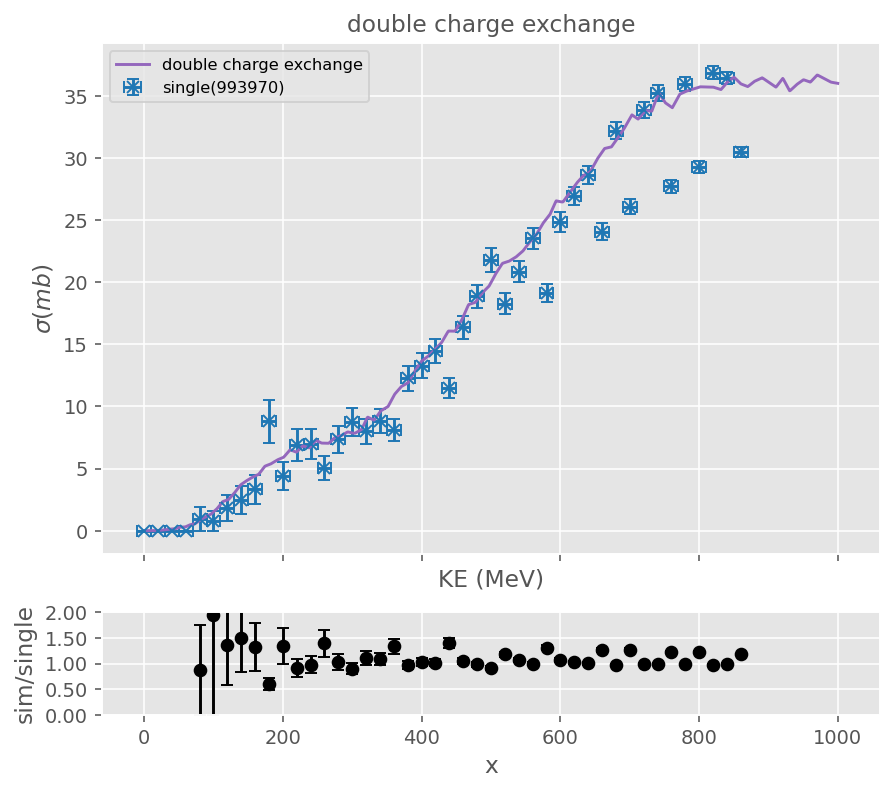

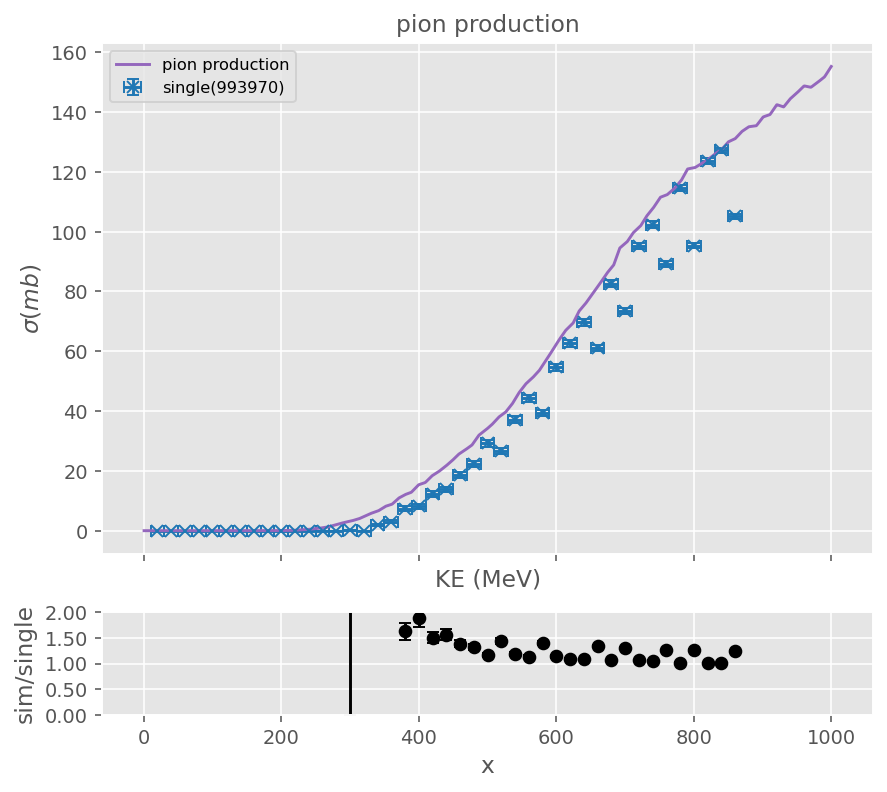

...

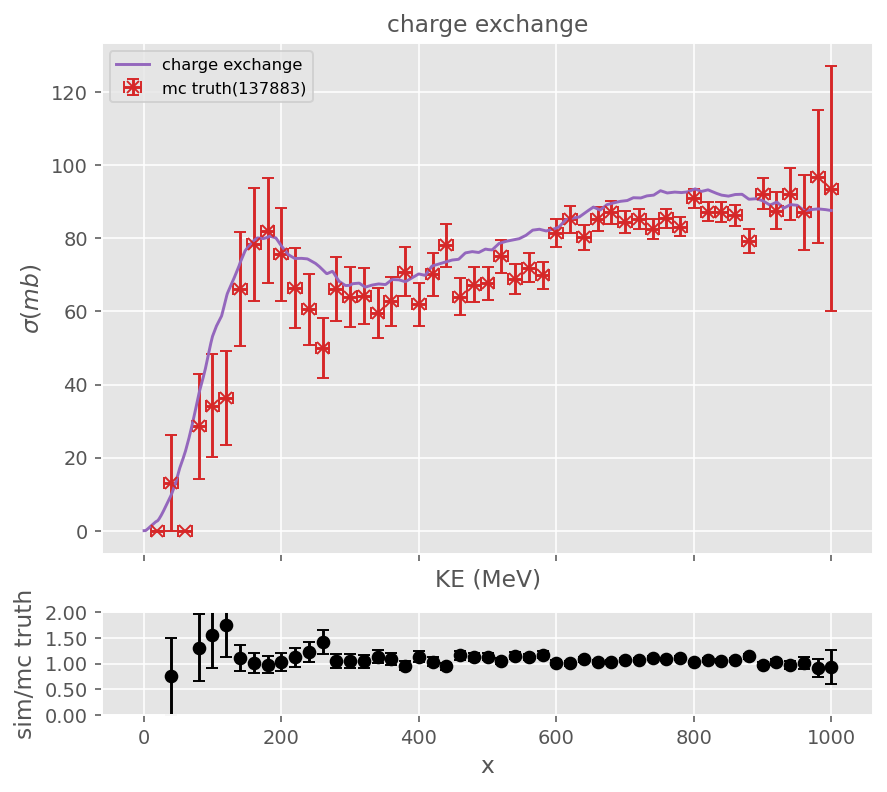

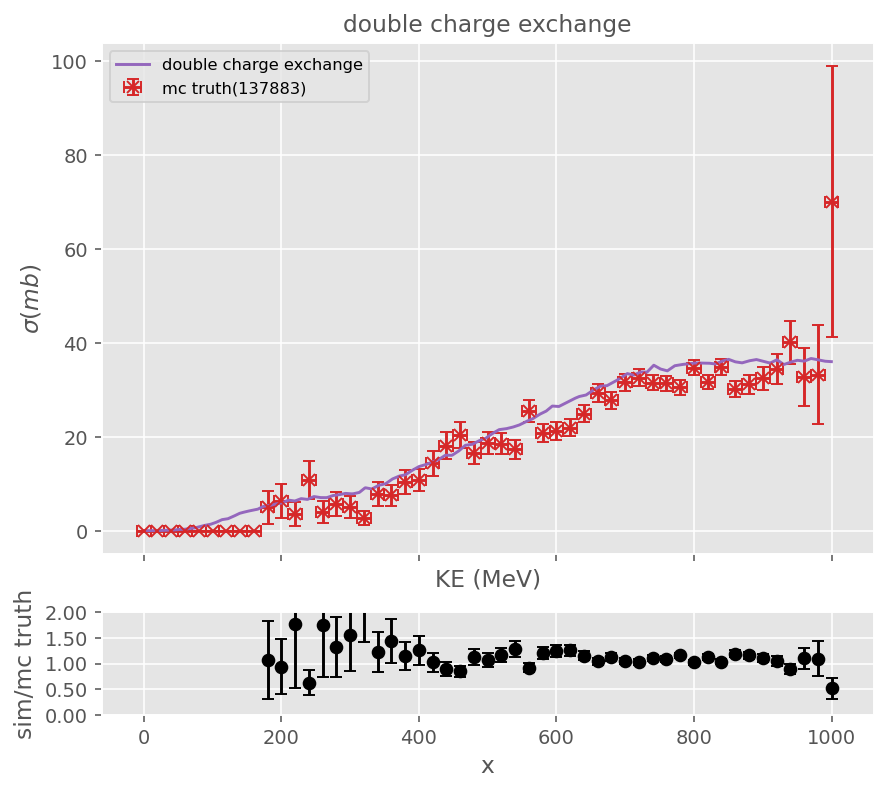

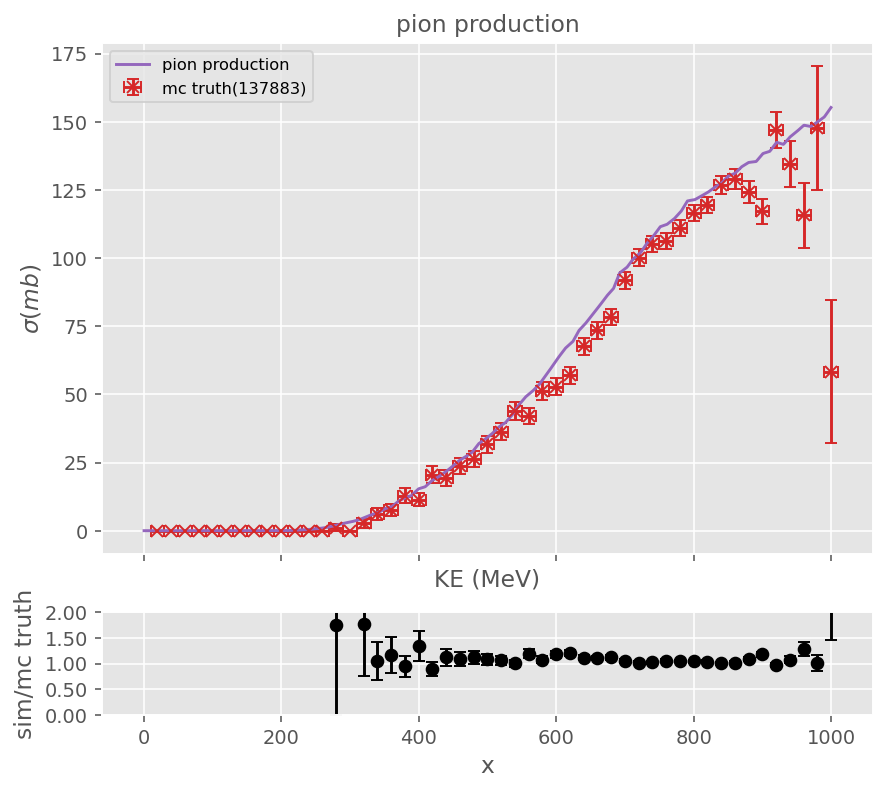

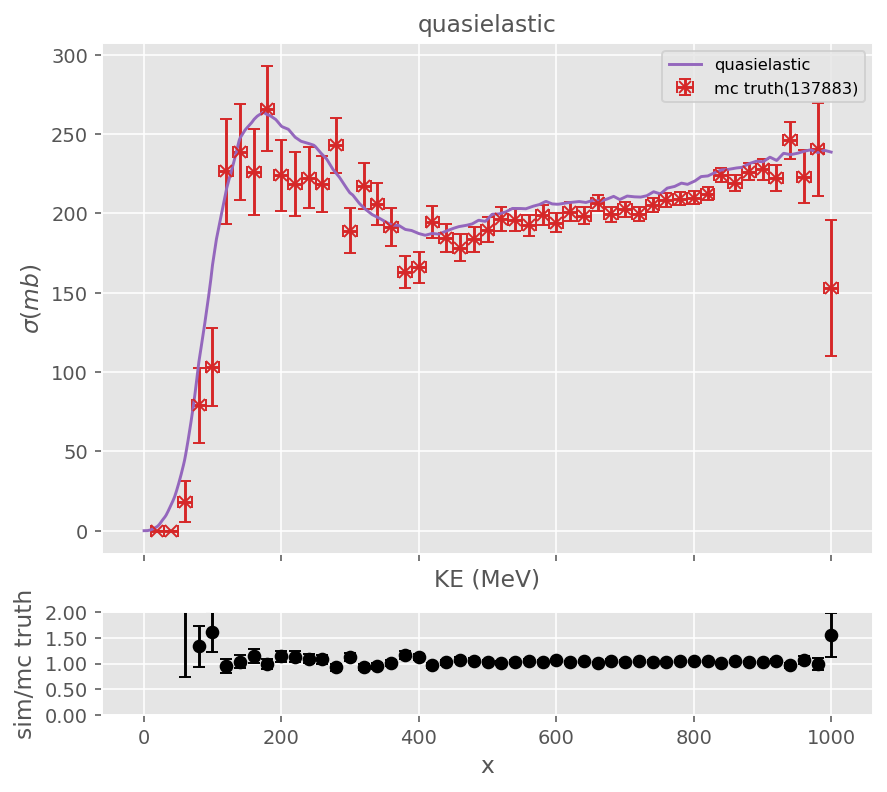

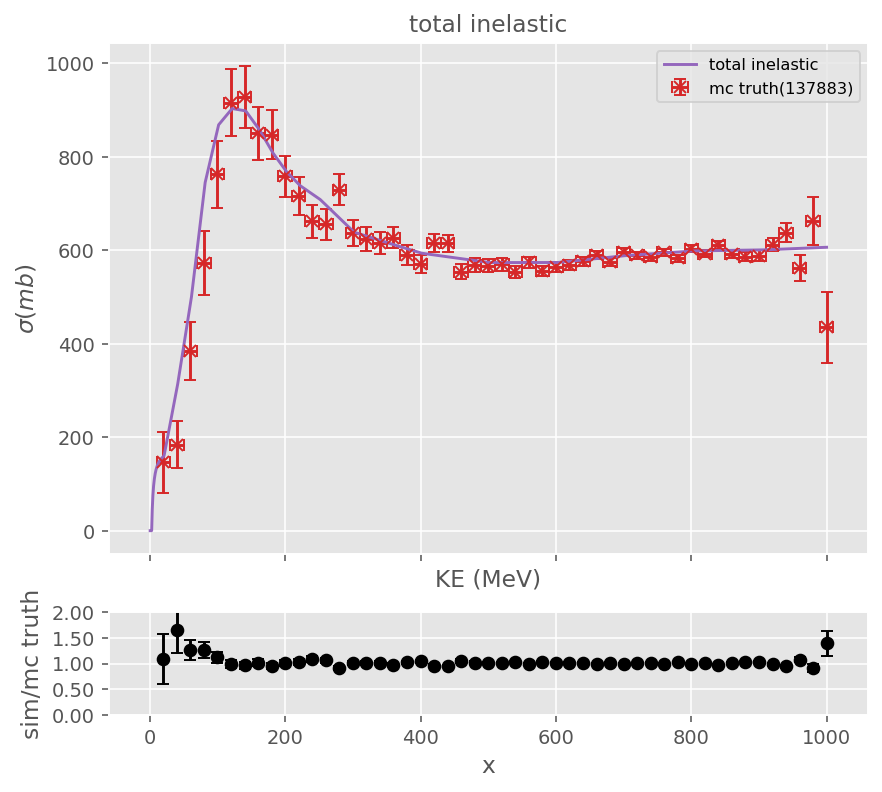

In [100]:
def ESliceComparison(config : str, slice_width : float, energy_range : list):
    """ Compares energy slice method for the single profile toy, gaussian profile toy and mc truth.

    Args:
        slice_width (float): energy slice width (MeV)
        energy_range (list): energy range of slices (MeV)
    """
    energy_slices = cross_section.Slices(slice_width, min(energy_range), max(energy_range), reversed = True)
    slice_dEdX = cross_section.EnergySlice.Slice_dEdX(energy_slices, cross_section.Particle.from_pdgid(211))

    args = cross_section.ApplicationArguments.ResolveConfig(cross_section.LoadConfiguration(config))
    mc = Master.Data(args.mc_file, -1, nTuple_type = args.ntuple_type)
    true_pion_mask = mc.trueParticles.pdg[:, 0] == 211
    mc.Filter([true_pion_mask], [true_pion_mask])

    ind = ak.argmax(mc.trueParticles.beam_traj_pos.z > 0, -1, keepdims = True)
    true_ffKE = ak.where(ak.flatten(mc.trueParticles.beam_traj_pos.z[ind]) < 0, 999999, mc.trueParticles.KE_front_face) # set KE to 999999 if the particle didn't reach the TPC.

    colours = {
        "single" : "C0",
        "gaussian" : "C4",
        "mc truth" : "C6"
    }

    KE_int = {
        "single" : toy_single.KE_int,
        "gaussian" : toy_gaussian.df.KE_int,
        "mc truth" : mc.trueParticles.beam_traj_KE[:, -2]
    }

    KE_init = {
        "single" : toy_single.KE_init,
        "gaussian" : toy_gaussian.df.KE_init,
        "mc truth" : true_ffKE
    }

    outside = {
        "single" : toy_single.z_int < 0,
        "gaussian" : toy_gaussian.df.z_int < 0,
        "mc truth" : true_ffKE >= 999999
    }

    sample_masks = {
        "single" : toy_single[toy_gaussian.exclusive_processes],
        "gaussian" : toy_gaussian.df[toy_gaussian.exclusive_processes],
        "mc truth" : mc_regions
    }

    hists = {}
    for c in toy_gaussian.exclusive_processes:
        hists[c] = {s : cross_section.EnergySlice.CountingExperiment(KE_int[s], KE_init[s], outside[s], sample_masks[s][c], energy_slices) for s in KE_int}

    xs = {}
    for c in toy_gaussian.exclusive_processes:
        xs[c] = {h : cross_section.EnergySlice.TotalCrossSection(hists[c][h][0], hists[c][h][1], slice_dEdX, energy_slices.width) for h in hists[c]}

    for _, c in Plots.IterMultiPlot(toy_gaussian.exclusive_processes, sharex = True):
        counts = {i : sum(sample_masks[i][c]) for i in sample_masks}

        geant_xs.Plot(c, color = "C8")
        for h in hists[c]:
            Plots.Plot(energy_slices.pos[1:], xs[c][h][0][1:], xerr = energy_slices.width/2, yerr = xs[c][h][1][1:], marker = "x", linestyle = "", newFigure = False, label = f"{h}({counts[h]})", title = c.replace("_", " "), color = colours[h])
    pdf.Save()
    return

ESliceComparison(20, [0, 1020])

# Slice width study

NameError: name 'pdf' is not defined

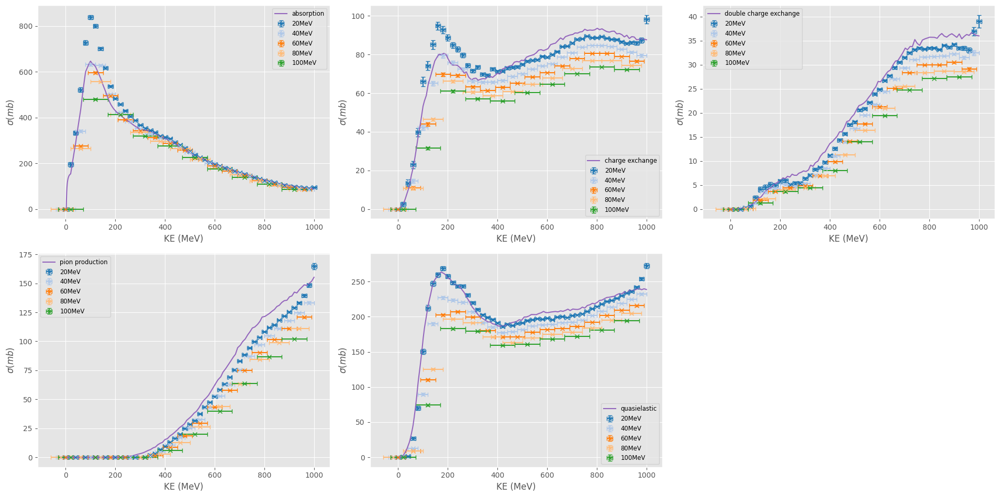

In [58]:
def ESliceWidth(toy : cross_section.Toy, slice_widths : float, energy_range : list):
    """ See how cross section varies as a function of slice thickness, using the single profile toy.

    Args:
        slice_width (float): energy slice width (MeV)
        energy_range (list): energy range of slices (MeV)
    """
    energy_slices = []
    slice_dEdX = []
    for s in slice_widths:
        energy_slices.append(cross_section.Slices(s, min(energy_range), max(energy_range), reversed = True))
        slice_dEdX.append(cross_section.EnergySlice.Slice_dEdX(energy_slices[-1], cross_section.Particle.from_pdgid(211)))

    for _, c in Plots.IterMultiPlot(toy_gaussian.exclusive_processes):
        n_interact_exclusive = []
        n_incident = []
        for i in range(len(slice_widths)):
            _, _, n_int, n_inc = cross_section.EnergySlice.CountingExperiment(toy.df.KE_int, toy.df.KE_init, toy.outside_tpc, toy.df[c], energy_slices[i])
            n_interact_exclusive.append(n_int)
            n_incident.append(n_inc)
        xs = [cross_section.EnergySlice.TotalCrossSection(n_interact_exclusive[i], n_incident[i], slice_dEdX[i], energy_slices[i].width) for i in range(len(slice_widths))]

        geant_xs.Plot(c, color = "C8")
        for i in range(len(slice_widths)):
            Plots.Plot(energy_slices[i].pos[1:], xs[i][0][1:], xerr = energy_slices[i].width/2, yerr = xs[i][1][1:], marker = "x", linestyle = "", newFigure = False, label = f"{slice_widths[i]}MeV")
    pdf.Save()
    return

ESliceWidth(toy_gaussian, [20, 40, 60, 80, 100], [-20, 1020])

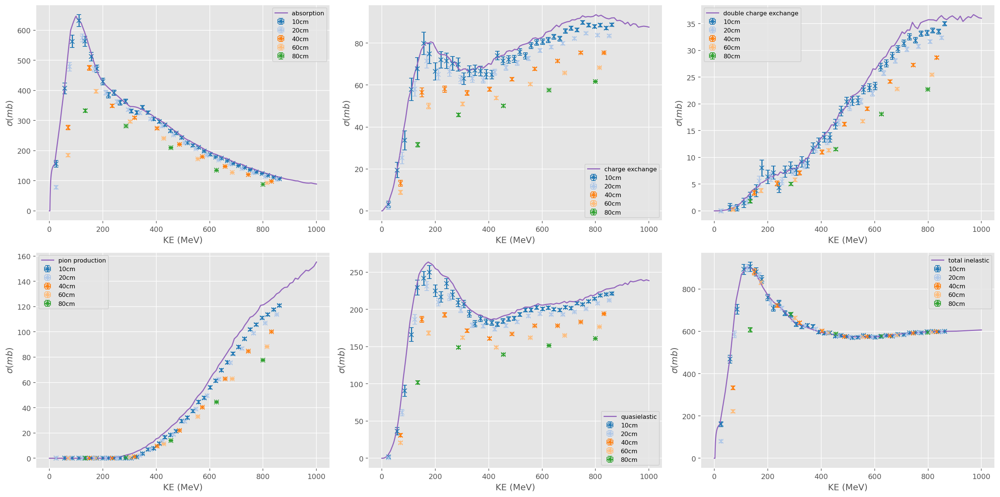

In [102]:
def ThinSliceWitdh(slice_widths : float, position_range : list):
    """ See how cross section varies as a function of slice thickness, using the single profile toy.

    Args:
        slice_width (float): spatial slice width (cm)
        position_range (list): min, max position for slices (cm)
    """
    slices = []
    mean_energy = []
    decayed = toy_single.inclusive_process == "decay"
    for s in slice_widths:
        slices.append(cross_section.Slices(s, min(position_range), max(position_range)))
        mean_energy.append(cross_section.ThinSlice.MeanSliceEnergy(toy_single.KE_int[~decayed], toy_single.z_int[~decayed], slices[-1]))

    for _, c in Plots.IterMultiPlot(toy_gaussian.exclusive_processes):
        hists = [cross_section.ThinSlice.CountingExperiment(toy_single.z_int, toy_single[c], slices[i]) for i in range(len(slice_widths))]
        xs = [cross_section.ThinSlice.TotalCrossSection(hists[i][1], hists[i][0], slices[i].width) for i in range(len(slice_widths))]

        geant_xs.Plot(c, color = "C8")
        for i in range(len(slice_widths)):
            Plots.Plot(mean_energy[i][0], xs[i][0], xerr = mean_energy[i][1], yerr = xs[i][1], marker = "x", linestyle = "", newFigure = False, label = f"{slice_widths[i]}cm")
    pdf.Save()
    return

ThinSliceWitdh([10, 20, 40, 60, 80], [-10, 720])
pdf.close()

In [104]:
def PlotMeanEnergies(pos : np.array, energy : np.array, slices : cross_section.Slices, range : list = None):
    """ Plot energies in each spatial slice in a giant subplot

    Args:
        pos (np.array): position
        energy (np.array): kinetic energy
        slices (cross_section.Slices): spatial slices
        range (list, optional): energy range. Defaults to None.
    """
    for _, s in Plots.IterMultiPlot(list(slices)):
        mask = slices.pos_to_num(pos) == s.num
        e = energy[mask]
        if len(e) == 0:
            plt.gcf().delaxes(plt.gca())
            continue
        Plots.PlotHist(e, title = s.__str__(), range = range, xlabel = "$KE^{true}_{int}$ (MeV)", newFigure = False)


def PlotMeanEnergiesSplit(pos : np.array, energy : np.array, slices : cross_section.Slices, range : list = None):
    """ Plot energies in each spatial slice in it's own figure, and save to a pdf file.

    Args:
        pos (np.array): position
        energy (np.array): kinetic energy
        slices (cross_section.Slices): spatial slices
        range (list, optional): energy range. Defaults to None.
    """
    pdf = Plots.PlotBook("gaussian_toy_energy_bins.pdf")
    for s in list(slices):
        mask = slices.pos_to_num(pos) == s.num
        e = energy[mask]
        if len(e) == 0: continue
        Plots.PlotHist(e, title = s.__str__(), range = range, xlabel = "$KE^{true}_{int}$ (MeV)")
        pdf.Save()
        plt.close() # still causes the plot to be rendered in the terminal output.
        plt.cla()
    pdf.close()


# Parameterising Cross section curves

In [4]:
class NNXS(cross_section.Fitting.FitFunction):
    n_params = 3

    def __new__(cls, x, p0, p1, p2, p3, p4) -> np.array:
        return cls.func(x, p0, p1, p2, p3, p4)

    @staticmethod
    def func(x, p0, p1, p2, p3, p4):
        return (p2 + p1 * np.log(x)/x + p0/(x**2) + p3*(x**p4))**-1

    def bounds(x, y):
        lims = np.array([
            (0.1, np.inf),
            (0, np.inf),
            (0, np.inf),
            (0, np.inf),
            (0, np.inf),
        ])
        return (lims[:, 0], lims[:, 1])

class dgcb(cross_section.Fitting.FitFunction):

    def __new__(cls, x, p0, p1, p2, p3, p4, p5, p6, p7, p8, p9) -> np.array:
        return cls.func(x, p0, p1, p2, p3, p4, p5, p6, p7, p8, p9)

    @staticmethod
    def dg(z, a, b, c):
        return a * np.exp(-0.5 * (z - c)**2) + b * np.exp(-0.5 * (z + c)**2)

    @staticmethod
    def ExponentNormalisation(gamma, l, a, b, c):
        A = (l/abs(gamma))**l * dgcb.dg(gamma, a, b, c)
        B = (l/abs(gamma)) - abs(gamma)
        return A, B

    def func(x, p0, p1, p2, p3, p4, p5, p6, p7, p8, p9):
        z = (x - p1) / p2

        A, B = dgcb.ExponentNormalisation(p6, p7, p3, p4, p5)
        C, D = dgcb.ExponentNormalisation(p8, p9, p3, p4, p5)

        E1 = A * (B-z)**(-p7)
        E2 = C * (D+z)**(-p9)
        y = dgcb.dg(z, p3, p4, p5)
        y = np.where(z < -p6, E1, y)
        y = np.where(z > p8, E2, y)
        return p0 * y

    def p0(x, y):
        return None

    def bounds(x, y):
        lims = np.array([
            (0, np.inf),
            (min(x), max(x)),
            (0.001, max(x) - min(x)),

            (0, np.inf),
            (0, np.inf),
            (0, np.inf),

            (0.0001, np.inf),
            (0, 10),

            (0.0001, np.inf),
            (0, 10),
        ])
        return (lims[:, 0], lims[:, 1])

class cauchy_gaussian(cross_section.Fitting.FitFunction):
    n_params = 5

    def __new__(cls, x, p0, p1, p2, p3, p4, p5, p6) -> np.array:
        return cls.func(x, p0, p1, p2, p3, p4, p5)

    def func(x, p0, p1, p2, p3, p4, p5, p6):
        c = p0 * p1/(((x-p2)/p6)**2 + p1**2)
        g = p3 * np.exp(-((x-p4)/p5)**2)
        return c + g

    def bounds(x, y):
        lims = np.array([
            (0, np.inf),
            (0, np.inf),
            (min(x), max(x)),

            (0, np.inf),
            (min(x), max(x)),
            (0.001, np.inf),
            (0.001, np.inf),
        ])
        return (lims[:, 0], lims[:, 1])


class lognormal(cross_section.Fitting.FitFunction):
    n_params = 3

    def __new__(cls, x, p0, p1, p2) -> np.array:
        return cls.func(x, p0, p1, p2)

    def func(x, p0, p1, p2):
        return p0 * (1 / (x * p2 * np.sqrt(2 * np.pi))) * np.exp(-((np.log(x) - p1)**2) / (2 * p2**2))

    def bounds(x, y):
        lims = np.array([
            (0, np.inf),
            (-1, np.inf),
            (0.001, np.inf),
        ])
        return (lims[:, 0], lims[:, 1])


class lognormal_gaussian(cross_section.Fitting.FitFunction):
    n_params = 8

    def __new__(cls, x, p0, p1, p2, p3, p4, p5, p6, p7) -> np.array:
        return cls.func(x, p0, p1, p2, p3, p4, p5, p6, p7)

    def func(x, p0, p1, p2, p3, p4, p5, p6, p7):
        gaussian_component = norm.pdf(x, loc=p4, scale=p5)
        lognormal_component = lognorm.pdf(x, s = p2, scale = p1)
        exponential_component = np.exp(-p6 * x)
        return p0 * lognormal_component + p3 * gaussian_component + p7 * exponential_component # Adjust weights as needed

    def bounds(x, y):
        lims = np.array([
            (0, 1),
            (min(x), max(x)),
            (0.001, np.inf),

            (0, 1),
            (min(x), max(x)),
            (0.001, np.inf),

            (-np.inf, np.inf),
            (-np.inf, np.inf),

        ])
        return (lims[:, 0], lims[:, 1])    


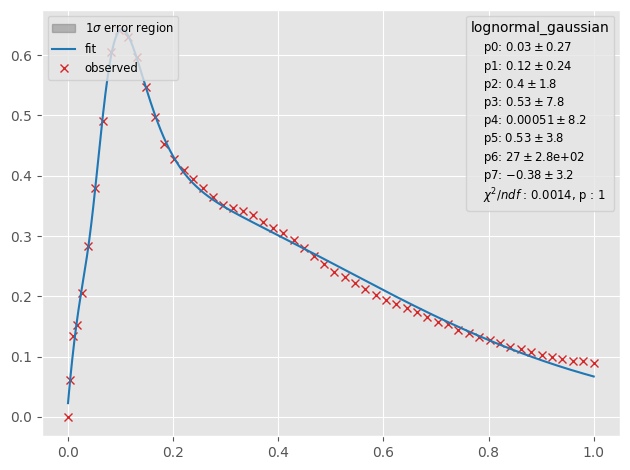

In [5]:
xs_sim = cross_section.GeantCrossSections(energy_range = [0, 1000])

sampling_factor = 20
x = xs_sim.KE[::sampling_factor]/1000
y = xs_sim.absorption[::sampling_factor]/1000

results = cross_section.Fitting.Fit(x, y, None, lognormal_gaussian, method = "trf", plot = True)

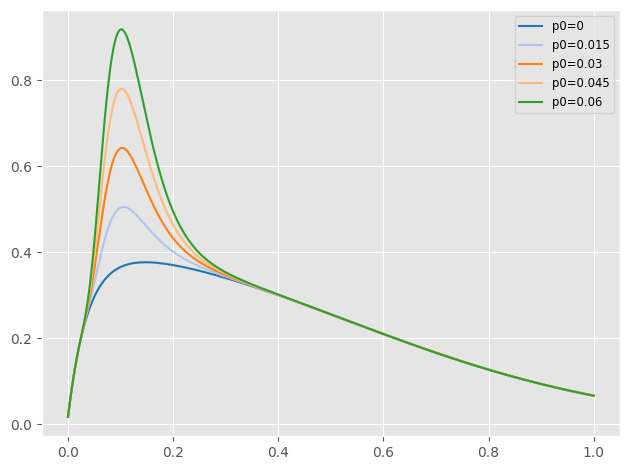

In [54]:
def CreateModPDF(params : tuple) -> dict[np.array]:
    return {
        "KE" : xs_sim.KE,
        "absorption" : lognormal_gaussian(xs_sim.KE/1000, *params) * 1000
    }


#* 0, 3, 7
p = 0
parameter_scale_factor = 1
n_points = 5

parameter_range = [-results[0][p], results[0][p]]

x_1 = np.linspace(0, 1, 1000)

modified_PDFs = {}

plt.figure()
for i in np.linspace(min(parameter_range), max(parameter_range), n_points, True):
    modifiled_params = np.array(results[0])
    modifiled_params[p] = modifiled_params[p] + i
    Plots.Plot(x_1, lognormal_gaussian(x_1, *modifiled_params), newFigure = False, label = f"p{p}={modifiled_params[p]:.2g}")
    
    label = f"{100 * i/results[0][p]:.2g}"

    modified_PDFs[label] = CreateModPDF(modifiled_params)


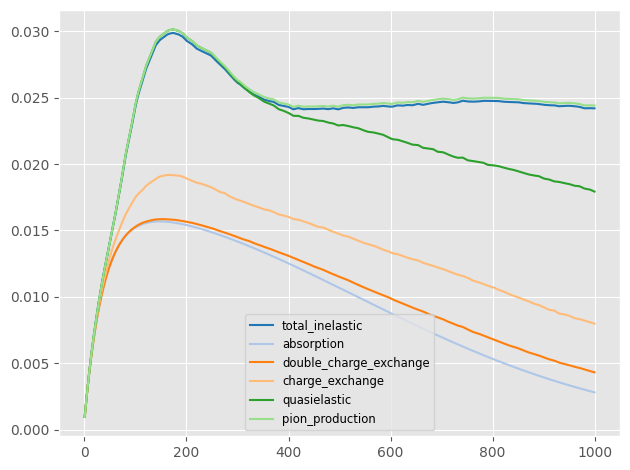

In [55]:
pdfs = cex_toy_generator.GenerateStackedPDFs(2, modified_PDFs = list(modified_PDFs.values())[0])

for k, v in pdfs.items():
    Plots.Plot(xs_sim.KE, v(xs_sim.KE), label = k, newFigure = False)

# beam instrumentation profile

In [85]:
def FitBeamProfile(KE_init, func : cross_section.Fitting.FitFunction, KE_range : list, bins : int, book : Plots.PlotBook = Plots.PlotBook.null):
    x = np.linspace(min(KE_range), max(KE_range), bins)
    y = np.histogram(KE_init, bins = x)[0]

    Plots.plt.figure()
    params = cross_section.Fitting.Fit((x[1:] + x[:-1])/2, y, np.sqrt(y), func, plot = (book.open is False))[0]
    book = book.Save()
    return {
        "function" : func.__name__,
        "parameters" : {f"p{i}" : params[i] for i in range(len(params))},
        "min" : min(KE_range),
        "max" : max(KE_range)
        }

profile = FitBeamProfile(mc_quantities["true"]["KE_init"], cross_section.Fitting.crystal_ball, [550, 1100], 50)

/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/Fitting.py:188: RuntimeWarning: invalid value encountered in power
  y = np.where(t > -p3, np.exp(-t**2 / 2), A * (B - t)**-p4)


In [87]:
KE_init = cross_section.Fitting.RejectionSampling(int(1E6), profile["min"], profile["max"], getattr(cross_section.Fitting, profile["function"]), profile["parameters"])

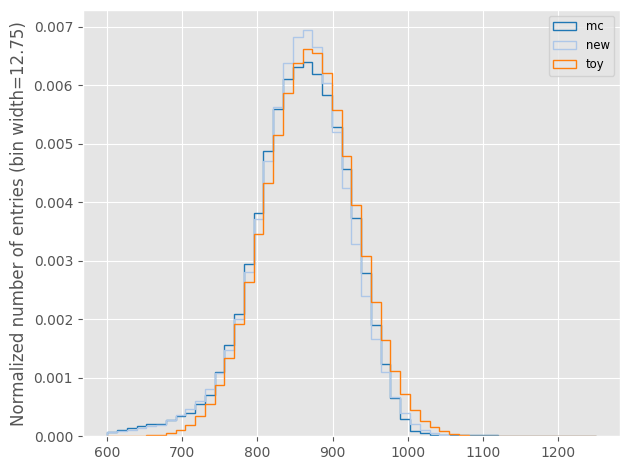

In [88]:
Plots.PlotHistComparison([mc_quantities["true"]["KE_init"], KE_init, toy_gaussian.df.KE_init], labels = ["mc", "new", "toy"], x_range = [600, 1250], bins = 50)

# Encorperating particle decays

particles have essentially three options when passing through a thin target:
 1. interact with the material inelastically
 2. pass through (this includes elasitc sccatters)
 3. decay

if we treat elastic scatters as essentially no interaction, then just sampling from the inelastic PDF covers the first two cases, but not the third. In order to do the third, try the following:
 1. for each particle, compute a lifetime at the start of the simulation, this can be done with the typical exponential decay of particles and the particle lifetime in the pdg database
 2. keep track of each particles time as it passes through the TPC, note this muse be done for each particle separately as we allow distributions of kinetic energy. This is done at each thin target using the relation to $\beta$ and $KE$ derived below
 3. if the particles current time exceeds it's lifetime, classify it as decayed i.e. it did not survive.

Including this affect should lower the number of interactions at the low energy regime and thus elminate this issue of the cross section diverging. Note this means we need to also keep track of $\beta$ as the particle looses energy in each slice.

## Derivation of $\beta$
$$ KE = \sqrt{p^{2} + m^{2}} - m = \sqrt{(m\beta\gamma)^{2} + m^{2}} - m = \sqrt{\left(\frac{m\beta}{\sqrt{1 - \beta^{2}}}\right)^{2} + m^{2}} = \sqrt{\frac{m^{2}\beta^{2}}{1 - \beta^{2}} + m^{2}} = m\sqrt{\frac{\beta^{2}}{1 - \beta^{2}} + 1} $$

$$ \left(\frac{KE}{m}\right)^{2} - 1 = \frac{\beta^{2}}{1 - \beta^{2}} $$

$$ \beta^{2} = \left(\left(\frac{KE}{m}\right)^{2} - 1\right)\left(1 - \beta^{2}\right) = \left(\left(\frac{KE}{m}\right)^{2} - 1\right) - \left(\left(\frac{KE}{m}\right)^{2} - 1\right)\beta^{2} $$

$$ \left(\frac{KE}{m}\right)^{2} - 1 = \beta^{2} + \left(\left(\frac{KE}{m}\right)^{2} - 1\right)\beta^{2} = \left(\frac{KE}{m}\right)^{2}\beta^{2} $$

$$ \beta^{2} = \frac{\left(\frac{KE}{m}\right)^{2} - 1 }{ \left(\frac{KE}{m}\right)^{2} }$$

$$\therefore \beta = \sqrt{1 - \frac{1}{ \left(\frac{KE}{m}\right)^{2} }} $$


## Particle lifetime
$$ N(t) = N_{0} e^{-\frac{t}{\tau}} $$

$$ P_{decay} = e^{-\frac{t}{\tau}} $$

$$\ln\left( P_{decay} \right) = -\frac{t}{tau} $$

$$ t = -\tau\ln\left( P_{decay} \right) $$

So, sample from a random uniform distribution to get $P_{int}$

## Time elapsed at current slice
$$ t_{elapsed} = l \beta $$

# Spatial slice method

/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:650: RuntimeWarning: invalid value encountered in divide
  mean_energy = sum_energy / counts
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:652: RuntimeWarning: invalid value encountered in divide
  std_energy = np.divide(sum_energy_sqr, counts) - mean_energy**2


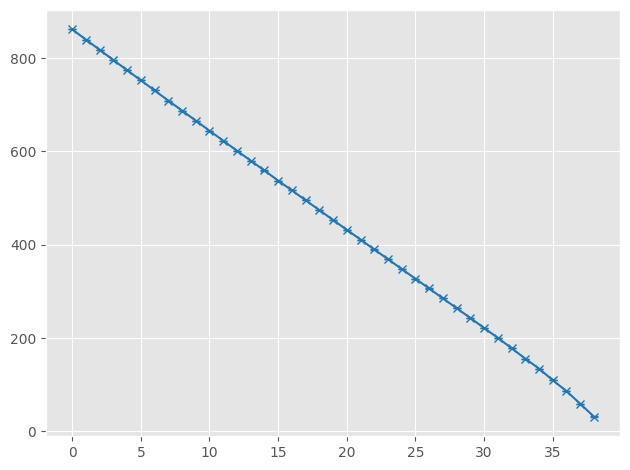

In [5]:
slices = cross_section.Slices(10, -10, 720)
mean_energy = cross_section.ThinSlice.MeanSliceEnergy(toy_single.KE_int[toy_single.total_inelastic], toy_single.z_int[toy_single.total_inelastic], slices)

Plots.Plot(slices.num[:-1], mean_energy[0], marker = "x", yerr = mean_energy[1])

/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:670: RuntimeWarning: invalid value encountered in divide
  xs = np.log(n_incident / (n_incident - n_interact)) # calculate a dimensionless cross section
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:673: RuntimeWarning: invalid value encountered in divide
  v_interact = n_interact*(1- (n_interact/n_incident)) # binomial uncertainty
/home/sb16165/Documents/pi0-analysis/analysis/python/analysis/cross_section.py:675: RuntimeWarning: divide by zero encountered in divide
  xs_e = (1/n_incident) * (1/(n_incident - n_interact)) * (n_interact**2 * v_incident + n_incident**2 * v_interact)**0.5


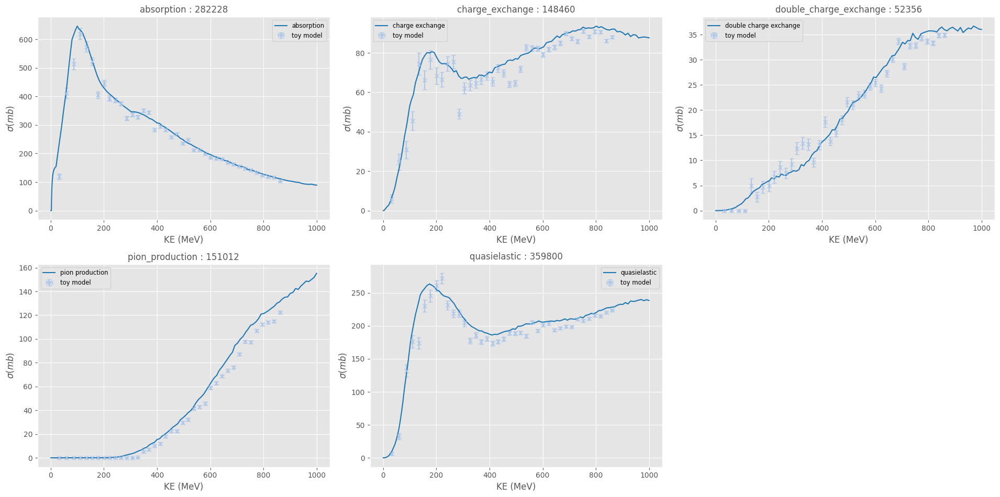

In [19]:
hists = {c : cross_section.ThinSlice.CountingExperiment(toy_single.z_int, toy_single[c], slices) for c in geant_xs.exclusive_processes}
xs = {c : cross_section.ThinSlice.TotalCrossSection(hists[c][1], hists[c][0], slices.width) for c in geant_xs.exclusive_processes}

for i, c in Plots.IterMultiPlot(geant_xs.exclusive_processes, sharex = True):
    geant_xs.Plot(c)
    Plots.Plot(mean_energy[0], xs[c][0], xerr = mean_energy[1], yerr = xs[c][1], marker = "x", linestyle = "", newFigure = False, label = "toy model", title = f"{c} : {sum(toy_single[c])}")